### Yelp Dataset Exploration and Analysis

## Imports

In [ ]:
import numpy as np
import pandas as pd
import json

# misc
import random
import gc
import warnings
import math
import geopy.distance
from geopy.point import Point
from tqdm import tqdm
from tqdm.auto import tqdm  # for notebooks

# encoding
from sklearn.preprocessing import OrdinalEncoder, LabelEncoder

# scaling
from sklearn.preprocessing import StandardScaler, MinMaxScaler

# viz
import matplotlib.pyplot as plt
import seaborn as sns

# graph viz
import plotly.offline as pyo
from plotly.graph_objs import *
import plotly.graph_objs as go

# map section
import folium
import folium.plugins as plugins
from folium.plugins import FastMarkerCluster
from mpl_toolkits.basemap import Basemap

# graph section
import networkx as nx

# settings
color = sns.color_palette()
sns.set_style("dark")
# warnings.filterwarnings("ignore")
pyo.init_notebook_mode()  # render interactive plots within the nb

# clustering
import sklearn
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

# statistical test
from scipy import stats

tqdm.pandas()

pd.set_option('display.max_columns', None)

%matplotlib inline

## Read Datasets

In [ ]:
business_df = pd.read_csv("./dataset_challenge/yelp_business.csv")
business_attributes_df = pd.read_csv("./dataset_challenge/yelp_business_attributes.csv")
business_hours_df = pd.read_csv("./dataset_challenge/yelp_business_hours.csv")
check_in_df = pd.read_csv("./dataset_challenge/yelp_checkin.csv")
reviews_df = pd.read_csv("./dataset_challenge/yelp_review.csv")
tip_df = pd.read_csv("./dataset_challenge/yelp_tip.csv")
user_df = pd.read_csv("./dataset_challenge/yelp_user.csv")

## Business EDA

### Table Analysis

In [ ]:
business_df.head()

,business_id,name,neighborhood,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,categories
0,FYWN1wneV18bWNgQjJ2GNg,"""Dental by Design""",NaN,"""4855 E Warner Rd, Ste B9""",Ahwatukee,AZ,85044,33.330690,-111.978599,4.0,22,1,Dentists;General Dentistry;Health & Medical;Or...
1,He-G7vWjzVUysIKrfNbPUQ,"""Stephen Szabo Salon""",NaN,"""3101 Washington Rd""",McMurray,PA,15317,40.291685,-80.104900,3.0,11,1,Hair Stylists;Hair Salons;Men's Hair Salons;Bl...
2,KQPW8lFf1y5BT2MxiSZ3QA,"""Western Motor Vehicle""",NaN,"""6025 N 27th Ave, Ste 1""",Phoenix,AZ,85017,33.524903,-112.115310,1.5,18,1,Departments of Motor Vehicles;Public Services ...
3,8DShNS-LuFqpEWIp0HxijA,"""Sports Authority""",NaN,"""5000 Arizona Mills Cr, Ste 435""",Tempe,AZ,85282,33.383147,-111.964725,3.0,9,0,Sporting Goods;Shopping
4,PfOCPjBrlQAnz__NXj9h_w,"""Brick House Tavern + Tap""",NaN,"""581 Howe Ave""",Cuyahoga Falls,OH,44221,41.119535,-81.475690,3.5,116,1,American (New);Nightlife;Bars;Sandwiches;Ameri...


In [ ]:
# Checking the data types of our variables
business_df.info()

# Checking missing values
business_df.isnull().sum()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 174567 entries, 0 to 174566
Data columns (total 13 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   business_id   174567 non-null  object 
 1   name          174567 non-null  object 
 2   neighborhood  68015 non-null   object 
 3   address       174567 non-null  object 
 4   city          174566 non-null  object 
 5   state         174566 non-null  object 
 6   postal_code   173944 non-null  object 
 7   latitude      174566 non-null  float64
 8   longitude     174566 non-null  float64
 9   stars         174567 non-null  float64
 10  review_count  174567 non-null  int64  
 11  is_open       174567 non-null  int64  
 12  categories    174567 non-null  object 
dtypes: float64(3), int64(2), object(8)
memory usage: 17.3+ MB


business_id          0
name                 0
neighborhood    106552
address              0
city                 1
state                1
postal_code        623
latitude             1
longitude            1
stars                0
review_count         0
is_open              0
categories           0
dtype: int64

In [ ]:
check_in_df.head()

,business_id,weekday,hour,checkins
0,3Mc-LxcqeguOXOVT_2ZtCg,Tue,0:00,12
1,SVFx6_epO22bZTZnKwlX7g,Wed,0:00,4
2,vW9aLivd4-IorAfStzsHww,Tue,14:00,1
3,tEzxhauTQddACyqdJ0OPEQ,Fri,19:00,1
4,CEyZU32P-vtMhgqRCaXzMA,Tue,17:00,1


In [ ]:
# Checking the data types of our variables
check_in_df.info()

# Checking missing values
check_in_df.isnull().sum()

# No missing values

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3911218 entries, 0 to 3911217
Data columns (total 4 columns):
 #   Column       Dtype 
---  ------       ----- 
 0   business_id  object
 1   weekday      object
 2   hour         object
 3   checkins     int64 
dtypes: int64(1), object(3)
memory usage: 119.4+ MB


business_id    0
weekday        0
hour           0
checkins       0
dtype: int64

In [ ]:
reviews_df.head()

,review_id,user_id,business_id,stars,date,text,useful,funny,cool
0,vkVSCC7xljjrAI4UGfnKEQ,bv2nCi5Qv5vroFiqKGopiw,AEx2SYEUJmTxVVB18LlCwA,5,2016-05-28,Super simple place but amazing nonetheless. It...,0,0,0
1,n6QzIUObkYshz4dz2QRJTw,bv2nCi5Qv5vroFiqKGopiw,VR6GpWIda3SfvPC-lg9H3w,5,2016-05-28,Small unassuming place that changes their menu...,0,0,0
2,MV3CcKScW05u5LVfF6ok0g,bv2nCi5Qv5vroFiqKGopiw,CKC0-MOWMqoeWf6s-szl8g,5,2016-05-28,Lester's is located in a beautiful neighborhoo...,0,0,0
3,IXvOzsEMYtiJI0CARmj77Q,bv2nCi5Qv5vroFiqKGopiw,ACFtxLv8pGrrxMm6EgjreA,4,2016-05-28,Love coming here. Yes the place always needs t...,0,0,0
4,L_9BTb55X0GDtThi6GlZ6w,bv2nCi5Qv5vroFiqKGopiw,s2I_Ni76bjJNK9yG60iD-Q,4,2016-05-28,Had their chocolate almond croissant and it wa...,0,0,0


In [ ]:
reviews_df[["text"]]

,text
0,Super simple place but amazing nonetheless. It...
1,Small unassuming place that changes their menu...
2,Lester's is located in a beautiful neighborhoo...
3,Love coming here. Yes the place always needs t...
4,Had their chocolate almond croissant and it wa...
...,...
5261663,"Bought groupon $39 for 4 months from groupon, ..."
5261664,"Spring rolls was pretty good, cod was a bit ra..."
5261665,"Had a 8 dish set meal, was enough for 10 peopl..."
5261666,"A small, cozy family run Authentic korean rest..."


In [ ]:
# Checking the data types of our variables
reviews_df.info()

# Checking missing values
reviews_df.isnull().sum()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5261668 entries, 0 to 5261667
Data columns (total 9 columns):
 #   Column       Dtype 
---  ------       ----- 
 0   review_id    object
 1   user_id      object
 2   business_id  object
 3   stars        int64 
 4   date         object
 5   text         object
 6   useful       int64 
 7   funny        int64 
 8   cool         int64 
dtypes: int64(4), object(5)
memory usage: 361.3+ MB


review_id      0
user_id        0
business_id    0
stars          0
date           0
text           0
useful         0
funny          0
cool           0
dtype: int64

In [ ]:
tip_df.head()

,text,date,likes,business_id,user_id
0,Great breakfast large portions and friendly wa...,2015-08-12,0,jH19V2I9fIslnNhDzPmdkA,ZcLKXikTHYOnYt5VYRO5sg
1,Nice place. Great staff. A fixture in the tow...,2014-06-20,0,dAa0hB2yrnHzVmsCkN4YvQ,oaYhjqBbh18ZhU0bpyzSuw
2,Happy hour 5-7 Monday - Friday,2016-10-12,0,dAa0hB2yrnHzVmsCkN4YvQ,ulQ8Nyj7jCUR8M83SUMoRQ
3,"Parking is a premium, keep circling, you will ...",2017-01-28,0,ESzO3Av0b1_TzKOiqzbQYQ,ulQ8Nyj7jCUR8M83SUMoRQ
4,Homemade pasta is the best in the area,2017-02-25,0,k7WRPbDd7rztjHcGGkEjlw,ulQ8Nyj7jCUR8M83SUMoRQ


In [ ]:
# Checking the data types of our variables
tip_df.info()

# Checking missing values
tip_df.isnull().sum()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1098324 entries, 0 to 1098323
Data columns (total 5 columns):
 #   Column       Non-Null Count    Dtype 
---  ------       --------------    ----- 
 0   text         1098319 non-null  object
 1   date         1098324 non-null  object
 2   likes        1098324 non-null  int64 
 3   business_id  1098324 non-null  object
 4   user_id      1098324 non-null  object
dtypes: int64(1), object(4)
memory usage: 41.9+ MB


text           5
date           0
likes          0
business_id    0
user_id        0
dtype: int64

In [ ]:
user_df.head()

,user_id,name,review_count,yelping_since,friends,useful,funny,cool,fans,elite,average_stars,compliment_hot,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
0,JJ-aSuM4pCFPdkfoZ34q0Q,Chris,10,2013-09-24,"0njfJmB-7n84DlIgUByCNw, rFn3Xe3RqHxRSxWOU19Gpg...",0,0,0,0,NaN,3.70,0,0,0,0,0,0,0,0,0,0,0
1,uUzsFQn_6cXDh6rPNGbIFA,Tiffy,1,2017-03-02,NaN,0,0,0,0,NaN,2.00,0,0,0,0,0,0,0,0,0,0,0
2,mBneaEEH5EMyxaVyqS-72A,Mark,6,2015-03-13,NaN,0,0,0,0,NaN,4.67,0,0,0,0,0,0,0,0,0,0,0
3,W5mJGs-dcDWRGEhAzUYtoA,Evelyn,3,2016-09-08,NaN,0,0,0,0,NaN,4.67,0,0,0,0,0,0,0,0,0,0,0
4,4E8--zUZO1Rr1IBK4_83fg,Lisa,11,2012-07-16,NaN,4,0,0,0,NaN,3.45,0,0,0,0,0,0,0,0,0,1,0


In [ ]:
# Checking the data types of our variables
user_df.info()

# Checking missing values
user_df.isnull().sum()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1326100 entries, 0 to 1326099
Data columns (total 22 columns):
 #   Column              Non-Null Count    Dtype  
---  ------              --------------    -----  
 0   user_id             1326100 non-null  object 
 1   name                1325585 non-null  object 
 2   review_count        1326100 non-null  int64  
 3   yelping_since       1326100 non-null  object 
 4   friends             760007 non-null   object 
 5   useful              1326100 non-null  int64  
 6   funny               1326100 non-null  int64  
 7   cool                1326100 non-null  int64  
 8   fans                1326100 non-null  int64  
 9   elite               60818 non-null    object 
 10  average_stars       1326100 non-null  float64
 11  compliment_hot      1326100 non-null  int64  
 12  compliment_more     1326100 non-null  int64  
 13  compliment_profile  1326100 non-null  int64  
 14  compliment_cute     1326100 non-null  int64  
 15  compliment_list

user_id                     0
name                      515
review_count                0
yelping_since               0
friends                566093
useful                      0
funny                       0
cool                        0
fans                        0
elite                 1265282
average_stars               0
compliment_hot              0
compliment_more             0
compliment_profile          0
compliment_cute             0
compliment_list             0
compliment_note             0
compliment_plain            0
compliment_cool             0
compliment_funny            0
compliment_writer           0
compliment_photos           0
dtype: int64

In [ ]:
business_attributes_df.head()

,business_id,AcceptsInsurance,ByAppointmentOnly,BusinessAcceptsCreditCards,BusinessParking_garage,BusinessParking_street,BusinessParking_validated,BusinessParking_lot,BusinessParking_valet,HairSpecializesIn_coloring,HairSpecializesIn_africanamerican,HairSpecializesIn_curly,HairSpecializesIn_perms,HairSpecializesIn_kids,HairSpecializesIn_extensions,HairSpecializesIn_asian,HairSpecializesIn_straightperms,RestaurantsPriceRange2,GoodForKids,WheelchairAccessible,BikeParking,Alcohol,HasTV,NoiseLevel,RestaurantsAttire,Music_dj,Music_background_music,Music_no_music,Music_karaoke,Music_live,Music_video,Music_jukebox,Ambience_romantic,Ambience_intimate,Ambience_classy,Ambience_hipster,Ambience_divey,Ambience_touristy,Ambience_trendy,Ambience_upscale,Ambience_casual,RestaurantsGoodForGroups,Caters,WiFi,RestaurantsReservations,RestaurantsTakeOut,HappyHour,GoodForDancing,RestaurantsTableService,OutdoorSeating,RestaurantsDelivery,BestNights_monday,BestNights_tuesday,BestNights_friday,BestNights_wednesday,BestNights_thursday,BestNights_sunday,BestNights_saturday,GoodForMeal_dessert,GoodForMeal_latenight,GoodForMeal_lunch,GoodForMeal_dinner,GoodForMeal_breakfast,GoodForMeal_brunch,CoatCheck,Smoking,DriveThru,DogsAllowed,BusinessAcceptsBitcoin,Open24Hours,BYOBCorkage,BYOB,Corkage,DietaryRestrictions_dairy-free,DietaryRestrictions_gluten-free,DietaryRestrictions_vegan,DietaryRestrictions_kosher,DietaryRestrictions_halal,DietaryRestrictions_soy-free,DietaryRestrictions_vegetarian,AgesAllowed,RestaurantsCounterService
0,FYWN1wneV18bWNgQjJ2GNg,Na,Na,Na,True,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na
1,He-G7vWjzVUysIKrfNbPUQ,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,True,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na
2,8DShNS-LuFqpEWIp0HxijA,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,True,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na
3,PfOCPjBrlQAnz__NXj9h_w,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,False,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na
4,o9eMRCWt5PkpLDE0gOPtcQ,Na,Na,Na,Na,False,False,False,False,False,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,False,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na


In [ ]:
business_attributes_df.info()
business_attributes_df.isnull().sum()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 152041 entries, 0 to 152040
Data columns (total 82 columns):
 #   Column                             Non-Null Count   Dtype 
---  ------                             --------------   ----- 
 0   business_id                        152041 non-null  object
 1   AcceptsInsurance                   152041 non-null  object
 2   ByAppointmentOnly                  152041 non-null  object
 3   BusinessAcceptsCreditCards         152041 non-null  object
 4   BusinessParking_garage             152041 non-null  object
 5   BusinessParking_street             152041 non-null  object
 6   BusinessParking_validated          152041 non-null  object
 7   BusinessParking_lot                152041 non-null  object
 8   BusinessParking_valet              152041 non-null  object
 9   HairSpecializesIn_coloring         152041 non-null  object
 10  HairSpecializesIn_africanamerican  152041 non-null  object
 11  HairSpecializesIn_curly            152041 non-null  

business_id                       0
AcceptsInsurance                  0
ByAppointmentOnly                 0
BusinessAcceptsCreditCards        0
BusinessParking_garage            0
                                 ..
DietaryRestrictions_halal         0
DietaryRestrictions_soy-free      0
DietaryRestrictions_vegetarian    0
AgesAllowed                       0
RestaurantsCounterService         0
Length: 82, dtype: int64

In [ ]:
business_hours_df.head()

,business_id,monday,tuesday,wednesday,thursday,friday,saturday,sunday
0,FYWN1wneV18bWNgQjJ2GNg,7:30-17:0,7:30-17:0,7:30-17:0,7:30-17:0,7:30-17:0,NaN,NaN
1,He-G7vWjzVUysIKrfNbPUQ,9:0-20:0,9:0-20:0,9:0-20:0,9:0-20:0,9:0-16:0,8:0-16:0,NaN
2,KQPW8lFf1y5BT2MxiSZ3QA,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,8DShNS-LuFqpEWIp0HxijA,10:0-21:0,10:0-21:0,10:0-21:0,10:0-21:0,10:0-21:0,10:0-21:0,11:0-19:0
4,PfOCPjBrlQAnz__NXj9h_w,11:0-1:0,11:0-1:0,11:0-1:0,11:0-1:0,11:0-1:0,11:0-2:0,11:0-0:0


In [ ]:
business_hours_df.info()
business_hours_df.isnull().sum()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 174567 entries, 0 to 174566
Data columns (total 8 columns):
 #   Column       Non-Null Count   Dtype 
---  ------       --------------   ----- 
 0   business_id  174567 non-null  object
 1   monday       118874 non-null  object
 2   tuesday      126258 non-null  object
 3   wednesday    127437 non-null  object
 4   thursday     127936 non-null  object
 5   friday       127433 non-null  object
 6   saturday     113024 non-null  object
 7   sunday       83633 non-null   object
dtypes: object(8)
memory usage: 10.7+ MB


business_id        0
monday         55693
tuesday        48309
wednesday      47130
thursday       46631
friday         47134
saturday       61543
sunday         90934
dtype: int64

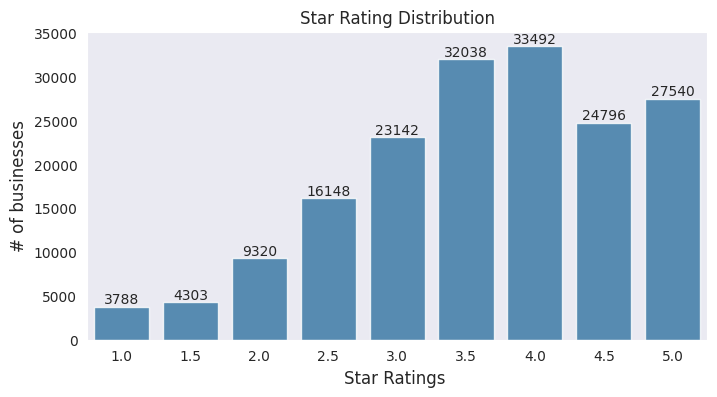

In [ ]:
# Get the distribution of the ratings
x = business_df["stars"].value_counts()
x = x.sort_index()

plt.figure(figsize=(8, 4))
ax = sns.barplot(x= x.index, y=x.values, alpha=0.8)
plt.title("Star Rating Distribution")
plt.ylabel("# of businesses", fontsize=12)
plt.xlabel("Star Ratings ", fontsize=12)

# Adding text labels
rects = ax.patches
labels = x.values
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(
        rect.get_x() + rect.get_width() / 2, height + 5, label, ha="center", va="bottom"
    )

plt.show()

In [ ]:
business_df["categories"]

0         Dentists;General Dentistry;Health & Medical;Or...
1         Hair Stylists;Hair Salons;Men's Hair Salons;Bl...
2         Departments of Motor Vehicles;Public Services ...
3                                   Sporting Goods;Shopping
4         American (New);Nightlife;Bars;Sandwiches;Ameri...
                                ...                        
174562                               Car Dealers;Automotive
174563                                Body Shops;Automotive
174564        Home Services;Property Management;Real Estate
174565                  Spray Tanning;Tanning;Beauty & Spas
174566                 Drugstores;Shopping;Health & Medical
Name: categories, Length: 174567, dtype: object

### What are the popular business categories?

In [ ]:
# remove NoneType data
filtered_business_cats = [cat for cat in business_df["categories"] if cat is not None]
print(filtered_business_cats[:20])
business_cats = " ".join(filtered_business_cats)
print(business_cats[:200])

['Dentists;General Dentistry;Health & Medical;Oral Surgeons;Cosmetic Dentists;Orthodontists', "Hair Stylists;Hair Salons;Men's Hair Salons;Blow Dry/Out Services;Hair Extensions;Beauty & Spas", 'Departments of Motor Vehicles;Public Services & Government', 'Sporting Goods;Shopping', 'American (New);Nightlife;Bars;Sandwiches;American (Traditional);Burgers;Restaurants', 'Italian;Restaurants', 'Real Estate Services;Real Estate;Home Services;Property Management', 'Shopping;Sporting Goods', 'Coffee & Tea;Ice Cream & Frozen Yogurt;Food', 'Automotive;Auto Detailing', 'Breakfast & Brunch;Gluten-Free;Coffee & Tea;Food;Restaurants;Sandwiches', 'Local Services;Self Storage', 'Bakeries;Bagels;Food', 'General Dentistry;Dentists;Endodontists;Cosmetic Dentists;Health & Medical;Orthodontists', 'Restaurants;American (Traditional)', 'Italian;French;Restaurants', 'Beauty & Spas;Nail Salons', 'Tires;Oil Change Stations;Auto Repair;Automotive', 'Barbers;Beauty & Spas', 'French;Food;Bakeries;Restaurants']
Den

                         category
0                        Dentists
1               General Dentistry
2                Health & Medical
3                   Oral Surgeons
4               Cosmetic Dentists
...                           ...
493456  Real Estate Spray Tanning
493457                    Tanning
493458   Beauty & Spas Drugstores
493459                   Shopping
493460           Health & Medical

[493461 rows x 1 columns]
x:  category
Restaurants                              19469
Shopping                                 13712
Food                                     10656
Home Services                             6885
Nightlife                                 6798
                                         ...  
Pet Sitting Bakeries                         1
Community Service/Non-Profit Plumbing        1
Guns & Ammo Notaries                         1
Shipping Centers Tires                       1
Real Estate Spray Tanning                    1
Name: count, Length: 59106, dtype: 

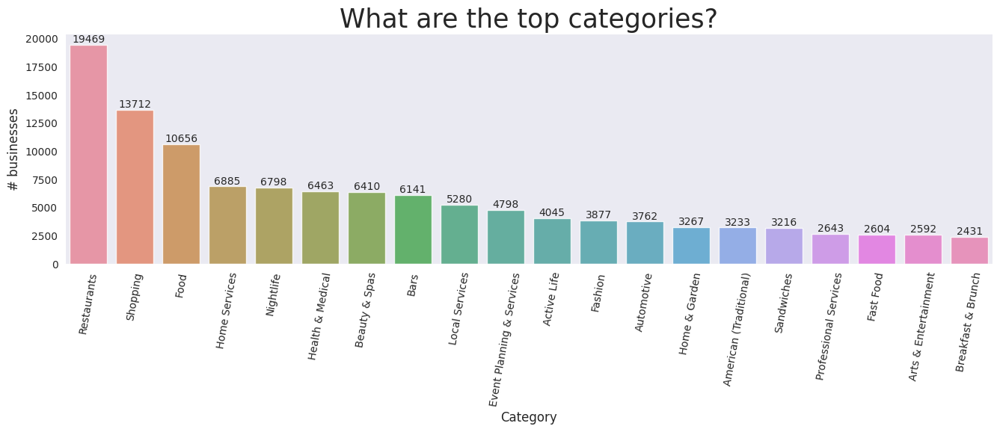

In [ ]:
cats = pd.DataFrame(business_cats.split(";"), columns=["category"])
print(cats)

x = cats.category.value_counts()
print(f"x: ", x)

print("There are ", len(x), " different types/categories of Businesses in Yelp!")
# prep for chart
x = x.sort_values(ascending=False)  # highest to lowest
x = x.iloc[0:20]

# chart
plt.figure(figsize=(16, 4))
ax = sns.barplot(x=x.index, y=x.values, alpha=0.8, hue=x.index)
plt.title("What are the top categories?", fontsize=25)
locs, labels = plt.xticks()
print(f"locs: {locs}, labels: {labels}")
plt.setp(labels, rotation=80)
plt.ylabel("# businesses", fontsize=12)
plt.xlabel("Category", fontsize=12)

# adding the text labels
rects = ax.patches
labels = x.values
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(
        rect.get_x() + rect.get_width() / 2, height + 5, label, ha="center", va="bottom"
    )

plt.show()

#### From the visualization, it can be seen that the most reviewed category is restaurants. Hence the scope of this FYP Project will be focusing on Yelp review data for restaurants.

## Visualising Yelp Reviews on the Globe 

In [ ]:
print(min(business_df["latitude"]))
print(max(business_df["latitude"]))
print(min(business_df["longitude"]))
print(max(business_df["longitude"]))


-36.086009
89.9993137156
-142.466649843
115.086769


Text(0.5, 1.0, 'Yelp reviews across the world')

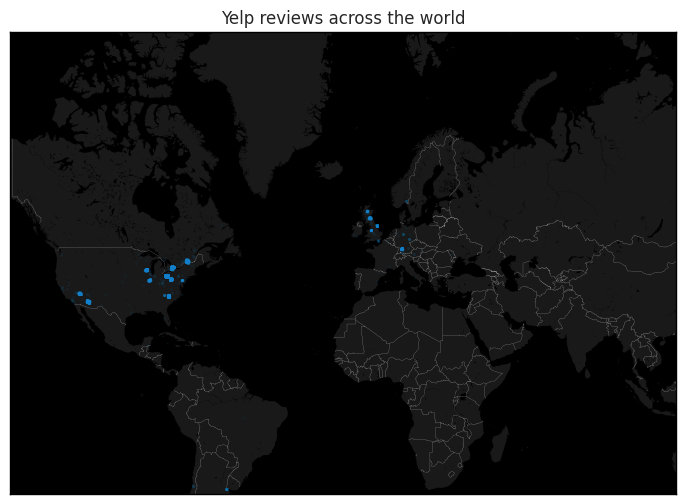

In [ ]:
# Define bounds 
lon_min, lon_max = -142, 115
lat_min, lat_max = -36, 80

# create the selector
idx_NA = (
    (business_df["longitude"] > lon_min)
    & (business_df["longitude"] < lon_max)
    & (business_df["latitude"] > lat_min)
    & (business_df["latitude"] < lat_max)
)
# apply the selector to subset
NA_business = business_df[idx_NA]

# initiate the figure
plt.figure(figsize=(12, 6))
m2 = Basemap(
    projection="merc",
    llcrnrlat=lat_min,
    urcrnrlat=lat_max,
    llcrnrlon=lon_min,
    urcrnrlon=lon_max,
    lat_ts=35,
    resolution="i",
)

m2.fillcontinents(color="#191919", lake_color="#000000")  # dark grey land, black lakes
m2.drawmapboundary(fill_color="#000000")  # black background
m2.drawcountries(linewidth=0.1, color="w")  # thin white line for country borders

# Plot the data
mxy = m2(NA_business["longitude"].tolist(), NA_business["latitude"].tolist())
m2.scatter(mxy[0], mxy[1], s=5, c="#1292db", lw=0, alpha=0.05, zorder=5)

plt.title("Yelp reviews across the world")

#### From the visualization, it can be seen that most of the reviews are from North America (mainly USA) with some from Europe.

## Check the top 20 cities which have the most businesses reviewed

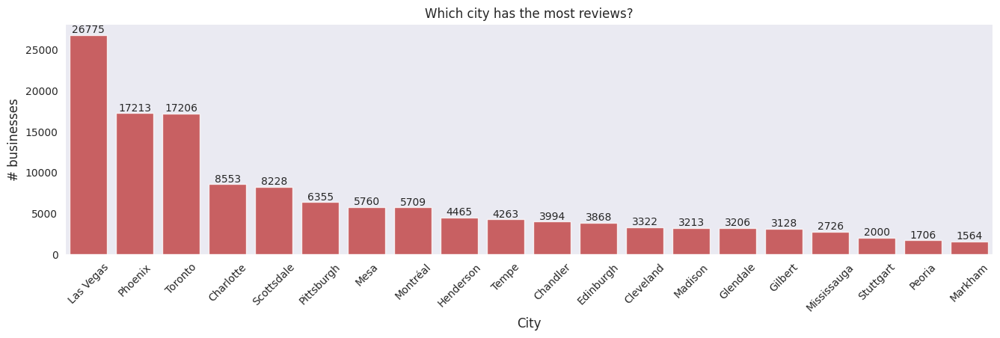

In [ ]:
# Get the distribution of the ratings
x = business_df["city"].value_counts()
x = x.sort_values(ascending=False)
x = x.iloc[0:20]
plt.figure(figsize=(16, 4))
ax = sns.barplot(x=x.index, y=x.values, alpha=0.8, color=color[3])
plt.title("Which city has the most reviews?")
locs, labels = plt.xticks()
plt.setp(labels, rotation=45)
plt.ylabel("# businesses", fontsize=12)
plt.xlabel("City", fontsize=12)

# adding the text labels
rects = ax.patches
labels = x.values
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(
        rect.get_x() + rect.get_width() / 2, height + 5, label, ha="center", va="bottom"
    )

plt.show()

### Scope it down to business category: restaurants

In [ ]:
business_df = business_df[business_df["categories"].str.contains("Restaurants", case=False, na=False)]
business_df

,business_id,name,neighborhood,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,categories
4,PfOCPjBrlQAnz__NXj9h_w,"""Brick House Tavern + Tap""",NaN,"""581 Howe Ave""",Cuyahoga Falls,OH,44221,41.119535,-81.475690,3.5,116,1,American (New);Nightlife;Bars;Sandwiches;Ameri...
5,o9eMRCWt5PkpLDE0gOPtcQ,"""Messina""",NaN,"""Richterstr. 11""",Stuttgart,BW,70567,48.727200,9.147950,4.0,5,1,Italian;Restaurants
10,XOSRcvtaKc_Q5H1SAzN20A,"""East Coast Coffee""",NaN,"""737 West Pike St""",Houston,PA,15342,40.241548,-80.212815,4.5,3,0,Breakfast & Brunch;Gluten-Free;Coffee & Tea;Fo...
14,fNMVV_ZX7CJSDWQGdOM8Nw,"""Showmars Government Center""",Uptown,"""600 E 4th St""",Charlotte,NC,28202,35.221647,-80.839345,3.5,7,1,Restaurants;American (Traditional)
15,l09JfMeQ6ynYs5MCJtrcmQ,"""Alize Catering""",Yonge and Eglinton,"""2459 Yonge St""",Toronto,ON,M4P 2H6,43.711399,-79.399339,3.0,12,0,Italian;French;Restaurants
...,...,...,...,...,...,...,...,...,...,...,...,...,...
174536,xqNpOnxY0XzdnUE4sjmg0w,"""Chaska""",St. Lawrence,"""125 Lower Jarvis St""",Toronto,ON,M5E 1Z6,43.648705,-79.370885,4.0,4,0,Food;Grocery;Restaurants;Coffee & Tea;Indian
174543,SvW3WsatQWvR8c1iwAD_QA,"""Urban House Cafe""",Church-Wellesley Village,"""4 Dundonald Street""",Toronto,ON,M4Y 1K2,43.666034,-79.384341,4.0,32,0,Nightlife;Restaurants;Sandwiches;Bars;Canadian...
174548,FxtrmM1a_0jcNnxiEF_Emg,"""Badgarten""",NaN,"""Mühlstr. 36""",Ludwigsburg,BW,71640,48.898590,9.201470,3.0,21,1,Restaurants;Beer Garden
174555,yJH_gq99aEj8xtyBaAQH8Q,"""Otto Onkel""",NaN,"""Böblinger Str. 14""",Stuttgart,BW,70178,48.764212,9.166086,3.0,52,1,German;Restaurants


In [ ]:
# get all ratings data
rating_data = business_df[["name", "city", "latitude", "longitude", "stars", "review_count"]]

# Creating a new column popularity score using stars*no_of_reviews
rating_data["popularity"] = rating_data["stars"] * rating_data["review_count"]

/tmp/ipykernel_150010/2235087239.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
rating_data

,name,city,latitude,longitude,stars,review_count,popularity
4,"""Brick House Tavern + Tap""",Cuyahoga Falls,41.119535,-81.475690,3.5,116,406.0
5,"""Messina""",Stuttgart,48.727200,9.147950,4.0,5,20.0
10,"""East Coast Coffee""",Houston,40.241548,-80.212815,4.5,3,13.5
14,"""Showmars Government Center""",Charlotte,35.221647,-80.839345,3.5,7,24.5
15,"""Alize Catering""",Toronto,43.711399,-79.399339,3.0,12,36.0
...,...,...,...,...,...,...,...
174536,"""Chaska""",Toronto,43.648705,-79.370885,4.0,4,16.0
174543,"""Urban House Cafe""",Toronto,43.666034,-79.384341,4.0,32,128.0
174548,"""Badgarten""",Ludwigsburg,48.898590,9.201470,3.0,21,63.0
174555,"""Otto Onkel""",Stuttgart,48.764212,9.166086,3.0,52,156.0


### Plot the geographical dist of ratings in city with top reviews - Las Vegas

In [ ]:
# Filter businesses located in Las Vegas
LasvegasCoords = business_df[business_df["city"] == "Las Vegas"]

# Compute median coordinates for centering the map
center_lon = LasvegasCoords["longitude"].median(skipna=True)
center_lat = LasvegasCoords["latitude"].median(skipna=True)

# Create the map centered at the median location
m = folium.Map(
    location=[center_lat, center_lon], zoom_start=13, tiles="Esri NatGeoWorldMap"
)

# Add circles where the size represents review count
for _, row in LasvegasCoords.iterrows():
    folium.CircleMarker(
        location=[row["latitude"], row["longitude"]],
        radius=max(2, row["review_count"] ** 0.2),
        color="blue",
        fill=True,
        fill_color="blue",
        fill_opacity=0.4,
    ).add_to(m)

# Display map
m

In [ ]:
ratings_data_lv = rating_data[rating_data["city"] == "Las Vegas"]
ratings_data_lv

,name,city,latitude,longitude,stars,review_count,popularity
52,"""Flight Deck Bar & Grill""",Las Vegas,36.066914,-115.170848,4.0,13,52.0
53,"""Subway""",Las Vegas,36.064652,-115.118954,2.5,6,15.0
54,"""GameWorks""",Las Vegas,36.068259,-115.178877,3.0,349,1047.0
91,"""Cafe Mastrioni""",Las Vegas,36.111057,-115.241688,1.5,3,4.5
122,"""McDonald's""",Las Vegas,36.130013,-115.109310,2.0,20,40.0
...,...,...,...,...,...,...,...
174415,"""In-N-Out Burger""",Las Vegas,36.040628,-115.191256,4.0,255,1020.0
174427,"""Archi's Thai Kitchen""",Las Vegas,36.114816,-115.230970,4.0,377,1508.0
174451,"""Farmer Boys""",Las Vegas,36.271006,-115.264392,2.5,178,445.0
174455,"""Gorilla Sushi""",Las Vegas,36.100067,-115.127347,4.5,245,1102.5


### What are the **most-popular** (Top 10) restaurants in Vegas and where are they located? (popularity)

In [ ]:
# based on popularity score (stars * no_of_reviews)
top_10_lv = ratings_data_lv.sort_values("popularity", ascending=False).head(10)
print(top_10_lv)

                                  name       city   latitude   longitude  \
97944                   "Mon Ami Gabi"  Las Vegas  36.112827 -115.172581   
119907              "Bacchanal Buffet"  Las Vegas  36.116113 -115.176222   
139699              "Earl of Sandwich"  Las Vegas  36.108228 -115.171869   
81212            "Gordon Ramsay BurGR"  Las Vegas  36.110724 -115.172169   
69993                   "Wicked Spoon"  Las Vegas  36.109538 -115.176170   
19191             "Hash House A Go Go"  Las Vegas  36.118181 -115.171580   
124412                 "Lotus of Siam"  Las Vegas  36.143450 -115.142780   
25096                   "Secret Pizza"  Las Vegas  36.112372 -115.173064   
170798      "Gangnam Asian BBQ Dining"  Las Vegas  36.108898 -115.151261   
6782    "Bouchon at the Venezia Tower"  Las Vegas  36.120955 -115.169853   

        stars  review_count  popularity  
97944     4.0          7361     29444.0  
119907    4.0          7009     28036.0  
139699    4.5          4869     21910

In [ ]:
# Top 10 restaurants heatmap

# initialize at las vegas median coordinates
center_lon = LasvegasCoords["longitude"].median(skipna=True)
center_lat = LasvegasCoords["latitude"].median(skipna=True)

print("Top 10 Most Popular Restaurants in Las Vegas")

# Create the map centered at the median location
m = folium.Map(
    location=[center_lat, center_lon], zoom_start=13, tiles="Esri NatGeoWorldMap"
)

for index, row in top_10_lv.iterrows():
    folium.CircleMarker(
        location=[row["latitude"], row["longitude"]],
        radius=max(2, row["review_count"] ** 0.2),  # Size based on review count
        color="red",
        fill=True,
        fill_color="red",
        fill_opacity=0.6,
        popup=f"{row['name']} - {row['review_count']} reviews",
    ).add_to(m)

m

Top 10 Most Popular Restaurants in Las Vegas


#### 8 out of 10 of Vegas's most popular restaurants are located in the Strip (known for its concentration of resort hotels and casinos).

In [ ]:
bottom_10_lv = ratings_data_lv.sort_values("popularity", ascending=True).head(10)
print(bottom_10_lv)

                                     name       city   latitude   longitude  \
92371                   "Wienerschnitzel"  Las Vegas  36.144081 -115.194348   
86316                               "KFC"  Las Vegas  36.020876 -115.277796   
106201                           "Sbarro"  Las Vegas  36.131128 -115.151119   
88907                          "Del Taco"  Las Vegas  36.104879 -115.136742   
4388             "Kens Burgers and Pizza"  Las Vegas  36.059631 -115.119423   
85263                         "McDonalds"  Las Vegas  36.144169 -115.136944   
137405        "Popeyes Louisiana Kitchen"  Las Vegas  36.195490 -115.115447   
18827                   "Smashlee's Grub"  Las Vegas  36.174173 -115.277075   
34079   "Seoul Korean Bar B Q Restaurant"  Las Vegas  36.143672 -115.140960   
127093                      "Adam's Ribs"  Las Vegas  36.103565 -115.136552   

        stars  review_count  popularity  
92371     1.0             3         3.0  
86316     1.0             3         3.0  
1062

In [ ]:
# Bottom 10 restaurants heatmap

# initialize at las vegas median coordinates
center_lon = LasvegasCoords["longitude"].median(skipna=True)
center_lat = LasvegasCoords["latitude"].median(skipna=True)

print("Bottom 10 Least Popular Restaurants in Las Vegas")

# Create the map centered at the median location
m = folium.Map(
    location=[center_lat, center_lon], zoom_start=13, tiles="Esri NatGeoWorldMap"
)

for index, row in bottom_10_lv.iterrows():
    folium.CircleMarker(
        location=[row["latitude"], row["longitude"]],
        radius=max(2, row["review_count"] ** 0.2),  # Size based on review count
        color="red",
        fill=True,
        fill_color="red",
        fill_opacity=0.6,
        popup=f"{row['name']} - {row['review_count']} reviews",
    ).add_to(m)

m

Bottom 10 Least Popular Restaurants in Las Vegas


#### Whereas for the bottom 10 restaurants in popularity, they are more spread out away from the Strip and city center. There are also a few located in the outskirts of the city.

# Coring Filtering

## 5-Core Filtering for User

Identify from which bins of users we see the largest jump - we will remove the bins up till before that identified jump.

review_bin
0-4       627465
5-9       864530
10-14     978877
15-19    1048576
20-24    1094933
25-29    1128263
30-34    1153590
35-39    1173030
40-44    1188591
45-49    1201344
Name: count, dtype: int64


/tmp/ipykernel_150010/889113387.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



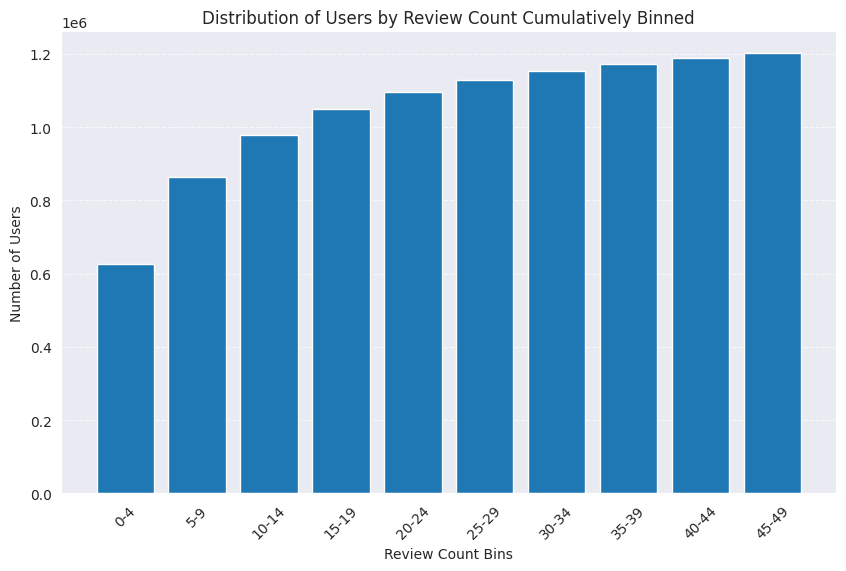

In [ ]:
# Operate on user df
thin_df = user_df[['user_id', 'review_count']]

# Define bins for review_count
bins = np.arange(0, 55, 5)  # Bins from 0 to 50 in steps of 5
labels = [f"{bins[i]}-{bins[i+1]-1}" for i in range(len(bins)-1)]

# Bin the data
thin_df['review_bin'] = pd.cut(thin_df['review_count'], bins=bins, labels=labels, right=False)

# Count the number of users per bin
bin_counts = thin_df['review_bin'].value_counts().sort_index()
bin_counts = bin_counts.cumsum()

print(bin_counts)

# Plot
plt.figure(figsize=(10, 6))
plt.bar(bin_counts.index, bin_counts.values)
plt.xlabel("Review Count Bins")
plt.ylabel("Number of Users")
plt.title("Distribution of Users by Review Count Cumulatively Binned")
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

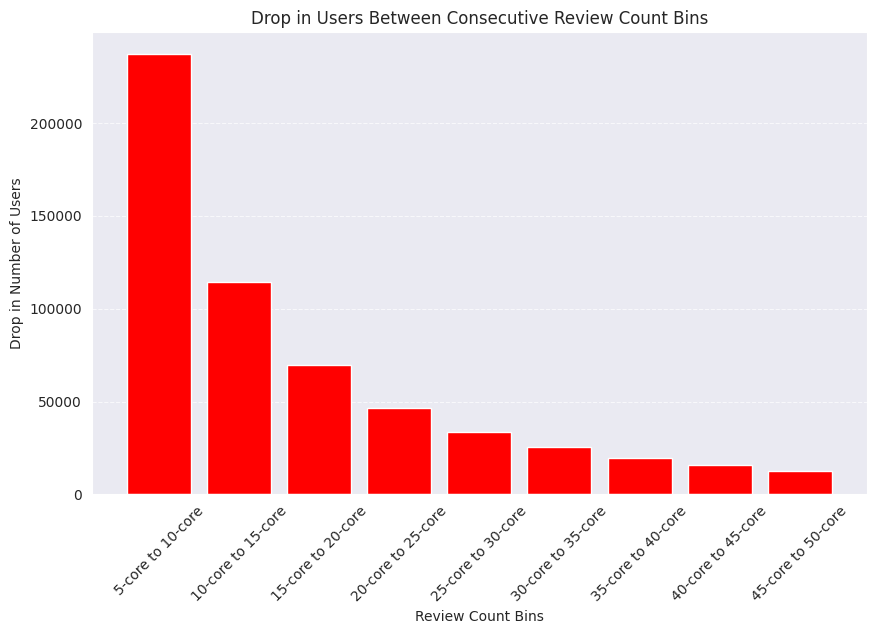

In [ ]:
# Calculate the drop in user count between consecutive bins
bin_drops = bin_counts.diff().dropna()

bin_diff_labels = ["5-core to 10-core", "10-core to 15-core", "15-core to 20-core", "20-core to 25-core", "25-core to 30-core", "30-core to 35-core", "35-core to 40-core", "40-core to 45-core", "45-core to 50-core"]

# Plot
plt.figure(figsize=(10, 6))
plt.bar(bin_diff_labels, bin_drops.values, color='red')
plt.xlabel("Review Count Bins")
plt.ylabel("Drop in Number of Users")
plt.title("Drop in Users Between Consecutive Review Count Bins")
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

Since between 5-core to 10-core lays the largest jump, we will restrict the users to those who have 5 or more reviews

In [ ]:
user_df = user_df[user_df['review_count'] >= 5]

## 5-Core Filtering for Business

Identify from which bins of businesses we see the largest jump - we will remove the bins up till before that identified jump.

In [ ]:
thin_df = business_df[['business_id', 'review_count']]

/tmp/ipykernel_150010/1706918197.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



review_bin
0-4       8139
5-9      18361
10-14    24264
15-19    28372
20-24    31418
25-29    33890
30-34    35841
35-39    37415
40-44    38790
45-49    40030
Name: count, dtype: int64


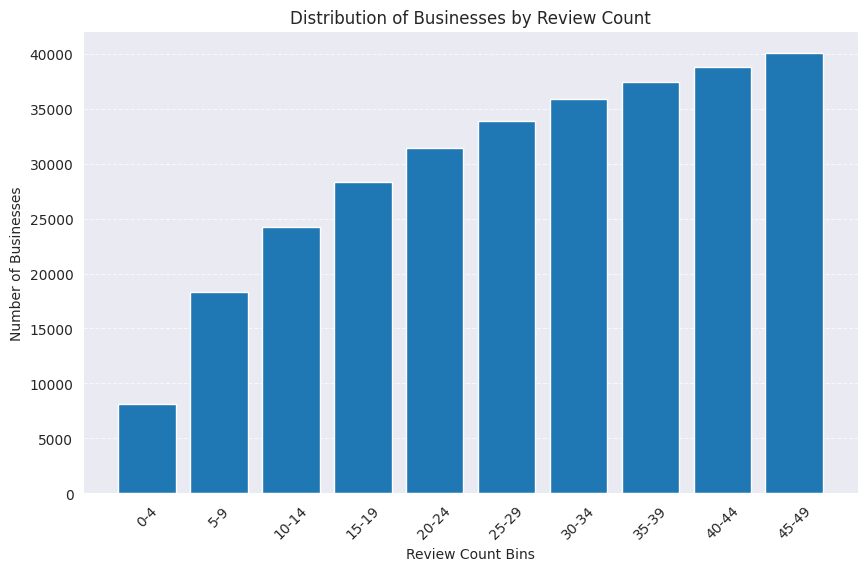

In [ ]:
# Define bins for review_count
bins = np.arange(0, 55, 5)  # Bins from 0 to 50 in steps of 5
labels = [f"{bins[i]}-{bins[i+1]-1}" for i in range(len(bins)-1)]

# Bin the data
thin_df['review_bin'] = pd.cut(thin_df['review_count'], bins=bins, labels=labels, right=False)

# Count the number of users per bin
bin_counts = thin_df['review_bin'].value_counts().sort_index()
bin_counts = bin_counts.cumsum()

print(bin_counts)

# Plot
plt.figure(figsize=(10, 6))
plt.bar(bin_counts.index, bin_counts.values)
plt.xlabel("Review Count Bins")
plt.ylabel("Number of Businesses")
plt.title("Distribution of Businesses by Review Count")
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

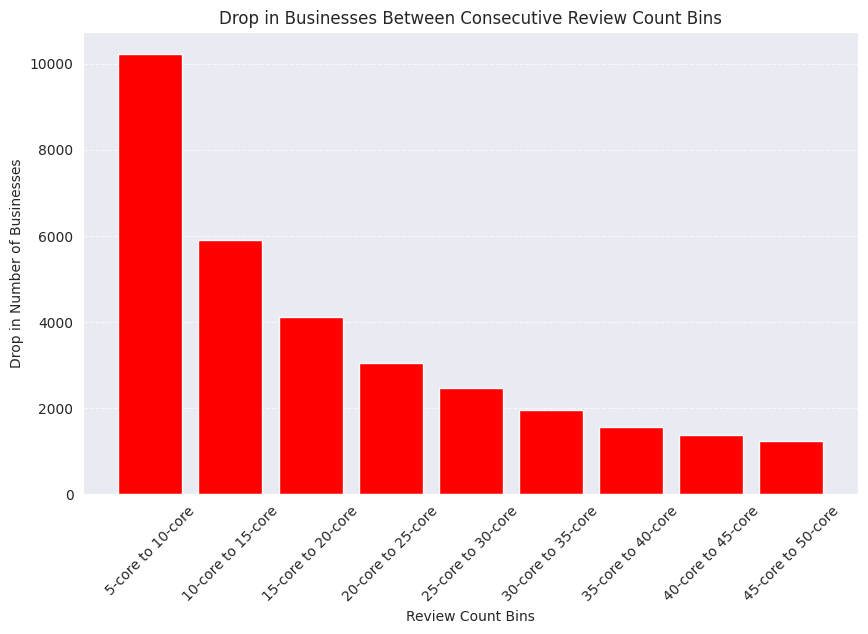

In [ ]:
# Calculate the drop in user count between consecutive bins
bin_drops = bin_counts.diff().dropna()

bin_diff_labels = ["5-core to 10-core", "10-core to 15-core", "15-core to 20-core", "20-core to 25-core", "25-core to 30-core", "30-core to 35-core", "35-core to 40-core", "40-core to 45-core", "45-core to 50-core"]

# Plot
plt.figure(figsize=(10, 6))
plt.bar(bin_diff_labels, bin_drops.values, color='red')
plt.xlabel("Review Count Bins")
plt.ylabel("Drop in Number of Businesses")
plt.title("Drop in Businesses Between Consecutive Review Count Bins")
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

Since between 5-core to 10-core lays the largest jump, we will restrict the businesses to those who have recieved 5 or more reviews

In [ ]:
business_df = business_df[business_df['review_count'] >= 5]

In [ ]:
lst_df = ['business_df', 'business_attributes_df', 'business_hours_df', 'check_in_df', 'reviews_df', 'tip_df', 'user_df']

## Business Feature Engineering

### Business DataFrame EDA

In [ ]:
business_df

,business_id,name,neighborhood,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,categories
4,PfOCPjBrlQAnz__NXj9h_w,"""Brick House Tavern + Tap""",NaN,"""581 Howe Ave""",Cuyahoga Falls,OH,44221,41.119535,-81.475690,3.5,116,1,American (New);Nightlife;Bars;Sandwiches;Ameri...
5,o9eMRCWt5PkpLDE0gOPtcQ,"""Messina""",NaN,"""Richterstr. 11""",Stuttgart,BW,70567,48.727200,9.147950,4.0,5,1,Italian;Restaurants
14,fNMVV_ZX7CJSDWQGdOM8Nw,"""Showmars Government Center""",Uptown,"""600 E 4th St""",Charlotte,NC,28202,35.221647,-80.839345,3.5,7,1,Restaurants;American (Traditional)
15,l09JfMeQ6ynYs5MCJtrcmQ,"""Alize Catering""",Yonge and Eglinton,"""2459 Yonge St""",Toronto,ON,M4P 2H6,43.711399,-79.399339,3.0,12,0,Italian;French;Restaurants
19,Gu-xs3NIQTj3Mj2xYoN2aw,"""Maxim Bakery & Restaurant""",NaN,"""9665 Bayview Avenue, Unit 1-4""",Richmond Hill,ON,L4C 9V4,43.867565,-79.412662,3.5,34,1,French;Food;Bakeries;Restaurants
...,...,...,...,...,...,...,...,...,...,...,...,...,...
174535,fukaxeFh8W9ijOp8sCrDyA,"""Heritage Fish & Chips""",NaN,"""1 Fisherman Drive""",Brampton,ON,L7A 2X9,43.714303,-79.799411,4.0,14,1,Seafood;Restaurants
174543,SvW3WsatQWvR8c1iwAD_QA,"""Urban House Cafe""",Church-Wellesley Village,"""4 Dundonald Street""",Toronto,ON,M4Y 1K2,43.666034,-79.384341,4.0,32,0,Nightlife;Restaurants;Sandwiches;Bars;Canadian...
174548,FxtrmM1a_0jcNnxiEF_Emg,"""Badgarten""",NaN,"""Mühlstr. 36""",Ludwigsburg,BW,71640,48.898590,9.201470,3.0,21,1,Restaurants;Beer Garden
174555,yJH_gq99aEj8xtyBaAQH8Q,"""Otto Onkel""",NaN,"""Böblinger Str. 14""",Stuttgart,BW,70178,48.764212,9.166086,3.0,52,1,German;Restaurants


#### Restrict business_attributes_df to the cored business_df

We constrain the businesses in business_attributes_df to those in the cored business_df to ensure that these businesses have >= 5 reviews

In [ ]:
business_attributes_df = business_attributes_df.merge(business_df[['business_id']], how='inner', on='business_id')

Fill all 'Na' or NaNs with the value -1 to mark them as missing

In [ ]:
business_df = business_df.fillna(-1)
business_df = business_df.replace('Na', -1)
business_df

,business_id,name,neighborhood,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,categories
4,PfOCPjBrlQAnz__NXj9h_w,"""Brick House Tavern + Tap""",-1,"""581 Howe Ave""",Cuyahoga Falls,OH,44221,41.119535,-81.475690,3.5,116,1,American (New);Nightlife;Bars;Sandwiches;Ameri...
5,o9eMRCWt5PkpLDE0gOPtcQ,"""Messina""",-1,"""Richterstr. 11""",Stuttgart,BW,70567,48.727200,9.147950,4.0,5,1,Italian;Restaurants
14,fNMVV_ZX7CJSDWQGdOM8Nw,"""Showmars Government Center""",Uptown,"""600 E 4th St""",Charlotte,NC,28202,35.221647,-80.839345,3.5,7,1,Restaurants;American (Traditional)
15,l09JfMeQ6ynYs5MCJtrcmQ,"""Alize Catering""",Yonge and Eglinton,"""2459 Yonge St""",Toronto,ON,M4P 2H6,43.711399,-79.399339,3.0,12,0,Italian;French;Restaurants
19,Gu-xs3NIQTj3Mj2xYoN2aw,"""Maxim Bakery & Restaurant""",-1,"""9665 Bayview Avenue, Unit 1-4""",Richmond Hill,ON,L4C 9V4,43.867565,-79.412662,3.5,34,1,French;Food;Bakeries;Restaurants
...,...,...,...,...,...,...,...,...,...,...,...,...,...
174535,fukaxeFh8W9ijOp8sCrDyA,"""Heritage Fish & Chips""",-1,"""1 Fisherman Drive""",Brampton,ON,L7A 2X9,43.714303,-79.799411,4.0,14,1,Seafood;Restaurants
174543,SvW3WsatQWvR8c1iwAD_QA,"""Urban House Cafe""",Church-Wellesley Village,"""4 Dundonald Street""",Toronto,ON,M4Y 1K2,43.666034,-79.384341,4.0,32,0,Nightlife;Restaurants;Sandwiches;Bars;Canadian...
174548,FxtrmM1a_0jcNnxiEF_Emg,"""Badgarten""",-1,"""Mühlstr. 36""",Ludwigsburg,BW,71640,48.898590,9.201470,3.0,21,1,Restaurants;Beer Garden
174555,yJH_gq99aEj8xtyBaAQH8Q,"""Otto Onkel""",-1,"""Böblinger Str. 14""",Stuttgart,BW,70178,48.764212,9.166086,3.0,52,1,German;Restaurants


In [ ]:
business_attributes_df

,business_id,AcceptsInsurance,ByAppointmentOnly,BusinessAcceptsCreditCards,BusinessParking_garage,BusinessParking_street,BusinessParking_validated,BusinessParking_lot,BusinessParking_valet,HairSpecializesIn_coloring,HairSpecializesIn_africanamerican,HairSpecializesIn_curly,HairSpecializesIn_perms,HairSpecializesIn_kids,HairSpecializesIn_extensions,HairSpecializesIn_asian,HairSpecializesIn_straightperms,RestaurantsPriceRange2,GoodForKids,WheelchairAccessible,BikeParking,Alcohol,HasTV,NoiseLevel,RestaurantsAttire,Music_dj,Music_background_music,Music_no_music,Music_karaoke,Music_live,Music_video,Music_jukebox,Ambience_romantic,Ambience_intimate,Ambience_classy,Ambience_hipster,Ambience_divey,Ambience_touristy,Ambience_trendy,Ambience_upscale,Ambience_casual,RestaurantsGoodForGroups,Caters,WiFi,RestaurantsReservations,RestaurantsTakeOut,HappyHour,GoodForDancing,RestaurantsTableService,OutdoorSeating,RestaurantsDelivery,BestNights_monday,BestNights_tuesday,BestNights_friday,BestNights_wednesday,BestNights_thursday,BestNights_sunday,BestNights_saturday,GoodForMeal_dessert,GoodForMeal_latenight,GoodForMeal_lunch,GoodForMeal_dinner,GoodForMeal_breakfast,GoodForMeal_brunch,CoatCheck,Smoking,DriveThru,DogsAllowed,BusinessAcceptsBitcoin,Open24Hours,BYOBCorkage,BYOB,Corkage,DietaryRestrictions_dairy-free,DietaryRestrictions_gluten-free,DietaryRestrictions_vegan,DietaryRestrictions_kosher,DietaryRestrictions_halal,DietaryRestrictions_soy-free,DietaryRestrictions_vegetarian,AgesAllowed,RestaurantsCounterService
0,PfOCPjBrlQAnz__NXj9h_w,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,False,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na
1,o9eMRCWt5PkpLDE0gOPtcQ,Na,Na,Na,Na,False,False,False,False,False,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,False,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na
2,fNMVV_ZX7CJSDWQGdOM8Nw,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,True,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na
3,l09JfMeQ6ynYs5MCJtrcmQ,Na,Na,Na,Na,False,True,False,False,False,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,False,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na
4,Gu-xs3NIQTj3Mj2xYoN2aw,Na,Na,Na,Na,False,False,False,True,False,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,True,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
46175,fukaxeFh8W9ijOp8sCrDyA,Na,Na,Na,Na,False,False,False,False,False,Na,Na,Na,Na,Na,Na,Na,Na,Na,True,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na
46176,SvW3WsatQWvR8c1iwAD_QA,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,True,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na
46177,FxtrmM1a_0jcNnxiEF_Emg,Na,Na,Na,Na,False,False,False,False,False,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,True,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,Na,N

In [ ]:
def get_most_freq_col_vals(_df, ignore_cols, cols_of_int=[]):
    if cols_of_int:
        for col in cols_of_int:
            value_counts = _df[col].value_counts()
            print(f'===== {col} =====')
            print(value_counts)
    else:
        for col in set(_df.columns).difference(set(ignore_cols)):
            value_counts = _df[col].value_counts()
            print(f'===== {col} =====')
            print(value_counts)

In [ ]:
biz_attrib_cols_to_ignore = ['business_id']
get_most_freq_col_vals(business_attributes_df, biz_attrib_cols_to_ignore)

===== DietaryRestrictions_gluten-free =====
DietaryRestrictions_gluten-free
Na       46075
False       95
True        10
Name: count, dtype: int64
===== Music_live =====
Music_live
Na    46180
Name: count, dtype: int64
===== Ambience_romantic =====
Ambience_romantic
Na    46180
Name: count, dtype: int64
===== RestaurantsDelivery =====
RestaurantsDelivery
Na       46055
False       83
True        42
Name: count, dtype: int64
===== HappyHour =====
HappyHour
Na       45176
True       826
False      178
Name: count, dtype: int64
===== BestNights_saturday =====
BestNights_saturday
Na       46151
False       26
True         3
Name: count, dtype: int64
===== BusinessParking_validated =====
BusinessParking_validated
False    24290
Na       15203
True      6687
Name: count, dtype: int64
===== Music_video =====
Music_video
Na    46180
Name: count, dtype: int64
===== HairSpecializesIn_africanamerican =====
HairSpecializesIn_africanamerican
Na    46180
Name: count, dtype: int64
===== HasTV =====
H

#### Check for data skewness

In [ ]:
business_attributes_df = business_attributes_df.fillna(-1)
business_attributes_df = business_attributes_df.replace('Na', -1)
business_attributes_df

/tmp/ipykernel_150010/3187994245.py:2: FutureWarning:

Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`



,business_id,AcceptsInsurance,ByAppointmentOnly,BusinessAcceptsCreditCards,BusinessParking_garage,BusinessParking_street,BusinessParking_validated,BusinessParking_lot,BusinessParking_valet,HairSpecializesIn_coloring,HairSpecializesIn_africanamerican,HairSpecializesIn_curly,HairSpecializesIn_perms,HairSpecializesIn_kids,HairSpecializesIn_extensions,HairSpecializesIn_asian,HairSpecializesIn_straightperms,RestaurantsPriceRange2,GoodForKids,WheelchairAccessible,BikeParking,Alcohol,HasTV,NoiseLevel,RestaurantsAttire,Music_dj,Music_background_music,Music_no_music,Music_karaoke,Music_live,Music_video,Music_jukebox,Ambience_romantic,Ambience_intimate,Ambience_classy,Ambience_hipster,Ambience_divey,Ambience_touristy,Ambience_trendy,Ambience_upscale,Ambience_casual,RestaurantsGoodForGroups,Caters,WiFi,RestaurantsReservations,RestaurantsTakeOut,HappyHour,GoodForDancing,RestaurantsTableService,OutdoorSeating,RestaurantsDelivery,BestNights_monday,BestNights_tuesday,BestNights_friday,BestNights_wednesday,BestNights_thursday,BestNights_sunday,BestNights_saturday,GoodForMeal_dessert,GoodForMeal_latenight,GoodForMeal_lunch,GoodForMeal_dinner,GoodForMeal_breakfast,GoodForMeal_brunch,CoatCheck,Smoking,DriveThru,DogsAllowed,BusinessAcceptsBitcoin,Open24Hours,BYOBCorkage,BYOB,Corkage,DietaryRestrictions_dairy-free,DietaryRestrictions_gluten-free,DietaryRestrictions_vegan,DietaryRestrictions_kosher,DietaryRestrictions_halal,DietaryRestrictions_soy-free,DietaryRestrictions_vegetarian,AgesAllowed,RestaurantsCounterService
0,PfOCPjBrlQAnz__NXj9h_w,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,False,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1
1,o9eMRCWt5PkpLDE0gOPtcQ,-1,-1,-1,-1,False,False,False,False,False,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,False,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1
2,fNMVV_ZX7CJSDWQGdOM8Nw,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,True,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1
3,l09JfMeQ6ynYs5MCJtrcmQ,-1,-1,-1,-1,False,True,False,False,False,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,False,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1
4,Gu-xs3NIQTj3Mj2xYoN2aw,-1,-1,-1,-1,False,False,False,True,False,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,True,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
46175,fukaxeFh8W9ijOp8sCrDyA,-1,-1,-1,-1,False,False,False,False,False,-1,-1,-1,-1,-1,-1,-1,-1,-1,True,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1
46176,SvW3WsatQWvR8c1iwAD_QA,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,True,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1
46177,FxtrmM1a_0jcNnxiEF_Emg,-1,-1,-1,-1,False,False,False,False,False,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,True,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-

We look for data skewness in each of the column using "dominance ratio" as a measure. Dominance ratio is calculated to be the frequency of the most common sample divded by the second most common sample.

In [ ]:
def get_dominance_ratio(_df, ignore_cols):
    lst_dom_ratios = []
    lst_cols = []
    lst_to_remove = []
    for col in set(_df.columns).difference(set(ignore_cols)):
        # Values are sorted in descending order by frequency
        value_counts = _df[col].value_counts()

        # We only care about skewness if the skewed value (most frequent value) is -1 or 0, meaning if its missing or False
        if value_counts.index[0] == -1 or value_counts.index[0] == 0:
            if len(value_counts) >= 2:
                dominance_ratio = value_counts.iloc[0] / value_counts.iloc[1]
            else: # theres only 1 unique value
                # In the case where there is only one unique value, we mark the column for removal
                dominance_ratio = 0
            print(f'===== {col} =====')
            if dominance_ratio != 0:
                lst_cols.append(col)
                lst_dom_ratios.append(dominance_ratio)
                print(f"Dominance ratio: {dominance_ratio}")
            else:
                lst_to_remove.append(col)
                unique_value = value_counts.index[0]
                print(f"{unique_value} is the only value")
    ___df = pd.DataFrame(
        {'col': lst_cols, 'dominance_ratio': lst_dom_ratios},
    )
    return ___df, lst_to_remove

In [ ]:
biz_attrib_dom_df, biz_lst_to_remove = get_dominance_ratio(business_attributes_df, biz_attrib_cols_to_ignore)

===== DietaryRestrictions_gluten-free =====
Dominance ratio: 485.0
===== Music_live =====
-1 is the only value
===== Ambience_romantic =====
-1 is the only value
===== RestaurantsDelivery =====
Dominance ratio: 554.8795180722891
===== HappyHour =====
Dominance ratio: 54.69249394673123
===== BestNights_saturday =====
Dominance ratio: 1775.0384615384614
===== Music_video =====
-1 is the only value
===== HairSpecializesIn_africanamerican =====
-1 is the only value
===== HasTV =====
Dominance ratio: 88.11821705426357
===== BestNights_monday =====
Dominance ratio: 31.30240793201133
===== AcceptsInsurance =====
-1 is the only value
===== BYOB =====
Dominance ratio: 1246.5405405405406
===== AgesAllowed =====
Dominance ratio: 780.9322033898305
===== BusinessParking_garage =====
Dominance ratio: 1125.3170731707316
===== Music_dj =====
Dominance ratio: 1488.6774193548388
===== Smoking =====
Dominance ratio: 192.92857142857142
===== HairSpecializesIn_asian =====
-1 is the only value
===== HairSpe

We have marked businesses with only 1 unique value to be removed, as that column will no longer be of use

In [ ]:
biz_lst_to_remove

['Music_live',
 'Ambience_romantic',
 'Music_video',
 'HairSpecializesIn_africanamerican',
 'AcceptsInsurance',
 'HairSpecializesIn_asian',
 'HairSpecializesIn_extensions',
 'Music_no_music',
 'Music_karaoke',
 'HairSpecializesIn_straightperms',
 'Corkage',
 'RestaurantsPriceRange2',
 'HairSpecializesIn_perms',
 'Music_jukebox',
 'RestaurantsCounterService',
 'HairSpecializesIn_curly',
 'Music_background_music',
 'HairSpecializesIn_kids',
 'DietaryRestrictions_dairy-free',
 'ByAppointmentOnly',
 'BYOBCorkage']

In [ ]:
biz_attrib_dom_df

,col,dominance_ratio
0,DietaryRestrictions_gluten-free,485.000000
1,RestaurantsDelivery,554.879518
2,HappyHour,54.692494
3,BestNights_saturday,1775.038462
4,HasTV,88.118217
5,BestNights_monday,31.302408
6,BYOB,1246.540541
7,AgesAllowed,780.932203
8,BusinessParking_garage,1125.317073
9,Music_dj,1488.677419


In [ ]:
biz_attrib_dom_df.describe()

,dominance_ratio
count,55.000000
mean,1136.770544
std,1359.413989
min,2.225024
25%,80.859757
50%,755.327869
75%,1488.677419
max,7695.666667


In [ ]:
biz_attrib_cols_interest_df = biz_attrib_dom_df[biz_attrib_dom_df['dominance_ratio'] < 10]
biz_attrib_cols_interest_df

,col,dominance_ratio
37,BikeParking,2.225024
53,WheelchairAccessible,2.358368


In [ ]:
lst_df

['business_df',
 'business_attributes_df',
 'business_hours_df',
 'check_in_df',
 'reviews_df',
 'tip_df',
 'user_df']

In [ ]:
get_most_freq_col_vals(business_attributes_df, [], biz_attrib_cols_interest_df['col'].to_list())

===== BikeParking =====
BikeParking
-1       30178
True     13563
False     2439
Name: count, dtype: int64
===== WheelchairAccessible =====
WheelchairAccessible
-1       31213
True     13235
False     1732
Name: count, dtype: int64


As these are the least skewed columns, we will thus be restricting business attributes to the above.

In [ ]:
business_attributes_df = business_attributes_df[['business_id'] + biz_attrib_cols_interest_df['col'].to_list()]
business_attributes_df

,business_id,BikeParking,WheelchairAccessible
0,PfOCPjBrlQAnz__NXj9h_w,-1,-1
1,o9eMRCWt5PkpLDE0gOPtcQ,False,-1
2,fNMVV_ZX7CJSDWQGdOM8Nw,-1,True
3,l09JfMeQ6ynYs5MCJtrcmQ,False,-1
4,Gu-xs3NIQTj3Mj2xYoN2aw,True,-1
...,...,...,...
46175,fukaxeFh8W9ijOp8sCrDyA,-1,True
46176,SvW3WsatQWvR8c1iwAD_QA,True,-1
46177,FxtrmM1a_0jcNnxiEF_Emg,True,-1
46178,yJH_gq99aEj8xtyBaAQH8Q,-1,-1


We will set all the not listed 'Na' values to False as it is the more likely value.

In [ ]:
business_attributes_df = business_attributes_df.replace(to_replace=-1, value=False)
business_attributes_df

,business_id,BikeParking,WheelchairAccessible
0,PfOCPjBrlQAnz__NXj9h_w,False,False
1,o9eMRCWt5PkpLDE0gOPtcQ,False,False
2,fNMVV_ZX7CJSDWQGdOM8Nw,False,True
3,l09JfMeQ6ynYs5MCJtrcmQ,False,False
4,Gu-xs3NIQTj3Mj2xYoN2aw,True,False
...,...,...,...
46175,fukaxeFh8W9ijOp8sCrDyA,False,True
46176,SvW3WsatQWvR8c1iwAD_QA,True,False
46177,FxtrmM1a_0jcNnxiEF_Emg,True,False
46178,yJH_gq99aEj8xtyBaAQH8Q,False,False


In [ ]:
lst_df

['business_df',
 'business_attributes_df',
 'business_hours_df',
 'check_in_df',
 'reviews_df',
 'tip_df',
 'user_df']

In [ ]:
business_hours_df

,business_id,monday,tuesday,wednesday,thursday,friday,saturday,sunday
0,FYWN1wneV18bWNgQjJ2GNg,7:30-17:0,7:30-17:0,7:30-17:0,7:30-17:0,7:30-17:0,NaN,NaN
1,He-G7vWjzVUysIKrfNbPUQ,9:0-20:0,9:0-20:0,9:0-20:0,9:0-20:0,9:0-16:0,8:0-16:0,NaN
2,KQPW8lFf1y5BT2MxiSZ3QA,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,8DShNS-LuFqpEWIp0HxijA,10:0-21:0,10:0-21:0,10:0-21:0,10:0-21:0,10:0-21:0,10:0-21:0,11:0-19:0
4,PfOCPjBrlQAnz__NXj9h_w,11:0-1:0,11:0-1:0,11:0-1:0,11:0-1:0,11:0-1:0,11:0-2:0,11:0-0:0
...,...,...,...,...,...,...,...,...
174562,ALV5R8NkZ1KGOZeuZl3u0A,7:0-18:0,7:0-18:0,7:0-18:0,7:0-18:0,7:0-18:0,8:0-16:0,NaN
174563,gRGalHVu6BcaUDIAGVW_xQ,8:0-17:0,8:0-17:0,8:0-17:0,8:0-17:0,8:0-17:0,9:0-12:0,NaN
174564,XXvZBIHoJBU5d6-a-oyMWQ,8:30-17:0,8:30-17:0,8:30-17:0,8:30-17:0,8:30-17:0,NaN,NaN
174565,lNpPGgM96nPIYM1shxciHg,10:0-20:0,10:0-20:0,10:0-20:0,10:0-20:0,10:0-18:0,11:0-14:0,12:0-14:0


#### Add Business operating hours feature

In [ ]:
business_hours_df

,business_id,monday,tuesday,wednesday,thursday,friday,saturday,sunday
0,FYWN1wneV18bWNgQjJ2GNg,7:30-17:0,7:30-17:0,7:30-17:0,7:30-17:0,7:30-17:0,NaN,NaN
1,He-G7vWjzVUysIKrfNbPUQ,9:0-20:0,9:0-20:0,9:0-20:0,9:0-20:0,9:0-16:0,8:0-16:0,NaN
2,KQPW8lFf1y5BT2MxiSZ3QA,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,8DShNS-LuFqpEWIp0HxijA,10:0-21:0,10:0-21:0,10:0-21:0,10:0-21:0,10:0-21:0,10:0-21:0,11:0-19:0
4,PfOCPjBrlQAnz__NXj9h_w,11:0-1:0,11:0-1:0,11:0-1:0,11:0-1:0,11:0-1:0,11:0-2:0,11:0-0:0
...,...,...,...,...,...,...,...,...
174562,ALV5R8NkZ1KGOZeuZl3u0A,7:0-18:0,7:0-18:0,7:0-18:0,7:0-18:0,7:0-18:0,8:0-16:0,NaN
174563,gRGalHVu6BcaUDIAGVW_xQ,8:0-17:0,8:0-17:0,8:0-17:0,8:0-17:0,8:0-17:0,9:0-12:0,NaN
174564,XXvZBIHoJBU5d6-a-oyMWQ,8:30-17:0,8:30-17:0,8:30-17:0,8:30-17:0,8:30-17:0,NaN,NaN
174565,lNpPGgM96nPIYM1shxciHg,10:0-20:0,10:0-20:0,10:0-20:0,10:0-20:0,10:0-18:0,11:0-14:0,12:0-14:0


In [ ]:
from datetime import time, date, datetime

def convert_time(row):
    cum_hrs = 0 
    for col in ['monday', 'tuesday', 'wednesday', 'thursday', 'friday', 'saturday', 'sunday']:
        #print('row:', row)
        cell = row[col]
        #print("cell:", cell)
        if pd.isna(cell):
            open_lst = []
            break
        else:
            open_lst = cell.split('-')
    
        converted_time_lst = []
        for timing in open_lst:
            timing_lst = timing.split(':')
            hr = int(timing_lst[0])
            _min = int(timing_lst[1])
        
            converted_time_lst.append(time(hr, _min))
        base_date = date(2000, 1, 1)
        dt1 = datetime.combine(base_date, converted_time_lst[0])
        dt2 = datetime.combine(base_date, converted_time_lst[1])
        
        diff = dt2 - dt1
        cum_hrs += abs(diff.total_seconds()) / 3600 # get num hrs
    return cum_hrs
    

In [ ]:
business_hours_df['total_hours'] = business_hours_df.apply(convert_time, axis=1)
business_hours_df = business_hours_df[['business_id', 'total_hours']]
business_hours_df

,business_id,total_hours
0,FYWN1wneV18bWNgQjJ2GNg,47.5
1,He-G7vWjzVUysIKrfNbPUQ,59.0
2,KQPW8lFf1y5BT2MxiSZ3QA,0.0
3,8DShNS-LuFqpEWIp0HxijA,74.0
4,PfOCPjBrlQAnz__NXj9h_w,70.0
...,...,...
174562,ALV5R8NkZ1KGOZeuZl3u0A,63.0
174563,gRGalHVu6BcaUDIAGVW_xQ,48.0
174564,XXvZBIHoJBU5d6-a-oyMWQ,42.5
174565,lNpPGgM96nPIYM1shxciHg,53.0


In [ ]:
business_hours_df.describe()

,total_hours
count,174567.000000
mean,40.631922
std,34.524169
min,0.000000
25%,0.000000
50%,47.500000
75%,69.000000
max,167.883333


#### Get total number of checkins for businesses

In [ ]:
lst_df

['business_df',
 'business_attributes_df',
 'business_hours_df',
 'check_in_df',
 'reviews_df',
 'tip_df',
 'user_df']

In [ ]:
check_in_df

,business_id,weekday,hour,checkins
0,3Mc-LxcqeguOXOVT_2ZtCg,Tue,0:00,12
1,SVFx6_epO22bZTZnKwlX7g,Wed,0:00,4
2,vW9aLivd4-IorAfStzsHww,Tue,14:00,1
3,tEzxhauTQddACyqdJ0OPEQ,Fri,19:00,1
4,CEyZU32P-vtMhgqRCaXzMA,Tue,17:00,1
...,...,...,...,...
3911213,CZKHXlDuy3IagC2W881fyA,Fri,5:00,7
3911214,mUWE-uNGyCiifmboWbyMqQ,Mon,17:00,1
3911215,nFR7dDedxRuBeZz_6Cdalg,Mon,23:00,1
3911216,y3YRUsh8FVih0AhYLx-DWA,Thu,21:00,1


In [ ]:
check_in_df['weekday'].unique()

array(['Tue', 'Wed', 'Fri', 'Sun', 'Sat', 'Mon', 'Thu'], dtype=object)

#### Get Business Popular days

First, we get number of checkins for each day of the week

In [ ]:
check_in_df_total = check_in_df.groupby('business_id')['checkins'].sum().reset_index()
check_in_df_total

,business_id,checkins
0,--6MefnULPED_I942VcFNA,139
1,--7zmmkVg-IMGaXbuVd0SQ,153
2,--8LPVSo5i0Oo61X01sV9A,1
3,--9QQLMTbFzLJ_oT-ON3Xw,33
4,--9e1ONYQuAa-CB_Rrw7Tw,2568
...,...,...
146345,zzvlwkcNR1CCqOPXwuvz2A,2
146346,zzwaS0xn1MVEPEf0hNLjew,716
146347,zzwhN7x37nyjP0ZM8oiHmw,33
146348,zzwicjPC9g246MK2M1ZFBA,127


In [ ]:
# Group by business_id and weekday, summing all checkins.
check_in_agg = check_in_df.groupby(['business_id', 'weekday'], as_index=False)['checkins'].sum()

# Pivot so that each weekday becomes its own column.
check_in_df = check_in_agg.pivot(
    index='business_id',
    columns='weekday',
    values='checkins'
).fillna(0)  # Fill any missing values with 0

# Flatten the column index and rename the columns.
check_in_df.reset_index(inplace=True)

check_in_df

weekday,business_id,Fri,Mon,Sat,Sun,Thu,Tue,Wed
0,--6MefnULPED_I942VcFNA,21.0,19.0,40.0,37.0,7.0,7.0,8.0
1,--7zmmkVg-IMGaXbuVd0SQ,21.0,6.0,64.0,33.0,16.0,7.0,6.0
2,--8LPVSo5i0Oo61X01sV9A,1.0,0.0,0.0,0.0,0.0,0.0,0.0
3,--9QQLMTbFzLJ_oT-ON3Xw,6.0,1.0,10.0,6.0,1.0,5.0,4.0
4,--9e1ONYQuAa-CB_Rrw7Tw,294.0,281.0,480.0,791.0,249.0,251.0,222.0
...,...,...,...,...,...,...,...,...
146345,zzvlwkcNR1CCqOPXwuvz2A,1.0,0.0,0.0,0.0,0.0,1.0,0.0
146346,zzwaS0xn1MVEPEf0hNLjew,71.0,34.0,283.0,220.0,56.0,19.0,33.0
146347,zzwhN7x37nyjP0ZM8oiHmw,8.0,1.0,9.0,4.0,3.0,2.0,6.0
146348,zzwicjPC9g246MK2M1ZFBA,17.0,18.0,25.0,30.0,15.0,10.0,12.0


Then, we combine check_in_df and check_in_df_total

In [ ]:
check_in_df = check_in_df.merge(check_in_df_total, how='inner', on='business_id')
check_in_df

,business_id,Fri,Mon,Sat,Sun,Thu,Tue,Wed,checkins
0,--6MefnULPED_I942VcFNA,21.0,19.0,40.0,37.0,7.0,7.0,8.0,139
1,--7zmmkVg-IMGaXbuVd0SQ,21.0,6.0,64.0,33.0,16.0,7.0,6.0,153
2,--8LPVSo5i0Oo61X01sV9A,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1
3,--9QQLMTbFzLJ_oT-ON3Xw,6.0,1.0,10.0,6.0,1.0,5.0,4.0,33
4,--9e1ONYQuAa-CB_Rrw7Tw,294.0,281.0,480.0,791.0,249.0,251.0,222.0,2568
...,...,...,...,...,...,...,...,...,...
146345,zzvlwkcNR1CCqOPXwuvz2A,1.0,0.0,0.0,0.0,0.0,1.0,0.0,2
146346,zzwaS0xn1MVEPEf0hNLjew,71.0,34.0,283.0,220.0,56.0,19.0,33.0,716
146347,zzwhN7x37nyjP0ZM8oiHmw,8.0,1.0,9.0,4.0,3.0,2.0,6.0,33
146348,zzwicjPC9g246MK2M1ZFBA,17.0,18.0,25.0,30.0,15.0,10.0,12.0,127


Then, we scale each day's num of checkins by the business total checkins

In [ ]:
cols_to_scale = ['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun']

for col in cols_to_scale:
    check_in_df[col] /= check_in_df['checkins']
check_in_df

,business_id,Fri,Mon,Sat,Sun,Thu,Tue,Wed,checkins
0,--6MefnULPED_I942VcFNA,0.151079,0.136691,0.287770,0.266187,0.050360,0.050360,0.057554,139
1,--7zmmkVg-IMGaXbuVd0SQ,0.137255,0.039216,0.418301,0.215686,0.104575,0.045752,0.039216,153
2,--8LPVSo5i0Oo61X01sV9A,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1
3,--9QQLMTbFzLJ_oT-ON3Xw,0.181818,0.030303,0.303030,0.181818,0.030303,0.151515,0.121212,33
4,--9e1ONYQuAa-CB_Rrw7Tw,0.114486,0.109424,0.186916,0.308022,0.096963,0.097741,0.086449,2568
...,...,...,...,...,...,...,...,...,...
146345,zzvlwkcNR1CCqOPXwuvz2A,0.500000,0.000000,0.000000,0.000000,0.000000,0.500000,0.000000,2
146346,zzwaS0xn1MVEPEf0hNLjew,0.099162,0.047486,0.395251,0.307263,0.078212,0.026536,0.046089,716
146347,zzwhN7x37nyjP0ZM8oiHmw,0.242424,0.030303,0.272727,0.121212,0.090909,0.060606,0.181818,33
146348,zzwicjPC9g246MK2M1ZFBA,0.133858,0.141732,0.196850,0.236220,0.118110,0.078740,0.094488,127


Next, we compute the business age using the first and last reviews for each business, to get an indication of the number of years users have been visiting that restaurant for.

In [ ]:
lst_df

['business_df',
 'business_attributes_df',
 'business_hours_df',
 'check_in_df',
 'reviews_df',
 'tip_df',
 'user_df']

In [ ]:
reviews_df

,review_id,user_id,business_id,stars,date,text,useful,funny,cool
0,vkVSCC7xljjrAI4UGfnKEQ,bv2nCi5Qv5vroFiqKGopiw,AEx2SYEUJmTxVVB18LlCwA,5,2016-05-28,Super simple place but amazing nonetheless. It...,0,0,0
1,n6QzIUObkYshz4dz2QRJTw,bv2nCi5Qv5vroFiqKGopiw,VR6GpWIda3SfvPC-lg9H3w,5,2016-05-28,Small unassuming place that changes their menu...,0,0,0
2,MV3CcKScW05u5LVfF6ok0g,bv2nCi5Qv5vroFiqKGopiw,CKC0-MOWMqoeWf6s-szl8g,5,2016-05-28,Lester's is located in a beautiful neighborhoo...,0,0,0
3,IXvOzsEMYtiJI0CARmj77Q,bv2nCi5Qv5vroFiqKGopiw,ACFtxLv8pGrrxMm6EgjreA,4,2016-05-28,Love coming here. Yes the place always needs t...,0,0,0
4,L_9BTb55X0GDtThi6GlZ6w,bv2nCi5Qv5vroFiqKGopiw,s2I_Ni76bjJNK9yG60iD-Q,4,2016-05-28,Had their chocolate almond croissant and it wa...,0,0,0
...,...,...,...,...,...,...,...,...,...
5261663,PoGSiNz1X5SUu0qEt-qM5w,mPjPyipaD0C_myqWqDipZg,Ngk84Ax1tXgpoJFEGxot3w,1,2011-11-21,"Bought groupon $39 for 4 months from groupon, ...",36,3,3
5261664,-CJNPrDWgIkorx4iEZJXIg,mPjPyipaD0C_myqWqDipZg,pOEL97ld-FJMKO8Ki8JmYg,3,2016-04-30,"Spring rolls was pretty good, cod was a bit ra...",0,0,0
5261665,W9eVvOcpBvG6lpJPoJOxuA,mPjPyipaD0C_myqWqDipZg,5ubokMNw8qfbX2WtxgJG1Q,4,2011-10-23,"Had a 8 dish set meal, was enough for 10 peopl...",3,0,1
5261666,hqQ1UTFKMN2P1ezUow48OQ,mPjPyipaD0C_myqWqDipZg,EO3i5kTUG7_S2OIQ23sdSA,3,2011-11-07,"A small, cozy family run Authentic korean rest...",2,0,0


We will first subset the reviews_df columns to use less memory

We will then constrain the reviews to those containing user_ids in the user_df and business_ids in business_df

In [ ]:
reviews_df = reviews_df.merge(business_df[['business_id']], how='inner', on='business_id')
reviews_df = reviews_df.merge(user_df[['user_id']], how='inner', on='user_id')
reviews_df

,review_id,user_id,business_id,stars,date,text,useful,funny,cool
0,vkVSCC7xljjrAI4UGfnKEQ,bv2nCi5Qv5vroFiqKGopiw,AEx2SYEUJmTxVVB18LlCwA,5,2016-05-28,Super simple place but amazing nonetheless. It...,0,0,0
1,n6QzIUObkYshz4dz2QRJTw,bv2nCi5Qv5vroFiqKGopiw,VR6GpWIda3SfvPC-lg9H3w,5,2016-05-28,Small unassuming place that changes their menu...,0,0,0
2,MV3CcKScW05u5LVfF6ok0g,bv2nCi5Qv5vroFiqKGopiw,CKC0-MOWMqoeWf6s-szl8g,5,2016-05-28,Lester's is located in a beautiful neighborhoo...,0,0,0
3,IXvOzsEMYtiJI0CARmj77Q,bv2nCi5Qv5vroFiqKGopiw,ACFtxLv8pGrrxMm6EgjreA,4,2016-05-28,Love coming here. Yes the place always needs t...,0,0,0
4,L_9BTb55X0GDtThi6GlZ6w,bv2nCi5Qv5vroFiqKGopiw,s2I_Ni76bjJNK9yG60iD-Q,4,2016-05-28,Had their chocolate almond croissant and it wa...,0,0,0
...,...,...,...,...,...,...,...,...,...
2746291,evfB2Xzw4u7aYftWClQfeg,mPjPyipaD0C_myqWqDipZg,--SrzpvFLwP_YFwB_Cetow,2,2011-10-18,"So after reading Precilla C. review, I decided...",0,0,0
2746292,-CJNPrDWgIkorx4iEZJXIg,mPjPyipaD0C_myqWqDipZg,pOEL97ld-FJMKO8Ki8JmYg,3,2016-04-30,"Spring rolls was pretty good, cod was a bit ra...",0,0,0
2746293,W9eVvOcpBvG6lpJPoJOxuA,mPjPyipaD0C_myqWqDipZg,5ubokMNw8qfbX2WtxgJG1Q,4,2011-10-23,"Had a 8 dish set meal, was enough for 10 peopl...",3,0,1
2746294,hqQ1UTFKMN2P1ezUow48OQ,mPjPyipaD0C_myqWqDipZg,EO3i5kTUG7_S2OIQ23sdSA,3,2011-11-07,"A small, cozy family run Authentic korean rest...",2,0,0


In [ ]:
min_review_df = reviews_df[['business_id', 'user_id', 'date', 'stars']]
min_review_df['review_id'] = min_review_df.index
min_review_df

/tmp/ipykernel_150010/3059046704.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,business_id,user_id,date,stars,review_id
0,AEx2SYEUJmTxVVB18LlCwA,bv2nCi5Qv5vroFiqKGopiw,2016-05-28,5,0
1,VR6GpWIda3SfvPC-lg9H3w,bv2nCi5Qv5vroFiqKGopiw,2016-05-28,5,1
2,CKC0-MOWMqoeWf6s-szl8g,bv2nCi5Qv5vroFiqKGopiw,2016-05-28,5,2
3,ACFtxLv8pGrrxMm6EgjreA,bv2nCi5Qv5vroFiqKGopiw,2016-05-28,4,3
4,s2I_Ni76bjJNK9yG60iD-Q,bv2nCi5Qv5vroFiqKGopiw,2016-05-28,4,4
...,...,...,...,...,...
2746291,--SrzpvFLwP_YFwB_Cetow,mPjPyipaD0C_myqWqDipZg,2011-10-18,2,2746291
2746292,pOEL97ld-FJMKO8Ki8JmYg,mPjPyipaD0C_myqWqDipZg,2016-04-30,3,2746292
2746293,5ubokMNw8qfbX2WtxgJG1Q,mPjPyipaD0C_myqWqDipZg,2011-10-23,4,2746293
2746294,EO3i5kTUG7_S2OIQ23sdSA,mPjPyipaD0C_myqWqDipZg,2011-11-07,3,2746294


In [ ]:
# Convert date column to datetime
min_review_df['date'] = pd.to_datetime(min_review_df['date'])

# Group by business_id, and compute the min and max date
min_review_df_agg = min_review_df.groupby('business_id')['date'].agg(['min', 'max']).reset_index()

# Calculate the difference (in days) between the max and min date
min_review_df_agg['business_age_days'] = (min_review_df_agg['max'] - min_review_df_agg['min']).dt.days

# To get it in years
min_review_df_agg['business_age_years'] = min_review_df_agg['business_age_days'] / 365
min_review_df_agg

/tmp/ipykernel_150010/851912808.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,business_id,min,max,business_age_days,business_age_years
0,--6MefnULPED_I942VcFNA,2008-08-07,2017-12-04,3406,9.331507
1,--9e1ONYQuAa-CB_Rrw7Tw,2005-04-27,2017-12-11,4611,12.632877
2,--DaPTJW3-tB1vP-PfdTEg,2012-06-04,2017-12-02,2007,5.498630
3,--FBCX-N37CMYDfs790Bnw,2009-04-05,2017-11-21,3152,8.635616
4,--GM_ORV2cYS-h38DSaCLw,2013-04-13,2017-01-16,1374,3.764384
...,...,...,...,...,...
46457,zzmIMvqiBJ_-wVKg_OnGpw,2010-03-14,2017-11-20,2808,7.693151
46458,zzsU528uoRB6qZUGhKDa6w,2007-09-21,2009-11-03,774,2.120548
46459,zzwhN7x37nyjP0ZM8oiHmw,2016-02-26,2017-08-26,547,1.498630
46460,zzwicjPC9g246MK2M1ZFBA,2012-09-24,2017-07-14,1754,4.805479


In [ ]:
min_review_df_agg = min_review_df_agg[['business_id', 'business_age_years']]
min_review_df_agg = min_review_df_agg.rename({
    'business_age_years': 'num_years_user_visit_business'
}, axis=1)
min_review_df_agg

,business_id,num_years_user_visit_business
0,--6MefnULPED_I942VcFNA,9.331507
1,--9e1ONYQuAa-CB_Rrw7Tw,12.632877
2,--DaPTJW3-tB1vP-PfdTEg,5.498630
3,--FBCX-N37CMYDfs790Bnw,8.635616
4,--GM_ORV2cYS-h38DSaCLw,3.764384
...,...,...
46457,zzmIMvqiBJ_-wVKg_OnGpw,7.693151
46458,zzsU528uoRB6qZUGhKDa6w,2.120548
46459,zzwhN7x37nyjP0ZM8oiHmw,1.498630
46460,zzwicjPC9g246MK2M1ZFBA,4.805479


#### For the business_df itself, we will only retain business_id, latitude, longitude, stars, review_count, is_open

In [ ]:
business_df = business_df[['business_id', 'latitude', 'longitude', 'stars', 'review_count', 'is_open']]
business_df

,business_id,latitude,longitude,stars,review_count,is_open
4,PfOCPjBrlQAnz__NXj9h_w,41.119535,-81.475690,3.5,116,1
5,o9eMRCWt5PkpLDE0gOPtcQ,48.727200,9.147950,4.0,5,1
14,fNMVV_ZX7CJSDWQGdOM8Nw,35.221647,-80.839345,3.5,7,1
15,l09JfMeQ6ynYs5MCJtrcmQ,43.711399,-79.399339,3.0,12,0
19,Gu-xs3NIQTj3Mj2xYoN2aw,43.867565,-79.412662,3.5,34,1
...,...,...,...,...,...,...
174535,fukaxeFh8W9ijOp8sCrDyA,43.714303,-79.799411,4.0,14,1
174543,SvW3WsatQWvR8c1iwAD_QA,43.666034,-79.384341,4.0,32,0
174548,FxtrmM1a_0jcNnxiEF_Emg,48.898590,9.201470,3.0,21,1
174555,yJH_gq99aEj8xtyBaAQH8Q,48.764212,9.166086,3.0,52,1


#### Combine with the shortlisted business_attributes and feature-engineered business_hours

In [ ]:
# Combine biz attributes
business_df = business_df.merge(business_attributes_df, how='inner', on='business_id')

# Combine biz hrs
business_df = business_df.merge(business_hours_df, how='inner', on='business_id')
business_df

,business_id,latitude,longitude,stars,review_count,is_open,BikeParking,WheelchairAccessible,total_hours
0,PfOCPjBrlQAnz__NXj9h_w,41.119535,-81.475690,3.5,116,1,False,False,70.0
1,o9eMRCWt5PkpLDE0gOPtcQ,48.727200,9.147950,4.0,5,1,False,False,108.0
2,fNMVV_ZX7CJSDWQGdOM8Nw,35.221647,-80.839345,3.5,7,1,False,True,40.0
3,l09JfMeQ6ynYs5MCJtrcmQ,43.711399,-79.399339,3.0,12,0,False,False,91.0
4,Gu-xs3NIQTj3Mj2xYoN2aw,43.867565,-79.412662,3.5,34,1,True,False,76.5
...,...,...,...,...,...,...,...,...,...
46175,fukaxeFh8W9ijOp8sCrDyA,43.714303,-79.799411,4.0,14,1,False,True,0.0
46176,SvW3WsatQWvR8c1iwAD_QA,43.666034,-79.384341,4.0,32,0,True,False,77.0
46177,FxtrmM1a_0jcNnxiEF_Emg,48.898590,9.201470,3.0,21,1,True,False,80.5
46178,yJH_gq99aEj8xtyBaAQH8Q,48.764212,9.166086,3.0,52,1,False,False,77.0


#### Combine with the remaining feature-engineered features of business checkins and business num years users visit business

In [ ]:
# Combine biz checkins
business_df = business_df.merge(check_in_df, how='inner', on='business_id')

# Combine biz age
business_df = business_df.merge(min_review_df_agg, how='inner', on='business_id')
business_df

,business_id,latitude,longitude,stars,review_count,is_open,BikeParking,WheelchairAccessible,total_hours,Fri,Mon,Sat,Sun,Thu,Tue,Wed,checkins,num_years_user_visit_business
0,PfOCPjBrlQAnz__NXj9h_w,41.119535,-81.475690,3.5,116,1,False,False,70.0,0.159696,0.102662,0.201521,0.243346,0.095057,0.083650,0.114068,263,6.632877
1,o9eMRCWt5PkpLDE0gOPtcQ,48.727200,9.147950,4.0,5,1,False,False,108.0,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1,10.131507
2,fNMVV_ZX7CJSDWQGdOM8Nw,35.221647,-80.839345,3.5,7,1,False,True,40.0,0.285714,0.142857,0.000000,0.000000,0.178571,0.178571,0.214286,28,7.046575
3,l09JfMeQ6ynYs5MCJtrcmQ,43.711399,-79.399339,3.0,12,0,False,False,91.0,0.000000,0.000000,0.333333,0.000000,0.333333,0.000000,0.333333,3,3.597260
4,Gu-xs3NIQTj3Mj2xYoN2aw,43.867565,-79.412662,3.5,34,1,True,False,76.5,0.053191,0.138298,0.351064,0.244681,0.053191,0.042553,0.117021,94,8.463014
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45211,fukaxeFh8W9ijOp8sCrDyA,43.714303,-79.799411,4.0,14,1,False,True,0.0,0.357143,0.000000,0.214286,0.071429,0.214286,0.000000,0.142857,14,6.079452
45212,SvW3WsatQWvR8c1iwAD_QA,43.666034,-79.384341,4.0,32,0,True,False,77.0,0.125000,0.100000,0.150000,0.237500,0.175000,0.137500,0.075000,80,3.827397
45213,FxtrmM1a_0jcNnxiEF_Emg,48.898590,9.201470,3.0,21,1,True,False,80.5,0.000000,0.000000,0.500000,0.000000,0.500000,0.000000,0.000000,2,8.389041
45214,yJH_gq99aEj8xtyBaAQH8Q,48.764212,9.166086,3.0,52,1,False,False,77.0,0.333333,0.000000,0.222222,0.111111,0.000000,0.222222,0.111111,9,8.676712


In [ ]:
business_df['BikeParking'].value_counts()

BikeParking
False    29558
True     13283
False     2375
Name: count, dtype: int64

Notice that there are a mix of boolean and strings above. Thus we are going to replace all 'False' and 'True' strings with their boolean equivalents

In [ ]:
business_df = business_df.replace(to_replace='False', value=False)
business_df = business_df.replace(to_replace='True', value=True)
business_df

/tmp/ipykernel_150010/1142950486.py:2: FutureWarning:

Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`



,business_id,latitude,longitude,stars,review_count,is_open,BikeParking,WheelchairAccessible,total_hours,Fri,Mon,Sat,Sun,Thu,Tue,Wed,checkins,num_years_user_visit_business
0,PfOCPjBrlQAnz__NXj9h_w,41.119535,-81.475690,3.5,116,1,False,False,70.0,0.159696,0.102662,0.201521,0.243346,0.095057,0.083650,0.114068,263,6.632877
1,o9eMRCWt5PkpLDE0gOPtcQ,48.727200,9.147950,4.0,5,1,False,False,108.0,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1,10.131507
2,fNMVV_ZX7CJSDWQGdOM8Nw,35.221647,-80.839345,3.5,7,1,False,True,40.0,0.285714,0.142857,0.000000,0.000000,0.178571,0.178571,0.214286,28,7.046575
3,l09JfMeQ6ynYs5MCJtrcmQ,43.711399,-79.399339,3.0,12,0,False,False,91.0,0.000000,0.000000,0.333333,0.000000,0.333333,0.000000,0.333333,3,3.597260
4,Gu-xs3NIQTj3Mj2xYoN2aw,43.867565,-79.412662,3.5,34,1,True,False,76.5,0.053191,0.138298,0.351064,0.244681,0.053191,0.042553,0.117021,94,8.463014
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45211,fukaxeFh8W9ijOp8sCrDyA,43.714303,-79.799411,4.0,14,1,False,True,0.0,0.357143,0.000000,0.214286,0.071429,0.214286,0.000000,0.142857,14,6.079452
45212,SvW3WsatQWvR8c1iwAD_QA,43.666034,-79.384341,4.0,32,0,True,False,77.0,0.125000,0.100000,0.150000,0.237500,0.175000,0.137500,0.075000,80,3.827397
45213,FxtrmM1a_0jcNnxiEF_Emg,48.898590,9.201470,3.0,21,1,True,False,80.5,0.000000,0.000000,0.500000,0.000000,0.500000,0.000000,0.000000,2,8.389041
45214,yJH_gq99aEj8xtyBaAQH8Q,48.764212,9.166086,3.0,52,1,False,False,77.0,0.333333,0.000000,0.222222,0.111111,0.000000,0.222222,0.111111,9,8.676712


In [ ]:
def rename_cols(_df, df_type):
    rename_dict = {}
    assert f"{df_type.split('_')[0]}_id' in list(_df.columns)", f"Incorrect df_type was provided. You provided {df_type} but '{df_type.split('_')[0]}_id' not in df columns"
    assert df_type in ['user', 'business', 'review'], "df_type must be one of ['user', 'business', 'review']"
    for col in _df.columns:
        if not col.endswith("_id") and not col.startswith(df_type):
            rename_dict[col] = f'{df_type}_{col}'
    _df = _df.rename(rename_dict, axis=1)
    return _df

In [ ]:
business_df = rename_cols(business_df, 'business')
business_df

,business_id,business_latitude,business_longitude,business_stars,business_review_count,business_is_open,business_BikeParking,business_WheelchairAccessible,business_total_hours,business_Fri,business_Mon,business_Sat,business_Sun,business_Thu,business_Tue,business_Wed,business_checkins,business_num_years_user_visit_business
0,PfOCPjBrlQAnz__NXj9h_w,41.119535,-81.475690,3.5,116,1,False,False,70.0,0.159696,0.102662,0.201521,0.243346,0.095057,0.083650,0.114068,263,6.632877
1,o9eMRCWt5PkpLDE0gOPtcQ,48.727200,9.147950,4.0,5,1,False,False,108.0,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1,10.131507
2,fNMVV_ZX7CJSDWQGdOM8Nw,35.221647,-80.839345,3.5,7,1,False,True,40.0,0.285714,0.142857,0.000000,0.000000,0.178571,0.178571,0.214286,28,7.046575
3,l09JfMeQ6ynYs5MCJtrcmQ,43.711399,-79.399339,3.0,12,0,False,False,91.0,0.000000,0.000000,0.333333,0.000000,0.333333,0.000000,0.333333,3,3.597260
4,Gu-xs3NIQTj3Mj2xYoN2aw,43.867565,-79.412662,3.5,34,1,True,False,76.5,0.053191,0.138298,0.351064,0.244681,0.053191,0.042553,0.117021,94,8.463014
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45211,fukaxeFh8W9ijOp8sCrDyA,43.714303,-79.799411,4.0,14,1,False,True,0.0,0.357143,0.000000,0.214286,0.071429,0.214286,0.000000,0.142857,14,6.079452
45212,SvW3WsatQWvR8c1iwAD_QA,43.666034,-79.384341,4.0,32,0,True,False,77.0,0.125000,0.100000,0.150000,0.237500,0.175000,0.137500,0.075000,80,3.827397
45213,FxtrmM1a_0jcNnxiEF_Emg,48.898590,9.201470,3.0,21,1,True,False,80.5,0.000000,0.000000,0.500000,0.000000,0.500000,0.000000,0.000000,2,8.389041
45214,yJH_gq99aEj8xtyBaAQH8Q,48.764212,9.166086,3.0,52,1,False,False,77.0,0.333333,0.000000,0.222222,0.111111,0.000000,0.222222,0.111111,9,8.676712


#### Save business_df to parquet

In [ ]:
business_df.to_parquet("./dataset_challenge/business.parquet")

## User Feature Engineering

### User DataFrame EDA

In [ ]:
user_df

,user_id,name,review_count,yelping_since,friends,useful,funny,cool,fans,elite,average_stars,compliment_hot,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
0,JJ-aSuM4pCFPdkfoZ34q0Q,Chris,10,2013-09-24,"0njfJmB-7n84DlIgUByCNw, rFn3Xe3RqHxRSxWOU19Gpg...",0,0,0,0,NaN,3.70,0,0,0,0,0,0,0,0,0,0,0
2,mBneaEEH5EMyxaVyqS-72A,Mark,6,2015-03-13,NaN,0,0,0,0,NaN,4.67,0,0,0,0,0,0,0,0,0,0,0
4,4E8--zUZO1Rr1IBK4_83fg,Lisa,11,2012-07-16,NaN,4,0,0,0,NaN,3.45,0,0,0,0,0,0,0,0,0,1,0
5,Ob-2oGBQ7rwwYwUvhmnf7g,B,9,2012-05-01,NaN,0,0,0,0,NaN,4.78,0,0,0,0,0,0,0,0,0,0,0
8,kmyEPfKnHQJdTceCdoyMQg,A,7,2012-10-16,NaN,0,0,0,0,NaN,4.29,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1326092,6acB6P0ESB_b34XdEuFx_A,O,12,2011-10-29,NaN,9,1,3,1,NaN,3.25,0,0,0,0,0,0,0,0,0,0,0
1326093,hLrUuldLvlQufygg4o1Izg,Whitney,9,2015-01-31,NaN,0,1,0,0,NaN,3.42,0,0,0,0,0,0,0,0,0,0,0
1326097,AU9aZSA1rAjNE5cFcZTVMA,Jalin,12,2015-11-11,NaN,0,0,0,0,NaN,1.85,0,0,0,0,0,0,0,0,0,0,0
1326098,s1BZ7-rpqb3xRKcxvArXsQ,Cindy,33,2014-06-28,NaN,5,0,0,0,NaN,3.97,0,0,0,0,0,0,1,0,0,0,0


#### Fill NaNs with -1

In [ ]:
user_df = user_df.fillna(-1)

#### Find most frequent values for each column of interest

In [ ]:
cols_to_ignore = ['user_id', 'name', 'review_count', 'yelping_since']
get_most_freq_col_vals(user_df, cols_to_ignore)

===== compliment_plain =====
compliment_plain
0       468597
1       106036
2        38113
3        18608
4        10972
         ...  
4687         1
2145         1
5874         1
937          1
3014         1
Name: count, Length: 1491, dtype: int64
===== compliment_funny =====
compliment_funny
0       530166
1        70168
2        23902
3        12564
4         7957
         ...  
2746         1
3670         1
539          1
566          1
4882         1
Name: count, Length: 1502, dtype: int64
===== compliment_note =====
compliment_note
0       490247
1       101594
2        34365
3        16846
4         9879
         ...  
452          1
751          1
2056         1
2250         1
1091         1
Name: count, Length: 934, dtype: int64
===== fans =====
fans
0      435355
1      114221
2       45224
3       23274
4       14239
        ...  
871         1
472         1
359         1
596         1
943         1
Name: count, Length: 529, dtype: int64
===== compliment_writer =====
compl

#### Merge All Compliment Columns into a Compliment Score


In [ ]:
user_df['compliment_score'] = 0

compliment_columns = ['compliment_hot', 'compliment_more', 'compliment_profile', 'compliment_cute', 
                      'compliment_list', 'compliment_note', 'compliment_plain', 'compliment_cool', 
                      'compliment_funny', 'compliment_writer', 'compliment_photos']

for col in compliment_columns:
    user_df['compliment_score'] += user_df[col]
    

user_df.drop(columns = compliment_columns, axis = 1, inplace = True)
user_df

,user_id,name,review_count,yelping_since,friends,useful,funny,cool,fans,elite,average_stars,compliment_score
0,JJ-aSuM4pCFPdkfoZ34q0Q,Chris,10,2013-09-24,"0njfJmB-7n84DlIgUByCNw, rFn3Xe3RqHxRSxWOU19Gpg...",0,0,0,0,-1,3.70,0
2,mBneaEEH5EMyxaVyqS-72A,Mark,6,2015-03-13,-1,0,0,0,0,-1,4.67,0
4,4E8--zUZO1Rr1IBK4_83fg,Lisa,11,2012-07-16,-1,4,0,0,0,-1,3.45,1
5,Ob-2oGBQ7rwwYwUvhmnf7g,B,9,2012-05-01,-1,0,0,0,0,-1,4.78,0
8,kmyEPfKnHQJdTceCdoyMQg,A,7,2012-10-16,-1,0,0,0,0,-1,4.29,0
...,...,...,...,...,...,...,...,...,...,...,...,...
1326092,6acB6P0ESB_b34XdEuFx_A,O,12,2011-10-29,-1,9,1,3,1,-1,3.25,0
1326093,hLrUuldLvlQufygg4o1Izg,Whitney,9,2015-01-31,-1,0,1,0,0,-1,3.42,0
1326097,AU9aZSA1rAjNE5cFcZTVMA,Jalin,12,2015-11-11,-1,0,0,0,0,-1,1.85,0
1326098,s1BZ7-rpqb3xRKcxvArXsQ,Cindy,33,2014-06-28,-1,5,0,0,0,-1,3.97,1


In [ ]:
def get_freq_vals_single_col(_df, col):
    value_counts = _df[col].value_counts()
    print(f'===== {col} =====')
    print(value_counts)

In [ ]:
get_freq_vals_single_col(user_df, 'compliment_score')

===== compliment_score =====
compliment_score
0        315730
1        112995
2         63258
3         35533
4         23589
          ...  
1347          1
8224          1
3106          1
2353          1
19011         1
Name: count, Length: 3426, dtype: int64


In [ ]:
lst_df

['business_df',
 'business_attributes_df',
 'business_hours_df',
 'check_in_df',
 'reviews_df',
 'tip_df',
 'user_df']

#### Get Num tips written

In [ ]:
tip_df

,text,date,likes,business_id,user_id
0,Great breakfast large portions and friendly wa...,2015-08-12,0,jH19V2I9fIslnNhDzPmdkA,ZcLKXikTHYOnYt5VYRO5sg
1,Nice place. Great staff. A fixture in the tow...,2014-06-20,0,dAa0hB2yrnHzVmsCkN4YvQ,oaYhjqBbh18ZhU0bpyzSuw
2,Happy hour 5-7 Monday - Friday,2016-10-12,0,dAa0hB2yrnHzVmsCkN4YvQ,ulQ8Nyj7jCUR8M83SUMoRQ
3,"Parking is a premium, keep circling, you will ...",2017-01-28,0,ESzO3Av0b1_TzKOiqzbQYQ,ulQ8Nyj7jCUR8M83SUMoRQ
4,Homemade pasta is the best in the area,2017-02-25,0,k7WRPbDd7rztjHcGGkEjlw,ulQ8Nyj7jCUR8M83SUMoRQ
...,...,...,...,...,...
1098319,Awesome food great live entertainment,2017-12-03,0,AR0b2PPSBfl8SRUGx-QCmA,A9WQWLL7mN6cwOklTcbppg
1098320,Amazing! Great food and prices. Upgrade to the...,2017-12-04,0,Cs8YvyehNELsgOsf5Us4Dg,FcWOFsW8dvG5BHTB_ZPyhg
1098321,Great new place. Staff was very friendly and h...,2017-12-05,0,RWwcoU716D8j519RL7paVA,bQxvo4r6y6HImAJZShR3Eg
1098322,"We waited 1.5 hour for the food, asked multipl...",2017-12-08,0,ZqTXN4qh0Ta1Lp8Z3v-dKg,kA6L6nrjJnu1bfkLGN8l9Q


In [ ]:
tip_df = tip_df['user_id'].value_counts().reset_index(name='num_text')
tip_df

,user_id,num_text
0,mkbx55W8B8aPLgDqex7qgg,1905
1,6ZC-0LfOAGwaFc5XPke74w,1514
2,CxDOIDnH8gp9KXzpBHJYXw,1480
3,eZfHm0qI8A_HfvXScwIYsg,1340
4,O8eDScRAg6ae0l9Bc24uMA,1200
...,...,...
271674,r8a4_K9HYV8d0F08iEGk-Q,1
271675,5dBuo2Jqj2JTWNY1XT8eAw,1
271676,Swmy8wkC8vQxQzL1W852Sg,1
271677,8amXImKl4_r_o6wQiXv6cA,1


In [ ]:
tip_df = tip_df.rename({
    'num_text': 'num_tips'
}, axis=1)
tip_df

,user_id,num_tips
0,mkbx55W8B8aPLgDqex7qgg,1905
1,6ZC-0LfOAGwaFc5XPke74w,1514
2,CxDOIDnH8gp9KXzpBHJYXw,1480
3,eZfHm0qI8A_HfvXScwIYsg,1340
4,O8eDScRAg6ae0l9Bc24uMA,1200
...,...,...
271674,r8a4_K9HYV8d0F08iEGk-Q,1
271675,5dBuo2Jqj2JTWNY1XT8eAw,1
271676,Swmy8wkC8vQxQzL1W852Sg,1
271677,8amXImKl4_r_o6wQiXv6cA,1


#### Get number of elite years

In [ ]:
user_df['elite'].value_counts()

elite
-1                                                            637832
2017                                                            9148
2016, 2017                                                      3952
2017, 2016                                                      3898
2015, 2017, 2016                                                1070
                                                               ...  
2011, 2010, 2017, 2014, 2013, 2016, 2012, 2015                     1
2012, 2010, 2009, 2011, 2015, 2013, 2014                           1
2008, 2010, 2012, 2009, 2015, 2013, 2016, 2011, 2017, 2014         1
2008, 2010, 2009, 2013, 2011, 2012                                 1
2008, 2012, 2013, 2010, 2011, 2009                                 1
Name: count, Length: 8412, dtype: int64

In [ ]:
def elite_count(x):
    year = str(x).split(',')
    if year[0] == -1:
        year_count = 0
    else:
        year_count = len(year)  
    return year_count

user_df['elite_count'] = user_df['elite'].apply(lambda x : elite_count(x))
user_df

,user_id,name,review_count,yelping_since,friends,useful,funny,cool,fans,elite,average_stars,compliment_score,elite_count
0,JJ-aSuM4pCFPdkfoZ34q0Q,Chris,10,2013-09-24,"0njfJmB-7n84DlIgUByCNw, rFn3Xe3RqHxRSxWOU19Gpg...",0,0,0,0,-1,3.70,0,1
2,mBneaEEH5EMyxaVyqS-72A,Mark,6,2015-03-13,-1,0,0,0,0,-1,4.67,0,1
4,4E8--zUZO1Rr1IBK4_83fg,Lisa,11,2012-07-16,-1,4,0,0,0,-1,3.45,1,1
5,Ob-2oGBQ7rwwYwUvhmnf7g,B,9,2012-05-01,-1,0,0,0,0,-1,4.78,0,1
8,kmyEPfKnHQJdTceCdoyMQg,A,7,2012-10-16,-1,0,0,0,0,-1,4.29,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1326092,6acB6P0ESB_b34XdEuFx_A,O,12,2011-10-29,-1,9,1,3,1,-1,3.25,0,1
1326093,hLrUuldLvlQufygg4o1Izg,Whitney,9,2015-01-31,-1,0,1,0,0,-1,3.42,0,1
1326097,AU9aZSA1rAjNE5cFcZTVMA,Jalin,12,2015-11-11,-1,0,0,0,0,-1,1.85,0,1
1326098,s1BZ7-rpqb3xRKcxvArXsQ,Cindy,33,2014-06-28,-1,5,0,0,0,-1,3.97,1,1


In [ ]:
user_df['elite_count'].describe()

count    698635.000000
mean          1.180770
std           0.841167
min           1.000000
25%           1.000000
50%           1.000000
75%           1.000000
max          13.000000
Name: elite_count, dtype: float64

#### Get user account age

In [ ]:
last_user_review = min_review_df.groupby(['user_id'], sort = False)['date'].max().reset_index()
last_user_review

,user_id,date
0,bv2nCi5Qv5vroFiqKGopiw,2016-05-28
1,u0LXt3Uea_GidxRW1xcsfg,2017-10-17
2,_L2SZSwf7A6YSrIHy_q4cw,2009-08-30
3,ssuXFjkH4neiBgwv-oN4IA,2014-08-09
4,nOTl4aPC4tKHK35T3bNauQ,2016-12-18
...,...,...
557984,VNixwdIgSE3GkPm2bSq8Aw,2015-03-24
557985,jcXu20szpGPe9hDq9AR-ZA,2017-05-17
557986,67tsUtcLuP5mwTFm3-mrzA,2012-02-29
557987,vPCYOCTMTixFXn1_60UjJQ,2013-12-13


In [ ]:
user_df['yelping_since'] = (pd.to_datetime(user_df['yelping_since'])).dt.normalize()
user_df = user_df.merge(last_user_review, on = 'user_id', how = 'left')
user_df['date'] = pd.to_datetime(user_df['date'], errors = 'ignore', format = '%Y-%m-%d %H:%M:%S')
user_df['user_lifetime'] = (user_df['date'] - user_df['yelping_since']).apply(lambda x: x.days)
user_df

/tmp/ipykernel_150010/2063786195.py:3: FutureWarning:

errors='ignore' is deprecated and will raise in a future version. Use to_datetime without passing `errors` and catch exceptions explicitly instead



,user_id,name,review_count,yelping_since,friends,useful,funny,cool,fans,elite,average_stars,compliment_score,elite_count,date,user_lifetime
0,JJ-aSuM4pCFPdkfoZ34q0Q,Chris,10,2013-09-24,"0njfJmB-7n84DlIgUByCNw, rFn3Xe3RqHxRSxWOU19Gpg...",0,0,0,0,-1,3.70,0,1,NaT,NaN
1,mBneaEEH5EMyxaVyqS-72A,Mark,6,2015-03-13,-1,0,0,0,0,-1,4.67,0,1,2015-03-13,0.0
2,4E8--zUZO1Rr1IBK4_83fg,Lisa,11,2012-07-16,-1,4,0,0,0,-1,3.45,1,1,2013-06-08,327.0
3,Ob-2oGBQ7rwwYwUvhmnf7g,B,9,2012-05-01,-1,0,0,0,0,-1,4.78,0,1,2012-08-03,94.0
4,kmyEPfKnHQJdTceCdoyMQg,A,7,2012-10-16,-1,0,0,0,0,-1,4.29,0,1,2017-08-25,1774.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
698630,6acB6P0ESB_b34XdEuFx_A,O,12,2011-10-29,-1,9,1,3,1,-1,3.25,0,1,2011-12-11,43.0
698631,hLrUuldLvlQufygg4o1Izg,Whitney,9,2015-01-31,-1,0,1,0,0,-1,3.42,0,1,2017-07-23,904.0
698632,AU9aZSA1rAjNE5cFcZTVMA,Jalin,12,2015-11-11,-1,0,0,0,0,-1,1.85,0,1,NaT,NaN
698633,s1BZ7-rpqb3xRKcxvArXsQ,Cindy,33,2014-06-28,-1,5,0,0,0,-1,3.97,1,1,2015-12-28,548.0


In [ ]:
# As date is the last review date, for users with NaN user_lifetime we assume account age is 0
user_df['user_lifetime'] = user_df['user_lifetime'].fillna(0)
user_df

,user_id,name,review_count,yelping_since,friends,useful,funny,cool,fans,elite,average_stars,compliment_score,elite_count,date,user_lifetime
0,JJ-aSuM4pCFPdkfoZ34q0Q,Chris,10,2013-09-24,"0njfJmB-7n84DlIgUByCNw, rFn3Xe3RqHxRSxWOU19Gpg...",0,0,0,0,-1,3.70,0,1,NaT,0.0
1,mBneaEEH5EMyxaVyqS-72A,Mark,6,2015-03-13,-1,0,0,0,0,-1,4.67,0,1,2015-03-13,0.0
2,4E8--zUZO1Rr1IBK4_83fg,Lisa,11,2012-07-16,-1,4,0,0,0,-1,3.45,1,1,2013-06-08,327.0
3,Ob-2oGBQ7rwwYwUvhmnf7g,B,9,2012-05-01,-1,0,0,0,0,-1,4.78,0,1,2012-08-03,94.0
4,kmyEPfKnHQJdTceCdoyMQg,A,7,2012-10-16,-1,0,0,0,0,-1,4.29,0,1,2017-08-25,1774.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
698630,6acB6P0ESB_b34XdEuFx_A,O,12,2011-10-29,-1,9,1,3,1,-1,3.25,0,1,2011-12-11,43.0
698631,hLrUuldLvlQufygg4o1Izg,Whitney,9,2015-01-31,-1,0,1,0,0,-1,3.42,0,1,2017-07-23,904.0
698632,AU9aZSA1rAjNE5cFcZTVMA,Jalin,12,2015-11-11,-1,0,0,0,0,-1,1.85,0,1,NaT,0.0
698633,s1BZ7-rpqb3xRKcxvArXsQ,Cindy,33,2014-06-28,-1,5,0,0,0,-1,3.97,1,1,2015-12-28,548.0


#### Get user num friends

In [ ]:
user_df['num_friends'] = user_df['friends'].apply(lambda x : len(x.split(',')) if x != -1 else 0) 
user_df

,user_id,name,review_count,yelping_since,friends,useful,funny,cool,fans,elite,average_stars,compliment_score,elite_count,date,user_lifetime,num_friends
0,JJ-aSuM4pCFPdkfoZ34q0Q,Chris,10,2013-09-24,"0njfJmB-7n84DlIgUByCNw, rFn3Xe3RqHxRSxWOU19Gpg...",0,0,0,0,-1,3.70,0,1,NaT,0.0,79
1,mBneaEEH5EMyxaVyqS-72A,Mark,6,2015-03-13,-1,0,0,0,0,-1,4.67,0,1,2015-03-13,0.0,0
2,4E8--zUZO1Rr1IBK4_83fg,Lisa,11,2012-07-16,-1,4,0,0,0,-1,3.45,1,1,2013-06-08,327.0,0
3,Ob-2oGBQ7rwwYwUvhmnf7g,B,9,2012-05-01,-1,0,0,0,0,-1,4.78,0,1,2012-08-03,94.0,0
4,kmyEPfKnHQJdTceCdoyMQg,A,7,2012-10-16,-1,0,0,0,0,-1,4.29,0,1,2017-08-25,1774.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
698630,6acB6P0ESB_b34XdEuFx_A,O,12,2011-10-29,-1,9,1,3,1,-1,3.25,0,1,2011-12-11,43.0,0
698631,hLrUuldLvlQufygg4o1Izg,Whitney,9,2015-01-31,-1,0,1,0,0,-1,3.42,0,1,2017-07-23,904.0,0
698632,AU9aZSA1rAjNE5cFcZTVMA,Jalin,12,2015-11-11,-1,0,0,0,0,-1,1.85,0,1,NaT,0.0,0
698633,s1BZ7-rpqb3xRKcxvArXsQ,Cindy,33,2014-06-28,-1,5,0,0,0,-1,3.97,1,1,2015-12-28,548.0,0


#### Drop uneeded cols

In [ ]:
user_df = user_df.drop(columns=['name', 'yelping_since', 'elite', 'date'])
user_df

,user_id,review_count,friends,useful,funny,cool,fans,average_stars,compliment_score,elite_count,user_lifetime,num_friends
0,JJ-aSuM4pCFPdkfoZ34q0Q,10,"0njfJmB-7n84DlIgUByCNw, rFn3Xe3RqHxRSxWOU19Gpg...",0,0,0,0,3.70,0,1,0.0,79
1,mBneaEEH5EMyxaVyqS-72A,6,-1,0,0,0,0,4.67,0,1,0.0,0
2,4E8--zUZO1Rr1IBK4_83fg,11,-1,4,0,0,0,3.45,1,1,327.0,0
3,Ob-2oGBQ7rwwYwUvhmnf7g,9,-1,0,0,0,0,4.78,0,1,94.0,0
4,kmyEPfKnHQJdTceCdoyMQg,7,-1,0,0,0,0,4.29,0,1,1774.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
698630,6acB6P0ESB_b34XdEuFx_A,12,-1,9,1,3,1,3.25,0,1,43.0,0
698631,hLrUuldLvlQufygg4o1Izg,9,-1,0,1,0,0,3.42,0,1,904.0,0
698632,AU9aZSA1rAjNE5cFcZTVMA,12,-1,0,0,0,0,1.85,0,1,0.0,0
698633,s1BZ7-rpqb3xRKcxvArXsQ,33,-1,5,0,0,0,3.97,1,1,548.0,0


#### Merge with num_tip feature

In [ ]:
user_df = user_df.merge(tip_df, how='inner', on='user_id')
user_df

,user_id,review_count,friends,useful,funny,cool,fans,average_stars,compliment_score,elite_count,user_lifetime,num_friends,num_tips
0,4E8--zUZO1Rr1IBK4_83fg,11,-1,4,0,0,0,3.45,1,1,327.0,0,1
1,jYnkJR3T8yCERXywoVhWYA,48,"hkXekeW_Jj6mIy8r8N7r1Q, dQDpV-VUtwYGqHznuRV-yw...",15,6,2,3,3.73,8,1,2609.0,263,1
2,fV8Yr0c5tFQTQ2SRRJHXHw,50,"HDb4fBWIAQ-foS8qLJty9w, x0hBZsmBTYxhjjx0MShz1A...",43,12,5,1,3.96,40,1,0.0,100,1
3,_P215TQRt2RlnoN9jLGygg,9,-1,0,0,0,0,1.30,0,1,1404.0,0,1
4,uoNm7vaHUs8PrxGYO5NCGA,8,-1,0,0,0,0,3.88,0,1,594.0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
178351,yT54DoqlqpoTYprkEX5EiQ,6,-1,0,0,0,0,2.29,0,1,389.0,0,1
178352,c3ZYvi1h5rGAdxEB_JEmRw,44,-1,4,14,2,2,2.72,17,1,2805.0,0,2
178353,y4HmccH8U1r8TKOKKLR0ew,5,-1,0,0,0,0,4.00,0,1,275.0,0,1
178354,tZJyrpxmITjJKpObin_RQA,8,-1,0,0,0,0,4.38,0,1,114.0,0,1


In [ ]:
user_df = user_df.drop(columns='friends')
user_df

,user_id,review_count,useful,funny,cool,fans,average_stars,compliment_score,elite_count,user_lifetime,num_friends,num_tips
0,4E8--zUZO1Rr1IBK4_83fg,11,4,0,0,0,3.45,1,1,327.0,0,1
1,jYnkJR3T8yCERXywoVhWYA,48,15,6,2,3,3.73,8,1,2609.0,263,1
2,fV8Yr0c5tFQTQ2SRRJHXHw,50,43,12,5,1,3.96,40,1,0.0,100,1
3,_P215TQRt2RlnoN9jLGygg,9,0,0,0,0,1.30,0,1,1404.0,0,1
4,uoNm7vaHUs8PrxGYO5NCGA,8,0,0,0,0,3.88,0,1,594.0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...
178351,yT54DoqlqpoTYprkEX5EiQ,6,0,0,0,0,2.29,0,1,389.0,0,1
178352,c3ZYvi1h5rGAdxEB_JEmRw,44,4,14,2,2,2.72,17,1,2805.0,0,2
178353,y4HmccH8U1r8TKOKKLR0ew,5,0,0,0,0,4.00,0,1,275.0,0,1
178354,tZJyrpxmITjJKpObin_RQA,8,0,0,0,0,4.38,0,1,114.0,0,1


#### Save Parquet

In [ ]:
user_df = rename_cols(user_df, 'user')
user_df

,user_id,user_review_count,user_useful,user_funny,user_cool,user_fans,user_average_stars,user_compliment_score,user_elite_count,user_lifetime,user_num_friends,user_num_tips
0,4E8--zUZO1Rr1IBK4_83fg,11,4,0,0,0,3.45,1,1,327.0,0,1
1,jYnkJR3T8yCERXywoVhWYA,48,15,6,2,3,3.73,8,1,2609.0,263,1
2,fV8Yr0c5tFQTQ2SRRJHXHw,50,43,12,5,1,3.96,40,1,0.0,100,1
3,_P215TQRt2RlnoN9jLGygg,9,0,0,0,0,1.30,0,1,1404.0,0,1
4,uoNm7vaHUs8PrxGYO5NCGA,8,0,0,0,0,3.88,0,1,594.0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...
178351,yT54DoqlqpoTYprkEX5EiQ,6,0,0,0,0,2.29,0,1,389.0,0,1
178352,c3ZYvi1h5rGAdxEB_JEmRw,44,4,14,2,2,2.72,17,1,2805.0,0,2
178353,y4HmccH8U1r8TKOKKLR0ew,5,0,0,0,0,4.00,0,1,275.0,0,1
178354,tZJyrpxmITjJKpObin_RQA,8,0,0,0,0,4.38,0,1,114.0,0,1


In [ ]:
user_df = user_df.to_parquet("./dataset_challenge/user.parquet")

## Review Feature Engineering

In [ ]:
min_review_df

,business_id,user_id,date,stars,review_id
0,AEx2SYEUJmTxVVB18LlCwA,bv2nCi5Qv5vroFiqKGopiw,2016-05-28,5,0
1,VR6GpWIda3SfvPC-lg9H3w,bv2nCi5Qv5vroFiqKGopiw,2016-05-28,5,1
2,CKC0-MOWMqoeWf6s-szl8g,bv2nCi5Qv5vroFiqKGopiw,2016-05-28,5,2
3,ACFtxLv8pGrrxMm6EgjreA,bv2nCi5Qv5vroFiqKGopiw,2016-05-28,4,3
4,s2I_Ni76bjJNK9yG60iD-Q,bv2nCi5Qv5vroFiqKGopiw,2016-05-28,4,4
...,...,...,...,...,...
2746291,--SrzpvFLwP_YFwB_Cetow,mPjPyipaD0C_myqWqDipZg,2011-10-18,2,2746291
2746292,pOEL97ld-FJMKO8Ki8JmYg,mPjPyipaD0C_myqWqDipZg,2016-04-30,3,2746292
2746293,5ubokMNw8qfbX2WtxgJG1Q,mPjPyipaD0C_myqWqDipZg,2011-10-23,4,2746293
2746294,EO3i5kTUG7_S2OIQ23sdSA,mPjPyipaD0C_myqWqDipZg,2011-11-07,3,2746294


### Get Gen, Min bounding boxes and their respective areas

In [ ]:
minimal_df = min_review_df.merge(business_df[['business_id', 'business_latitude', 'business_longitude']], how='inner', on='business_id')
minimal_df = minimal_df.sort_values(by='date')
minimal_df = minimal_df[['user_id', 'review_id', 'business_latitude', 'business_longitude']]
minimal_df

,user_id,review_id,business_latitude,business_longitude
2709493,sE3ge33huDcNJGW3V4obww,2718774,40.111016,-88.230183
2429805,nkN_do3fJ9xekchVC-v68A,2438142,40.110356,-88.238013
2429798,nkN_do3fJ9xekchVC-v68A,2438135,40.110367,-88.230640
2429806,nkN_do3fJ9xekchVC-v68A,2438143,40.099584,-88.244379
2429807,nkN_do3fJ9xekchVC-v68A,2438144,40.103242,-88.244164
...,...,...,...,...
708285,3YKW9PXRbYoy_QEJYWFf8A,710721,36.117575,-115.170292
708284,3YKW9PXRbYoy_QEJYWFf8A,710720,36.114789,-115.201572
2392936,FcWu03iLuGYGHbFXO556pA,2401135,36.159149,-115.152673
1622278,1VzIMqHQKBGZak68my4fEg,1627860,36.059976,-115.242592


In [ ]:
def compute_area(__bbox):
    # lat: y
    # lon: x
    min_lat, min_lon, max_lat, max_lon = __bbox
    # Define points for the bottom-left, bottom-right, and top-left corners.
    bottom_left = (min_lat, min_lon)
    bottom_right = (min_lat, max_lon)
    top_left = (max_lat, min_lon)
    
    # Calculate the horizontal distance (along the bottom edge).
    horizontal_distance = geopy.distance.geodesic(bottom_left, bottom_right).km
    # Calculate the vertical distance (along the left edge).
    vertical_distance = geopy.distance.geodesic(bottom_left, top_left).km
    
    # The area is approximated by the product of the horizontal and vertical distances.
    return horizontal_distance * vertical_distance

In [ ]:
_debug = minimal_df[minimal_df['user_id'] == '-17vUkGqkl1-Pkw5TTcTrw']
_debug

,user_id,review_id,business_latitude,business_longitude
1216373,-17vUkGqkl1-Pkw5TTcTrw,1220583,36.197512,-115.206057
1216372,-17vUkGqkl1-Pkw5TTcTrw,1220582,36.197512,-115.206057
1216371,-17vUkGqkl1-Pkw5TTcTrw,1220581,36.204529,-115.117044


In [ ]:
_test_minimal_df = minimal_df[:100000]
_test_minimal_df

,user_id,review_id,business_latitude,business_longitude
2709493,sE3ge33huDcNJGW3V4obww,2718774,40.111016,-88.230183
2429805,nkN_do3fJ9xekchVC-v68A,2438142,40.110356,-88.238013
2429798,nkN_do3fJ9xekchVC-v68A,2438135,40.110367,-88.230640
2429806,nkN_do3fJ9xekchVC-v68A,2438143,40.099584,-88.244379
2429807,nkN_do3fJ9xekchVC-v68A,2438144,40.103242,-88.244164
...,...,...,...,...
889779,QZ_Arlwoj0ghfBvg69rjOw,892808,40.083853,-88.190494
146093,bWbQ3dsKwUBNnEXAVpng8Q,146556,33.376534,-111.877834
1506481,CorMvaqZtz4O-Pr4QVSc3w,1511695,43.663623,-79.416982
1693394,kP2U1s_sjQfHO9grxiyDTA,1699204,43.652474,-79.374951


In [ ]:
user_grouped = minimal_df.groupby('user_id')

user_dfs = []

percentile_range = [(0, 80), (10, 90), (20, 100)]

for user_id, _user_df in tqdm(user_grouped):
    # Get coordinates of all businesses that user had reviewed
    latitudes = _user_df['business_latitude'].values
    longitudes = _user_df['business_longitude'].values
    # For all users
    #print(len(_user_df))
    if len(_user_df) == 1: # if user only has 1 review then both min_bboxes and general bboxes will be set to that business location
        _coords = (latitudes[0], longitudes[0], latitudes[0], longitudes[0])
        review_bboxes = min_bboxes = [_coords]
    else:
        # use numpy batch operations to speed up
        cum_min_lat = np.minimum.accumulate(latitudes)
        cum_min_lon = np.minimum.accumulate(longitudes)
        cum_max_lat = np.maximum.accumulate(latitudes)
        cum_max_lon = np.maximum.accumulate(longitudes)

        review_bboxes = list(zip(cum_min_lat, cum_min_lon, cum_max_lat, cum_max_lon)) # general bboxes
        min_bboxes = [] # for storing min bbox to assign back to user_df

        # Initialize 1st row's bounding box to review location
        min_bboxes.append((latitudes[0], longitudes[0], latitudes[0], longitudes[0]))
        
        # iterate over all user reviews
        for i in range(1, len(_user_df)):
            min_bbox = None
            min_min_area = float('inf')
            # Find min bounding box across 3 sets of percentiles
            for percentile in percentile_range:
                lat_lower, lat_upper = np.percentile(latitudes[:i+1], percentile)
                lon_lower, lon_upper = np.percentile(longitudes[:i+1], percentile)
                
                bbox = (lat_lower, lon_lower, lat_upper, lon_upper)
                
                area = compute_area(bbox)
    
                if area != 0 and area < min_min_area:
                    min_min_area = area
                    min_bbox = bbox
            if min_bbox is None: # means all the businesses user has reviewed all have the same coordinates
                # pick any lat lon 
                min_bbox = (lat_lower, lon_lower, lat_upper, lon_upper)
            assert min_bbox is not None, f"{_user_df.iloc[0]['user_id']} with {len(_user_df)} reviews has a invalid minbox (None)"
            min_bboxes.append(min_bbox)
    
    _user_df['bboxes'] = review_bboxes
    _user_df['min_bboxes'] = min_bboxes
    user_dfs.append(_user_df)

bbox_df = pd.concat(user_dfs)

bbox_df

  0%|          | 0/557125 [00:00<?, ?it/s]

,user_id,review_id,business_latitude,business_longitude,bboxes,min_bboxes
1888606,---1lKK3aKOuomHnwAkAow,1895130,36.123183,-115.169190,"(36.123183, -115.16919, 36.123183, -115.16919)","(36.123183, -115.16919, 36.123183, -115.16919)"
1926024,---1lKK3aKOuomHnwAkAow,1932668,36.145053,-115.232838,"(36.123183, -115.232838104, 36.1450530608, -11...","(36.12755701216, -115.2201084832, 36.140679048..."
1926015,---1lKK3aKOuomHnwAkAow,1932659,36.164180,-115.289630,"(36.123183, -115.289629743, 36.1641802266, -11...","(36.13193102432, -115.2669130874, 36.156529360..."
1926035,---1lKK3aKOuomHnwAkAow,1932679,36.168099,-115.192230,"(36.123183, -115.289629743, 36.1680995, -115.1...","(36.13630503648, -115.2555547596, 36.165747935..."
1926025,---1lKK3aKOuomHnwAkAow,1932669,36.158503,-115.285177,"(36.123183, -115.289629743, 36.1680995, -115.1...","(36.14067904864, -115.2860675486, 36.164964081..."
...,...,...,...,...,...,...
1656026,zzyzP--p98zZtx359NvgGA,1661712,36.115070,-115.236655,"(36.1150698, -115.2366549, 36.1150698, -115.23...","(36.1150698, -115.2366549, 36.1150698, -115.23..."
1411704,zzzAgDDWe4PTnJuwhi3XQQ,1416593,33.391026,-112.016741,"(33.3910264577, -112.016740994, 33.3910264577,...","(33.3910264577, -112.016740994, 33.3910264577,..."
1411703,zzzAgDDWe4PTnJuwhi3XQQ,1416592,33.498914,-111.928574,"(33.3910264577, -112.016740994, 33.498914, -11...","(33.41260396616, -111.9991075952, 33.477336491..."
18702,zzzPVqSxSvjzlLR3Q7wsUw,18778,36.109164,-115.153493,"(36.1091636136, -115.153493285, 36.1091636136,...","(36.1091636136, -115.153493285, 36.1091636136,..."


In [ ]:
def calculate_initial_compass_bearing(start, end):
    lat1 = math.radians(start[0])
    lat2 = math.radians(end[0])

    diffLong = math.radians(end[1] - start[1])

    x = math.sin(diffLong) * math.cos(lat2)
    y = math.cos(lat1) * math.sin(lat2) - (math.sin(lat1)
                                           * math.cos(lat2) * math.cos(diffLong))

    initial_bearing = math.atan2(x, y)

    # Now we have the initial bearing but math.atan2 return values
    # from -180° to + 180° which is not what we want for a compass bearing
    # The solution is to normalize the initial bearing as shown below
    initial_bearing = math.degrees(initial_bearing)
    compass_bearing = (initial_bearing + 360) % 360

    return compass_bearing

In [ ]:
def get_geodesic_midpoint(start_pt, end_pt):
    dist = geopy.distance.geodesic(start_pt, end_pt).km / 2

    bearing = calculate_initial_compass_bearing(start_pt, end_pt)
    
    midpoint = geopy.distance.distance(
        kilometers=dist
    ).destination(
        start_pt,
        bearing=bearing
    )
    return midpoint

In [ ]:
def compute_dist_to_centroid(bbox, lat, lon):
    min_lat, min_lon, max_lat, max_lon = bbox

    bottom_left = (min_lat, min_lon)
    bottom_right = (min_lat, max_lon)
    top_left = (max_lat, min_lon)
    
    height_midpoint = Point(get_geodesic_midpoint(bottom_left, top_left)) # get the lat
    #print('height_midpoint:', height_midpoint)
    width_midpoint = Point(get_geodesic_midpoint(bottom_left, bottom_right)) # get the lon
    #print('width_midpoint:', width_midpoint)
    return geopy.distance.geodesic((height_midpoint.latitude, width_midpoint.longitude), (lat, lon)).km

In [ ]:
compute_dist_to_centroid(bbox_df.iloc[6]['min_bboxes'], bbox_df.iloc[6]['business_latitude'],bbox_df.iloc[6]['business_longitude'])

14.095327238717953

In [ ]:
bbox_df['review_dist_to_centroid'] = bbox_df.progress_apply(lambda x: compute_dist_to_centroid(x['min_bboxes'], x['business_latitude'], x['business_longitude']), axis=1)
bbox_df

  0%|          | 0/2736914 [00:00<?, ?it/s]

,user_id,review_id,business_latitude,business_longitude,bboxes,min_bboxes,review_dist_to_centroid
1888606,---1lKK3aKOuomHnwAkAow,1895130,36.123183,-115.169190,"(36.123183, -115.16919, 36.123183, -115.16919)","(36.123183, -115.16919, 36.123183, -115.16919)",0.000000
1926024,---1lKK3aKOuomHnwAkAow,1932668,36.145053,-115.232838,"(36.123183, -115.232838104, 36.1450530608, -11...","(36.12755701216, -115.2201084832, 36.140679048...",4.608333
1926015,---1lKK3aKOuomHnwAkAow,1932659,36.164180,-115.289630,"(36.123183, -115.289629743, 36.1641802266, -11...","(36.13193102432, -115.2669130874, 36.156529360...",8.588483
1926035,---1lKK3aKOuomHnwAkAow,1932679,36.168099,-115.192230,"(36.123183, -115.289629743, 36.1680995, -115.1...","(36.13630503648, -115.2555547596, 36.165747935...",0.869295
1926025,---1lKK3aKOuomHnwAkAow,1932669,36.158503,-115.285177,"(36.123183, -115.289629743, 36.1680995, -115.1...","(36.14067904864, -115.2860675486, 36.164964081...",8.807123
...,...,...,...,...,...,...,...
1656026,zzyzP--p98zZtx359NvgGA,1661712,36.115070,-115.236655,"(36.1150698, -115.2366549, 36.1150698, -115.23...","(36.1150698, -115.2366549, 36.1150698, -115.23...",0.000000
1411704,zzzAgDDWe4PTnJuwhi3XQQ,1416593,33.391026,-112.016741,"(33.3910264577, -112.016740994, 33.3910264577,...","(33.3910264577, -112.016740994, 33.3910264577,...",0.000000
1411703,zzzAgDDWe4PTnJuwhi3XQQ,1416592,33.498914,-111.928574,"(33.3910264577, -112.016740994, 33.498914, -11...","(33.41260396616, -111.9991075952, 33.477336491...",2.900534
18702,zzzPVqSxSvjzlLR3Q7wsUw,18778,36.109164,-115.153493,"(36.1091636136, -115.153493285, 36.1091636136,...","(36.1091636136, -115.153493285, 36.1091636136,...",0.000000


In [ ]:
# Compute areas
bbox_df['bbox_area'] = bbox_df['bboxes'].progress_apply(compute_area)
bbox_df['min_bbox_area'] = bbox_df['min_bboxes'].progress_apply(compute_area)

  0%|          | 0/2736914 [00:00<?, ?it/s]

  0%|          | 0/2736914 [00:00<?, ?it/s]

In [ ]:
bbox_df['area_ratio'] = bbox_df['bbox_area'] / bbox_df['min_bbox_area']

In [ ]:
bbox_df['area_ratio'].describe()

count    2.179420e+06
mean     1.948110e+04
std      1.391777e+06
min      1.000000e+00
25%      2.778003e+00
50%      4.356744e+00
75%      1.370887e+01
max      7.318377e+08
Name: area_ratio, dtype: float64

In [ ]:
bbox_df

,user_id,review_id,business_latitude,business_longitude,bboxes,min_bboxes,review_dist_to_centroid,bbox_area,min_bbox_area,area_ratio
1888606,---1lKK3aKOuomHnwAkAow,1895130,36.123183,-115.169190,"(36.123183, -115.16919, 36.123183, -115.16919)","(36.123183, -115.16919, 36.123183, -115.16919)",0.000000,0.000000,0.000000,NaN
1926024,---1lKK3aKOuomHnwAkAow,1932668,36.145053,-115.232838,"(36.123183, -115.232838104, 36.1450530608, -11...","(36.12755701216, -115.2201084832, 36.140679048...",4.608333,13.904727,5.005424,2.777932
1926015,---1lKK3aKOuomHnwAkAow,1932659,36.164180,-115.289630,"(36.123183, -115.289629743, 36.1641802266, -11...","(36.13193102432, -115.2669130874, 36.156529360...",8.588483,49.323283,17.754414,2.778086
1926035,---1lKK3aKOuomHnwAkAow,1932679,36.168099,-115.192230,"(36.123183, -115.289629743, 36.1680995, -115.1...","(36.13630503648, -115.2555547596, 36.165747935...",0.869295,54.038532,21.331293,2.533299
1926025,---1lKK3aKOuomHnwAkAow,1932669,36.158503,-115.285177,"(36.123183, -115.289629743, 36.1680995, -115.1...","(36.14067904864, -115.2860675486, 36.164964081...",8.807123,54.038532,23.876206,2.263280
...,...,...,...,...,...,...,...,...,...,...
1656026,zzyzP--p98zZtx359NvgGA,1661712,36.115070,-115.236655,"(36.1150698, -115.2366549, 36.1150698, -115.23...","(36.1150698, -115.2366549, 36.1150698, -115.23...",0.000000,0.000000,0.000000,NaN
1411704,zzzAgDDWe4PTnJuwhi3XQQ,1416593,33.391026,-112.016741,"(33.3910264577, -112.016740994, 33.3910264577,...","(33.3910264577, -112.016740994, 33.3910264577,...",0.000000,0.000000,0.000000,NaN
1411703,zzzAgDDWe4PTnJuwhi3XQQ,1416592,33.498914,-111.928574,"(33.3910264577, -112.016740994, 33.498914, -11...","(33.41260396616, -111.9991075952, 33.477336491...",2.900534,98.157065,35.327811,2.778464
18702,zzzPVqSxSvjzlLR3Q7wsUw,18778,36.109164,-115.153493,"(36.1091636136, -115.153493285, 36.1091636136,...","(36.1091636136, -115.153493285, 36.1091636136,...",0.000000,0.000000,0.000000,NaN


In [ ]:
bbox_df['area_ratio'] = bbox_df['area_ratio'].fillna(0)
bbox_df

,user_id,review_id,business_latitude,business_longitude,bboxes,min_bboxes,review_dist_to_centroid,bbox_area,min_bbox_area,area_ratio
1888606,---1lKK3aKOuomHnwAkAow,1895130,36.123183,-115.169190,"(36.123183, -115.16919, 36.123183, -115.16919)","(36.123183, -115.16919, 36.123183, -115.16919)",0.000000,0.000000,0.000000,0.000000
1926024,---1lKK3aKOuomHnwAkAow,1932668,36.145053,-115.232838,"(36.123183, -115.232838104, 36.1450530608, -11...","(36.12755701216, -115.2201084832, 36.140679048...",4.608333,13.904727,5.005424,2.777932
1926015,---1lKK3aKOuomHnwAkAow,1932659,36.164180,-115.289630,"(36.123183, -115.289629743, 36.1641802266, -11...","(36.13193102432, -115.2669130874, 36.156529360...",8.588483,49.323283,17.754414,2.778086
1926035,---1lKK3aKOuomHnwAkAow,1932679,36.168099,-115.192230,"(36.123183, -115.289629743, 36.1680995, -115.1...","(36.13630503648, -115.2555547596, 36.165747935...",0.869295,54.038532,21.331293,2.533299
1926025,---1lKK3aKOuomHnwAkAow,1932669,36.158503,-115.285177,"(36.123183, -115.289629743, 36.1680995, -115.1...","(36.14067904864, -115.2860675486, 36.164964081...",8.807123,54.038532,23.876206,2.263280
...,...,...,...,...,...,...,...,...,...,...
1656026,zzyzP--p98zZtx359NvgGA,1661712,36.115070,-115.236655,"(36.1150698, -115.2366549, 36.1150698, -115.23...","(36.1150698, -115.2366549, 36.1150698, -115.23...",0.000000,0.000000,0.000000,0.000000
1411704,zzzAgDDWe4PTnJuwhi3XQQ,1416593,33.391026,-112.016741,"(33.3910264577, -112.016740994, 33.3910264577,...","(33.3910264577, -112.016740994, 33.3910264577,...",0.000000,0.000000,0.000000,0.000000
1411703,zzzAgDDWe4PTnJuwhi3XQQ,1416592,33.498914,-111.928574,"(33.3910264577, -112.016740994, 33.498914, -11...","(33.41260396616, -111.9991075952, 33.477336491...",2.900534,98.157065,35.327811,2.778464
18702,zzzPVqSxSvjzlLR3Q7wsUw,18778,36.109164,-115.153493,"(36.1091636136, -115.153493285, 36.1091636136,...","(36.1091636136, -115.153493285, 36.1091636136,...",0.000000,0.000000,0.000000,0.000000


In [ ]:
min_review_df = min_review_df.drop(columns='user_id')

In [ ]:
min_review_df.columns

Index(['business_id', 'date', 'stars', 'review_id'], dtype='object')

In [ ]:
min_review_df

,business_id,date,stars,review_id
0,AEx2SYEUJmTxVVB18LlCwA,2016-05-28,5,0
1,VR6GpWIda3SfvPC-lg9H3w,2016-05-28,5,1
2,CKC0-MOWMqoeWf6s-szl8g,2016-05-28,5,2
3,ACFtxLv8pGrrxMm6EgjreA,2016-05-28,4,3
4,s2I_Ni76bjJNK9yG60iD-Q,2016-05-28,4,4
...,...,...,...,...
2746291,--SrzpvFLwP_YFwB_Cetow,2011-10-18,2,2746291
2746292,pOEL97ld-FJMKO8Ki8JmYg,2016-04-30,3,2746292
2746293,5ubokMNw8qfbX2WtxgJG1Q,2011-10-23,4,2746293
2746294,EO3i5kTUG7_S2OIQ23sdSA,2011-11-07,3,2746294


In [ ]:
min_review_df = min_review_df.merge(bbox_df, how='inner', on='review_id')

In [ ]:
min_review_df

,business_id,date,stars,review_id,user_id,business_latitude,business_longitude,bboxes,min_bboxes,review_dist_to_centroid,bbox_area,min_bbox_area,area_ratio
0,AEx2SYEUJmTxVVB18LlCwA,2016-05-28,5,0,bv2nCi5Qv5vroFiqKGopiw,45.523333,-73.594859,"(45.4729019, -73.607076, 45.5233326, -73.5544686)","(45.49658846, -73.5973028, 45.52238172, -73.56...",2.179998,23.056859,6.792444,3.394486
1,VR6GpWIda3SfvPC-lg9H3w,2016-05-28,5,1,bv2nCi5Qv5vroFiqKGopiw,45.472902,-73.588321,"(45.4729019, -73.607076, 45.522144, -73.5701189)","(45.48474518, -73.59957408, 45.514290439999996...",4.678527,15.815857,5.692518,2.778359
2,CKC0-MOWMqoeWf6s-szl8g,2016-05-28,5,2,bv2nCi5Qv5vroFiqKGopiw,45.522144,-73.607076,"(45.522144, -73.607076, 45.522144, -73.607076)","(45.522144, -73.607076, 45.522144, -73.607076)",0.000000,0.000000,0.000000,0.000000
3,ACFtxLv8pGrrxMm6EgjreA,2016-05-28,4,3,bv2nCi5Qv5vroFiqKGopiw,45.502510,-73.570119,"(45.5025101, -73.607076, 45.522144, -73.5701189)","(45.50643688, -73.59968458, 45.51821722, -73.5...",1.838788,6.302841,2.268865,2.777971
4,s2I_Ni76bjJNK9yG60iD-Q,2016-05-28,4,4,bv2nCi5Qv5vroFiqKGopiw,45.503544,-73.554469,"(45.4729019, -73.607076, 45.522144, -73.5544686)","(45.49066682, -73.59582312, 45.51098424, -73.5...",1.105542,22.513430,5.642302,3.990114
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2736909,--SrzpvFLwP_YFwB_Cetow,2011-10-18,2,2746291,mPjPyipaD0C_myqWqDipZg,43.806750,-79.288858,"(43.8067504, -79.2888581, 43.8067504, -79.2888...","(43.8067504, -79.2888581, 43.8067504, -79.2888...",0.000000,0.000000,0.000000,0.000000
2736910,pOEL97ld-FJMKO8Ki8JmYg,2016-04-30,3,2746292,mPjPyipaD0C_myqWqDipZg,43.768164,-79.386404,"(41.498561, -81.690233, 43.8612822, -79.250654)","(43.686129560000005, -79.41470182482, 43.82488...",9.945018,53462.648690,153.997978,347.164614
2736911,5ubokMNw8qfbX2WtxgJG1Q,2011-10-23,4,2746293,mPjPyipaD0C_myqWqDipZg,43.842024,-79.310991,"(43.7224834, -79.3395006, 43.8420236, -79.250654)","(43.7918741, -79.3109907, 43.8247265, -79.2708...",3.759285,95.087288,11.801511,8.057213
2736912,EO3i5kTUG7_S2OIQ23sdSA,2011-11-07,3,2746294,mPjPyipaD0C_myqWqDipZg,43.774444,-79.414553,"(43.649817, -79.4145535, 43.8420236, -79.250654)","(43.74326772, -79.36208844, 43.81963032452, -7...",12.079590,282.380713,57.444769,4.915691


In [ ]:
min_review_df['area_ratio'].describe()

count    2.736914e+06
mean     1.551291e+04
std      1.241990e+06
min      0.000000e+00
25%      1.905912e+00
50%      2.794234e+00
75%      9.248631e+00
max      7.318377e+08
Name: area_ratio, dtype: float64

In [ ]:
min_review_df = rename_cols(min_review_df, 'review')

In [ ]:
min_review_df

,business_id,review_date,review_stars,review_id,user_id,review_business_latitude,review_business_longitude,review_bboxes,review_min_bboxes,review_dist_to_centroid,review_bbox_area,review_min_bbox_area,review_area_ratio
0,AEx2SYEUJmTxVVB18LlCwA,2016-05-28,5,0,bv2nCi5Qv5vroFiqKGopiw,45.523333,-73.594859,"(45.4729019, -73.607076, 45.5233326, -73.5544686)","(45.49658846, -73.5973028, 45.52238172, -73.56...",2.179998,23.056859,6.792444,3.394486
1,VR6GpWIda3SfvPC-lg9H3w,2016-05-28,5,1,bv2nCi5Qv5vroFiqKGopiw,45.472902,-73.588321,"(45.4729019, -73.607076, 45.522144, -73.5701189)","(45.48474518, -73.59957408, 45.514290439999996...",4.678527,15.815857,5.692518,2.778359
2,CKC0-MOWMqoeWf6s-szl8g,2016-05-28,5,2,bv2nCi5Qv5vroFiqKGopiw,45.522144,-73.607076,"(45.522144, -73.607076, 45.522144, -73.607076)","(45.522144, -73.607076, 45.522144, -73.607076)",0.000000,0.000000,0.000000,0.000000
3,ACFtxLv8pGrrxMm6EgjreA,2016-05-28,4,3,bv2nCi5Qv5vroFiqKGopiw,45.502510,-73.570119,"(45.5025101, -73.607076, 45.522144, -73.5701189)","(45.50643688, -73.59968458, 45.51821722, -73.5...",1.838788,6.302841,2.268865,2.777971
4,s2I_Ni76bjJNK9yG60iD-Q,2016-05-28,4,4,bv2nCi5Qv5vroFiqKGopiw,45.503544,-73.554469,"(45.4729019, -73.607076, 45.522144, -73.5544686)","(45.49066682, -73.59582312, 45.51098424, -73.5...",1.105542,22.513430,5.642302,3.990114
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2736909,--SrzpvFLwP_YFwB_Cetow,2011-10-18,2,2746291,mPjPyipaD0C_myqWqDipZg,43.806750,-79.288858,"(43.8067504, -79.2888581, 43.8067504, -79.2888...","(43.8067504, -79.2888581, 43.8067504, -79.2888...",0.000000,0.000000,0.000000,0.000000
2736910,pOEL97ld-FJMKO8Ki8JmYg,2016-04-30,3,2746292,mPjPyipaD0C_myqWqDipZg,43.768164,-79.386404,"(41.498561, -81.690233, 43.8612822, -79.250654)","(43.686129560000005, -79.41470182482, 43.82488...",9.945018,53462.648690,153.997978,347.164614
2736911,5ubokMNw8qfbX2WtxgJG1Q,2011-10-23,4,2746293,mPjPyipaD0C_myqWqDipZg,43.842024,-79.310991,"(43.7224834, -79.3395006, 43.8420236, -79.250654)","(43.7918741, -79.3109907, 43.8247265, -79.2708...",3.759285,95.087288,11.801511,8.057213
2736912,EO3i5kTUG7_S2OIQ23sdSA,2011-11-07,3,2746294,mPjPyipaD0C_myqWqDipZg,43.774444,-79.414553,"(43.649817, -79.4145535, 43.8420236, -79.250654)","(43.74326772, -79.36208844, 43.81963032452, -7...",12.079590,282.380713,57.444769,4.915691


In [ ]:
min_review_df.to_parquet("./dataset_challenge/review.parquet")

## Merge User & Business to Review

In [ ]:
user_df = pd.read_parquet("./dataset_challenge/user.parquet")
business_df = pd.read_parquet("./dataset_challenge/business.parquet")
min_review_df = pd.read_parquet("./dataset_challenge/review.parquet").drop(columns=['review_business_latitude', 'review_business_longitude'])
min_review_df

,business_id,review_date,review_stars,review_id,user_id,review_bboxes,review_min_bboxes,review_dist_to_centroid,review_bbox_area,review_min_bbox_area,review_area_ratio
0,AEx2SYEUJmTxVVB18LlCwA,2016-05-28,5,0,bv2nCi5Qv5vroFiqKGopiw,"[45.4729019, -73.607076, 45.5233326, -73.5544686]","[45.49658846, -73.5973028, 45.52238172, -73.56...",2.179998,23.056859,6.792444,3.394486
1,VR6GpWIda3SfvPC-lg9H3w,2016-05-28,5,1,bv2nCi5Qv5vroFiqKGopiw,"[45.4729019, -73.607076, 45.522144, -73.5701189]","[45.48474518, -73.59957408, 45.514290439999996...",4.678527,15.815857,5.692518,2.778359
2,CKC0-MOWMqoeWf6s-szl8g,2016-05-28,5,2,bv2nCi5Qv5vroFiqKGopiw,"[45.522144, -73.607076, 45.522144, -73.607076]","[45.522144, -73.607076, 45.522144, -73.607076]",0.000000,0.000000,0.000000,0.000000
3,ACFtxLv8pGrrxMm6EgjreA,2016-05-28,4,3,bv2nCi5Qv5vroFiqKGopiw,"[45.5025101, -73.607076, 45.522144, -73.5701189]","[45.50643688, -73.59968458, 45.51821722, -73.5...",1.838788,6.302841,2.268865,2.777971
4,s2I_Ni76bjJNK9yG60iD-Q,2016-05-28,4,4,bv2nCi5Qv5vroFiqKGopiw,"[45.4729019, -73.607076, 45.522144, -73.5544686]","[45.49066682, -73.59582312, 45.51098424, -73.5...",1.105542,22.513430,5.642302,3.990114
...,...,...,...,...,...,...,...,...,...,...,...
2736909,--SrzpvFLwP_YFwB_Cetow,2011-10-18,2,2746291,mPjPyipaD0C_myqWqDipZg,"[43.8067504, -79.2888581, 43.8067504, -79.2888...","[43.8067504, -79.2888581, 43.8067504, -79.2888...",0.000000,0.000000,0.000000,0.000000
2736910,pOEL97ld-FJMKO8Ki8JmYg,2016-04-30,3,2746292,mPjPyipaD0C_myqWqDipZg,"[41.498561, -81.690233, 43.8612822, -79.250654]","[43.686129560000005, -79.41470182482, 43.82488...",9.945018,53462.648690,153.997978,347.164614
2736911,5ubokMNw8qfbX2WtxgJG1Q,2011-10-23,4,2746293,mPjPyipaD0C_myqWqDipZg,"[43.7224834, -79.3395006, 43.8420236, -79.250654]","[43.7918741, -79.3109907, 43.8247265, -79.2708...",3.759285,95.087288,11.801511,8.057213
2736912,EO3i5kTUG7_S2OIQ23sdSA,2011-11-07,3,2746294,mPjPyipaD0C_myqWqDipZg,"[43.649817, -79.4145535, 43.8420236, -79.250654]","[43.74326772, -79.36208844, 43.81963032452, -7...",12.079590,282.380713,57.444769,4.915691


In [ ]:
min_review_df[min_review_df.duplicated(subset=['user_id', 'business_id'], keep=False)]

,business_id,review_date,review_stars,review_id,user_id,review_bboxes,review_min_bboxes,review_dist_to_centroid,review_bbox_area,review_min_bbox_area,review_area_ratio


In [ ]:
merged = min_review_df.merge(user_df, how="inner", on="user_id")
merged[merged.duplicated(subset=['user_id', 'business_id'], keep=False)]

,business_id,review_date,review_stars,review_id,user_id,review_bboxes,review_min_bboxes,review_dist_to_centroid,review_bbox_area,review_min_bbox_area,review_area_ratio,user_review_count,user_useful,user_funny,user_cool,user_fans,user_average_stars,user_compliment_score,user_elite_count,user_lifetime,user_num_friends,user_num_tips


In [ ]:
merged = merged.merge(business_df, how="inner", on="business_id")
merged[merged.duplicated(subset=['user_id', 'business_id'], keep=False)]

,business_id,review_date,review_stars,review_id,user_id,review_bboxes,review_min_bboxes,review_dist_to_centroid,review_bbox_area,review_min_bbox_area,review_area_ratio,user_review_count,user_useful,user_funny,user_cool,user_fans,user_average_stars,user_compliment_score,user_elite_count,user_lifetime,user_num_friends,user_num_tips,business_latitude,business_longitude,business_stars,business_review_count,business_is_open,business_BikeParking,business_WheelchairAccessible,business_total_hours,business_Fri,business_Mon,business_Sat,business_Sun,business_Thu,business_Tue,business_Wed,business_checkins,business_num_years_user_visit_business


In [ ]:
merged

,business_id,review_date,review_stars,review_id,user_id,review_bboxes,review_min_bboxes,review_dist_to_centroid,review_bbox_area,review_min_bbox_area,review_area_ratio,user_review_count,user_useful,user_funny,user_cool,user_fans,user_average_stars,user_compliment_score,user_elite_count,user_lifetime,user_num_friends,user_num_tips,business_latitude,business_longitude,business_stars,business_review_count,business_is_open,business_BikeParking,business_WheelchairAccessible,business_total_hours,business_Fri,business_Mon,business_Sat,business_Sun,business_Thu,business_Tue,business_Wed,business_checkins,business_num_years_user_visit_business
0,9_CGhHMz8698M9-PkVf0CQ,2012-05-11,4,5,u0LXt3Uea_GidxRW1xcsfg,"[43.6400293, -79.4399448, 45.5163732056, -73.5...","[43.659751459999995, -79.39517062, 43.80827416...",12.504698,98928.335203,106.353349,930.185425,359,79,7,22,8,3.62,36,6,2980.0,48,1,43.696175,-79.329092,4.0,111,1,False,True,84.0,0.133333,0.088889,0.266667,0.222222,0.133333,0.088889,0.066667,135,5.326027
1,5r6-G9C4YLbC7Ziz57l3rQ,2013-02-09,3,6,u0LXt3Uea_GidxRW1xcsfg,"[43.6400293, -79.4399448, 45.5163732056, -73.5...","[43.65588162, -79.39627222, 43.73541788, -79.3...",12.766140,98928.335203,48.529047,2038.538599,359,79,7,22,8,3.62,36,6,2980.0,48,1,43.643497,-79.423201,3.5,251,1,False,False,73.0,0.140777,0.048544,0.288835,0.269417,0.099515,0.067961,0.084951,412,8.389041
2,z8oIoCT1cXz7gZP5GeU5OA,2013-05-01,4,7,u0LXt3Uea_GidxRW1xcsfg,"[43.6400293, -79.4399448, 45.5163732056, -73.5...","[43.65688058, -79.39624398, 43.740165760000004...",7.301590,98928.335203,51.867037,1907.345042,359,79,7,22,8,3.62,36,6,2980.0,48,1,43.801873,-79.295567,3.5,35,0,True,False,0.0,0.105263,0.052632,0.263158,0.378947,0.042105,0.063158,0.094737,95,6.147945
3,XWTPNfskXoUL-Lf32wSk0Q,2011-09-28,3,8,u0LXt3Uea_GidxRW1xcsfg,"[43.6400293, -79.4399448, 45.5163732056, -73.5...","[43.65855458, -79.39621574, 44.09750376, -78.1...",109.169234,98928.335203,4858.883257,20.360303,359,79,7,22,8,3.62,36,6,2980.0,48,1,43.680359,-79.391225,3.5,76,1,True,False,74.0,0.111732,0.156425,0.201117,0.189944,0.150838,0.128492,0.061453,179,9.186301
4,RtUvSWO_UZ8V3Wpj0n077w,2012-12-03,3,9,u0LXt3Uea_GidxRW1xcsfg,"[43.6400293, -79.4399448, 45.5163732056, -73.5...","[43.65787954, -79.39415374000001, 43.73642394,...",9.351269,98928.335203,46.010319,2150.133662,359,79,7,22,8,3.62,36,6,2980.0,48,1,43.660524,-79.378927,4.0,1184,1,True,False,65.5,0.155218,0.136063,0.183620,0.168428,0.122853,0.111625,0.122193,1514,7.967123
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1475492,--SrzpvFLwP_YFwB_Cetow,2011-10-18,2,2746291,mPjPyipaD0C_myqWqDipZg,"[43.8067504, -79.2888581, 43.8067504, -79.2888...","[43.8067504, -79.2888581, 43.8067504, -79.2888...",0.000000,0.000000,0.000000,0.000000,30,8,1,1,1,2.74,1,1,2207.0,8,10,43.806750,-79.288858,3.5,44,1,False,True,74.0,0.094595,0.202703,0.189189,0.209459,0.114865,0.087838,0.101351,148,6.753425
1475493,pOEL97ld-FJMKO8Ki8JmYg,2016-04-30,3,2746292,mPjPyipaD0C_myqWqDipZg,"[41.498561, -81.690233, 43.8612822, -79.250654]","[43.686129560000005, -79.41470182482, 43.82488...",9.945018,53462.648690,153.997978,347.164614,30,8,1,1,1,2.74,1,1,2207.0,8,10,43.768164,-79.386404,3.0,233,1,False,False,77.0,0.133192,0.126850,0.245243,0.247357,0.116279,0.078224,0.052854,473,8.972603
1475494,5ubokMNw8qfbX2WtxgJG1Q,2011-10-23,4,2746293,mPjPyipaD0C_myqWqDipZg,"[43.7224834, -79.3395006, 43.8420236, -79.250654]","[43.7918741, -79.3109907, 43.8247265, -79.2708...",3.759285,95.087288,11.801511,8.057213,30,8,1,1,1,2.74,1,1,2207.0,8,10,43.842024,-79.310991,3.0,52,0,True,False,0.0,0.118343,0.189349,0.213018,0.213018,0.130178,0.065089,0.071006,169,7.715068
1475495,EO3i5kTUG7_S2OIQ23sdSA,2011-11-07,3,2746294,mPjPyipaD0C_myqWqDipZg,"[43.649817, -79.4145535, 43.8420236, -79.250654]","[43.74326772, -79.36208844, 43.81963032452, -7...",12.079590,282.380713,57.444769,4.915691,30,8,1,1,1

We will now be adding the "review_visited" column that indicates whether the interaction is an explicit positive one (aka User actually visited it), or an implicit negative one (aka one that was negative-sampled). Since those that are negative sampled were automatically assigned a review_stars=0, therefore 0 will be our threshold for determining the "review_visited" column. Negative samples will be generated in the subsequent section. At current, since all interactions are original user reviews, the all of them will be assigned 1 (for the 'review_visited' column)

In [ ]:
merged['review_visited'] = 1
merged

,business_id,review_date,review_stars,review_id,user_id,review_bboxes,review_min_bboxes,review_dist_to_centroid,review_bbox_area,review_min_bbox_area,review_area_ratio,user_review_count,user_useful,user_funny,user_cool,user_fans,user_average_stars,user_compliment_score,user_elite_count,user_lifetime,user_num_friends,user_num_tips,business_latitude,business_longitude,business_stars,business_review_count,business_is_open,business_BikeParking,business_WheelchairAccessible,business_total_hours,business_Fri,business_Mon,business_Sat,business_Sun,business_Thu,business_Tue,business_Wed,business_checkins,business_num_years_user_visit_business,review_visited
0,9_CGhHMz8698M9-PkVf0CQ,2012-05-11,4,5,u0LXt3Uea_GidxRW1xcsfg,"[43.6400293, -79.4399448, 45.5163732056, -73.5...","[43.659751459999995, -79.39517062, 43.80827416...",12.504698,98928.335203,106.353349,930.185425,359,79,7,22,8,3.62,36,6,2980.0,48,1,43.696175,-79.329092,4.0,111,1,False,True,84.0,0.133333,0.088889,0.266667,0.222222,0.133333,0.088889,0.066667,135,5.326027,1
1,5r6-G9C4YLbC7Ziz57l3rQ,2013-02-09,3,6,u0LXt3Uea_GidxRW1xcsfg,"[43.6400293, -79.4399448, 45.5163732056, -73.5...","[43.65588162, -79.39627222, 43.73541788, -79.3...",12.766140,98928.335203,48.529047,2038.538599,359,79,7,22,8,3.62,36,6,2980.0,48,1,43.643497,-79.423201,3.5,251,1,False,False,73.0,0.140777,0.048544,0.288835,0.269417,0.099515,0.067961,0.084951,412,8.389041,1
2,z8oIoCT1cXz7gZP5GeU5OA,2013-05-01,4,7,u0LXt3Uea_GidxRW1xcsfg,"[43.6400293, -79.4399448, 45.5163732056, -73.5...","[43.65688058, -79.39624398, 43.740165760000004...",7.301590,98928.335203,51.867037,1907.345042,359,79,7,22,8,3.62,36,6,2980.0,48,1,43.801873,-79.295567,3.5,35,0,True,False,0.0,0.105263,0.052632,0.263158,0.378947,0.042105,0.063158,0.094737,95,6.147945,1
3,XWTPNfskXoUL-Lf32wSk0Q,2011-09-28,3,8,u0LXt3Uea_GidxRW1xcsfg,"[43.6400293, -79.4399448, 45.5163732056, -73.5...","[43.65855458, -79.39621574, 44.09750376, -78.1...",109.169234,98928.335203,4858.883257,20.360303,359,79,7,22,8,3.62,36,6,2980.0,48,1,43.680359,-79.391225,3.5,76,1,True,False,74.0,0.111732,0.156425,0.201117,0.189944,0.150838,0.128492,0.061453,179,9.186301,1
4,RtUvSWO_UZ8V3Wpj0n077w,2012-12-03,3,9,u0LXt3Uea_GidxRW1xcsfg,"[43.6400293, -79.4399448, 45.5163732056, -73.5...","[43.65787954, -79.39415374000001, 43.73642394,...",9.351269,98928.335203,46.010319,2150.133662,359,79,7,22,8,3.62,36,6,2980.0,48,1,43.660524,-79.378927,4.0,1184,1,True,False,65.5,0.155218,0.136063,0.183620,0.168428,0.122853,0.111625,0.122193,1514,7.967123,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1475492,--SrzpvFLwP_YFwB_Cetow,2011-10-18,2,2746291,mPjPyipaD0C_myqWqDipZg,"[43.8067504, -79.2888581, 43.8067504, -79.2888...","[43.8067504, -79.2888581, 43.8067504, -79.2888...",0.000000,0.000000,0.000000,0.000000,30,8,1,1,1,2.74,1,1,2207.0,8,10,43.806750,-79.288858,3.5,44,1,False,True,74.0,0.094595,0.202703,0.189189,0.209459,0.114865,0.087838,0.101351,148,6.753425,1
1475493,pOEL97ld-FJMKO8Ki8JmYg,2016-04-30,3,2746292,mPjPyipaD0C_myqWqDipZg,"[41.498561, -81.690233, 43.8612822, -79.250654]","[43.686129560000005, -79.41470182482, 43.82488...",9.945018,53462.648690,153.997978,347.164614,30,8,1,1,1,2.74,1,1,2207.0,8,10,43.768164,-79.386404,3.0,233,1,False,False,77.0,0.133192,0.126850,0.245243,0.247357,0.116279,0.078224,0.052854,473,8.972603,1
1475494,5ubokMNw8qfbX2WtxgJG1Q,2011-10-23,4,2746293,mPjPyipaD0C_myqWqDipZg,"[43.7224834, -79.3395006, 43.8420236, -79.250654]","[43.7918741, -79.3109907, 43.8247265, -79.2708...",3.759285,95.087288,11.801511,8.057213,30,8,1,1,1,2.74,1,1,2207.0,8,10,43.842024,-79.310991,3.0,52,0,True,False,0.0,0.118343,0.189349,0.213018,0.213018,0.130178,0.065089,0.071006,169,7.715068,1
1475495,EO3i5kTUG7_S2OIQ23sdSA,2011-11-07,3,2746294,mPjPyipaD0C_myqWqDipZg,"[43.649817, -79.4145535, 43.8420236, -79.250654]","[43.74326772, -79.36208844, 43.81963032452, -7...",12.079590,282.3

## Sort by review_date

In [ ]:
merged = merged.sort_values(by='review_date')

## Get User's Type (Local Expert / Expert) with K-Means clustering for each review

First, see how the data looks like for review_area_ratio

In [ ]:
merged['review_area_ratio'].value_counts()

review_area_ratio
0.000000      163081
2.777824          31
2.777830          22
2.777874          20
2.777787          20
               ...  
2.778231           1
338.685558         1
2.777931           1
2.777788           1
2.777966           1
Name: count, Length: 1301972, dtype: int64

Next, look at number of users

In [ ]:
len(merged['user_id'].unique())

162959

As can be seen, the number of 0s for review_area_ratio is similar to that of the number of users. This is because each time we initialize a new user (when we meet with a user with no prior reviews), we initialize the review_area_ratio to 0 since both min and general bounding boxes areas will be 0. Hence for the purposes of clustering, we will ignore reviews for which review_area_ratio is 0.

In [ ]:
cluster_df = merged[['user_id', 'review_area_ratio', 'review_id', 'review_date', 'review_visited']]
cluster_df = cluster_df[cluster_df['review_area_ratio'] > 0]
cluster_df

,user_id,review_area_ratio,review_id,review_date,review_visited
1311077,nkN_do3fJ9xekchVC-v68A,1.879360,2438144,2004-10-19,1
1311076,nkN_do3fJ9xekchVC-v68A,2.777952,2438143,2004-10-19,1
1311068,nkN_do3fJ9xekchVC-v68A,2.777778,2438135,2004-10-19,1
355527,62GNFh5FySkA3MbrQmnqvg,2.778268,677153,2004-12-19,1
453072,G5LXEaxhQMF_BVjNHkVr7g,2.777837,859158,2005-04-27,1
...,...,...,...,...,...
1090429,qWKGC0dkooHX1JNr3vjntw,3.722758,2037568,2017-12-11,1
1090433,qWKGC0dkooHX1JNr3vjntw,5.656032,2037572,2017-12-11,1
1254281,Y8yCmnhZmmtKHQCLpCZ7yA,2.779266,2334594,2017-12-11,1
972867,ZNtTwd6J74_zar1Ac6GqBQ,3.311025,1823754,2017-12-11,1


In [ ]:
def display_bins(_df):
    # Drop NaN values from the data
    data = _df['review_area_ratio'].dropna()
    
    # Plot the histogram and capture the output values
    counts, bins, patches = plt.hist(data, bins=30, edgecolor='k')
    
    # Find the index of the bin with the maximum count
    largest_bin_index = np.argmax(counts)
    
    # Get the boundaries of the largest bin
    largest_bin_left = bins[largest_bin_index]
    largest_bin_right = bins[largest_bin_index + 1]
    
    print("Largest bin boundaries: [{}, {}]".format(largest_bin_left, largest_bin_right))
    
    # Label the axes and add a title
    plt.xlabel('Area Ratio')
    plt.ylabel('Frequency')
    plt.title('Histogram of Area Ratio')
    
    # Display the plot
    plt.show()

Largest bin boundaries: [1.0, 24394592.234679546]


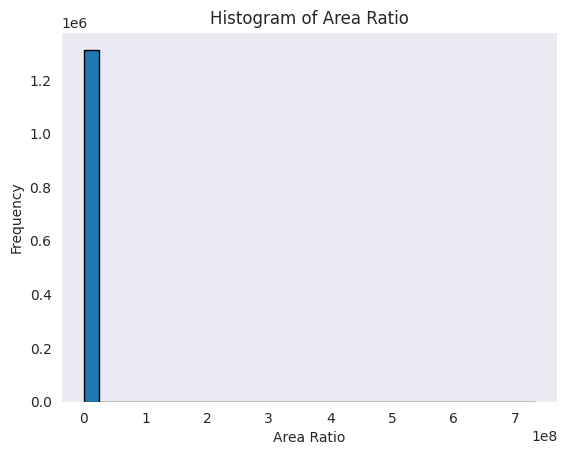

In [ ]:
display_bins(cluster_df)

As can be seen, there are some outliers that severely skew the data. As K-Means Clustering is not robust to outliers, we will therefore exclude these outliers from the clustering as well. Since the most prominent outliers are those that are largest (in scale), we will manually assign them as "explorer" later.

In [ ]:
def iqr_filter(_df):
    # Calculate Q1 and Q3
    Q1 = _df['review_area_ratio'].quantile(0.25)
    Q3 = _df['review_area_ratio'].quantile(0.75)
    
    # Compute the IQR
    IQR = Q3 - Q1
    
    # Define the lower and upper bounds for outliers
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    
    # Filter the outliers
    outliers = _df[(_df['review_area_ratio'] < lower_bound) | (_df['review_area_ratio'] > upper_bound)]

    __df = _df[(_df['review_area_ratio'] >= lower_bound) & (_df['review_area_ratio'] <= upper_bound)]

    lt = _df[(_df['review_area_ratio'] < lower_bound)]
    gt = _df[(_df['review_area_ratio'] > upper_bound)]
    
    # Get the number of outliers
    num_outliers = outliers.shape[0]
    print("Number of outliers:", num_outliers)

    display_bins(__df)
    return lt, __df, gt

Number of outliers: 248323
Largest bin boundaries: [2.5227158028716374, 4.045431605743275]


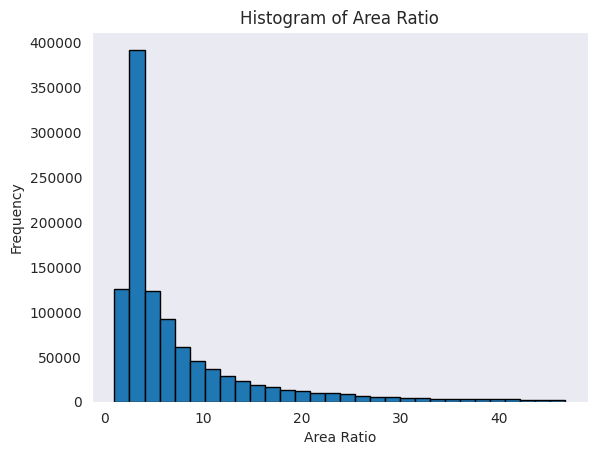

In [ ]:
lt_df, cluster_df, gt_df = iqr_filter(cluster_df)

In [ ]:
kmeans = KMeans(n_clusters=2)
kmeans_clustered = cluster_df.copy()

kmeans_clustered['prelim_clusters'] = kmeans.fit_predict(cluster_df[['user_id', 'review_area_ratio']].set_index('user_id'))
cluster_centers = kmeans.cluster_centers_.flatten()
local_expert_label = np.argmin(cluster_centers)
explorer_label = np.argmax(cluster_centers)
print("cluster_centers:", cluster_centers)
kmeans_clustered['user_isExplorer'] = kmeans_clustered['prelim_clusters'].map({
    local_expert_label: 0,
    explorer_label: 1
})
kmeans_clustered

OpenBLAS warning: precompiled NUM_THREADS exceeded, adding auxiliary array for thread metadata.
To avoid this warning, please rebuild your copy of OpenBLAS with a larger NUM_THREADS setting
or set the environment variable OPENBLAS_NUM_THREADS to 64 or lower


cluster_centers: [ 4.86611196 24.36463757]


,user_id,review_area_ratio,review_id,review_date,review_visited,prelim_clusters,user_isExplorer
1311077,nkN_do3fJ9xekchVC-v68A,1.879360,2438144,2004-10-19,1,0,0
1311076,nkN_do3fJ9xekchVC-v68A,2.777952,2438143,2004-10-19,1,0,0
1311068,nkN_do3fJ9xekchVC-v68A,2.777778,2438135,2004-10-19,1,0,0
355527,62GNFh5FySkA3MbrQmnqvg,2.778268,677153,2004-12-19,1,0,0
453072,G5LXEaxhQMF_BVjNHkVr7g,2.777837,859158,2005-04-27,1,0,0
...,...,...,...,...,...,...,...
1090429,qWKGC0dkooHX1JNr3vjntw,3.722758,2037568,2017-12-11,1,0,0
1090433,qWKGC0dkooHX1JNr3vjntw,5.656032,2037572,2017-12-11,1,0,0
1254281,Y8yCmnhZmmtKHQCLpCZ7yA,2.779266,2334594,2017-12-11,1,0,0
972867,ZNtTwd6J74_zar1Ac6GqBQ,3.311025,1823754,2017-12-11,1,0,0


In [ ]:
kmeans_freq = kmeans_clustered['user_isExplorer'].value_counts()
kmeans_freq

user_isExplorer
0    926210
1    137883
Name: count, dtype: int64

In [ ]:
print(f"LocalExpert: {kmeans_freq.iloc[0]} | {kmeans_freq.iloc[0]/kmeans_freq.sum()}")
print(f"Explorer: {kmeans_freq.iloc[1]} | {kmeans_freq.iloc[1]/kmeans_freq.sum()}")

LocalExpert: 926210 | 0.870422040178819
Explorer: 137883 | 0.12957795982118103


In [ ]:
date_df_lst = []
for _, date_df in tqdm(kmeans_clustered.groupby('review_date')):
    date_df = date_df[date_df['review_visited'] != 0]
    if len(date_df) > 1:
        _kmeans = KMeans(n_clusters=2)
        date_df['clusters'] = _kmeans.fit_predict(date_df[['user_id', 'review_area_ratio']].set_index('user_id'))
        _cluster_centers = _kmeans.cluster_centers_.flatten()
        _local_expert_label = np.argmin(_cluster_centers)
        _explorer_label = np.argmax(_cluster_centers)
        #print("cluster_centers:", cluster_centers)
        date_df['user_isExplorer'] = date_df['clusters'].map({
            _local_expert_label: 0,
            _explorer_label: 1
        })
        date_df_lst.append(date_df)
kmeans_clustered = pd.concat(date_df_lst)

100%|██████████| 4151/4151 [00:52<00:00, 78.95it/s] 


In [ ]:
kmeans_freq = kmeans_clustered['user_isExplorer'].value_counts()
kmeans_freq

user_isExplorer
0    919302
1    144680
Name: count, dtype: int64

In [ ]:
print(f"LocalExpert: {kmeans_freq.iloc[0]} | {kmeans_freq.iloc[0]/kmeans_freq.sum()}")
print(f"Explorer: {kmeans_freq.iloc[1]} | {kmeans_freq.iloc[1]/kmeans_freq.sum()}")

LocalExpert: 919302 | 0.8640202559817741
Explorer: 144680 | 0.13597974401822588


In [ ]:
kmeans_clustered = kmeans_clustered[['user_id', 'review_area_ratio', 'user_isExplorer', 'review_id']]
kmeans_clustered

,user_id,review_area_ratio,user_isExplorer,review_id
1311077,nkN_do3fJ9xekchVC-v68A,1.879360,0,2438144
1311076,nkN_do3fJ9xekchVC-v68A,2.777952,1,2438143
1311068,nkN_do3fJ9xekchVC-v68A,2.777778,1,2438135
467477,7e4CioqxGMByqh0lJP5FZg,2.778563,1,885738
467470,7e4CioqxGMByqh0lJP5FZg,2.777799,0,885731
...,...,...,...,...
1090429,qWKGC0dkooHX1JNr3vjntw,3.722758,0,2037568
1090433,qWKGC0dkooHX1JNr3vjntw,5.656032,0,2037572
1254281,Y8yCmnhZmmtKHQCLpCZ7yA,2.779266,0,2334594
972867,ZNtTwd6J74_zar1Ac6GqBQ,3.311025,0,1823754


Combine with small outliers and large outliers, with small outliers set to LocalExperts, large outliers set Explorers 

In [ ]:
lt_df['user_isExplorer'] = 0
gt_df['user_isExplorer'] = 1
clustered_df = pd.concat([lt_df, kmeans_clustered, gt_df])
clustered_df

/tmp/ipykernel_150010/1867533837.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,user_id,review_area_ratio,review_id,review_date,review_visited,user_isExplorer
1311077,nkN_do3fJ9xekchVC-v68A,1.879360,2438144,NaT,NaN,0
1311076,nkN_do3fJ9xekchVC-v68A,2.777952,2438143,NaT,NaN,1
1311068,nkN_do3fJ9xekchVC-v68A,2.777778,2438135,NaT,NaN,1
467477,7e4CioqxGMByqh0lJP5FZg,2.778563,885738,NaT,NaN,1
467470,7e4CioqxGMByqh0lJP5FZg,2.777799,885731,NaT,NaN,0
...,...,...,...,...,...,...
214023,7PiRdxYF-Uvzn2fHqdtU1Q,1446.942429,405580,2017-12-11,1.0,1
1333915,x6_9RC7Mc0SsFUcWxEoN_Q,38367.446027,2480094,2017-12-11,1.0,1
14394,61AymMi8D4RTQ2aa1w41ew,14862.105393,23507,2017-12-11,1.0,1
323202,ZcwLnR_VGfgLmuJ_7tnAjQ,345.669481,616126,2017-12-11,1.0,1


In [ ]:
clustered_freq = clustered_df['user_isExplorer'].value_counts()
print(f"LocalExpert: {clustered_freq.iloc[0]} | {clustered_freq.iloc[0]/clustered_freq.sum()}")
print(f"Explorer: {clustered_freq.iloc[1]} | {clustered_freq.iloc[1]/clustered_freq.sum()}")

LocalExpert: 919302 | 0.7005246493764787
Explorer: 393003 | 0.2994753506235212


Combine back with merged

In [ ]:
clustered_df

,user_id,review_area_ratio,review_id,review_date,review_visited,user_isExplorer
1311077,nkN_do3fJ9xekchVC-v68A,1.879360,2438144,NaT,NaN,0
1311076,nkN_do3fJ9xekchVC-v68A,2.777952,2438143,NaT,NaN,1
1311068,nkN_do3fJ9xekchVC-v68A,2.777778,2438135,NaT,NaN,1
467477,7e4CioqxGMByqh0lJP5FZg,2.778563,885738,NaT,NaN,1
467470,7e4CioqxGMByqh0lJP5FZg,2.777799,885731,NaT,NaN,0
...,...,...,...,...,...,...
214023,7PiRdxYF-Uvzn2fHqdtU1Q,1446.942429,405580,2017-12-11,1.0,1
1333915,x6_9RC7Mc0SsFUcWxEoN_Q,38367.446027,2480094,2017-12-11,1.0,1
14394,61AymMi8D4RTQ2aa1w41ew,14862.105393,23507,2017-12-11,1.0,1
323202,ZcwLnR_VGfgLmuJ_7tnAjQ,345.669481,616126,2017-12-11,1.0,1


In [ ]:
merged = merged.merge(clustered_df.drop(columns=['user_id', 'review_area_ratio', 'review_visited', 'review_date']), how='inner', on='review_id')
merged

,business_id,review_date,review_stars,review_id,user_id,review_bboxes,review_min_bboxes,review_dist_to_centroid,review_bbox_area,review_min_bbox_area,review_area_ratio,user_review_count,user_useful,user_funny,user_cool,user_fans,user_average_stars,user_compliment_score,user_elite_count,user_lifetime,user_num_friends,user_num_tips,business_latitude,business_longitude,business_stars,business_review_count,business_is_open,business_BikeParking,business_WheelchairAccessible,business_total_hours,business_Fri,business_Mon,business_Sat,business_Sun,business_Thu,business_Tue,business_Wed,business_checkins,business_num_years_user_visit_business,review_visited,user_isExplorer
0,u8C8pRvaHXg3PgDrsUHJHQ,2004-10-19,4,2438144,nkN_do3fJ9xekchVC-v68A,"[40.0995845, -88.2443792, 40.1103674315, -88.2...","[40.10177882, -88.2442499, 40.1103606926, -88....",1.107616,1.402726,0.746385,1.879360,1327,31788,3714,3319,1820,3.69,8800,13,3445.0,6750,6,40.103242,-88.244164,3.5,371,1,False,False,83.0,0.151316,0.111842,0.279605,0.203947,0.095395,0.069079,0.088816,304,13.035616,1,0
1,AtLv64FV-Pw6JuT3XUKU1g,2004-10-19,4,2438143,nkN_do3fJ9xekchVC-v68A,"[40.0995845, -88.2443792, 40.1103674315, -88.2...","[40.10389318, -88.2418328, 40.1103629389, -88....",1.509549,1.402726,0.504950,2.777952,1327,31788,3714,3319,1820,3.69,8800,13,3445.0,6750,6,40.099584,-88.244379,3.5,41,0,True,False,0.0,0.222222,0.111111,0.000000,0.444444,0.222222,0.000000,0.000000,9,7.309589,1,1
2,EZOoB2D8uQHV_gJoGCMTxQ,2004-10-19,4,2438135,nkN_do3fJ9xekchVC-v68A,"[40.1103562, -88.2380132, 40.1103674315, -88.2...","[40.1103584463, -88.23653847375999, 40.1103651...",0.125730,0.000784,0.000282,2.777778,1327,31788,3714,3319,1820,3.69,8800,13,3445.0,6750,6,40.110367,-88.230640,3.0,11,1,True,False,49.0,0.212766,0.042553,0.148936,0.085106,0.255319,0.212766,0.042553,47,10.000000,1,1
3,bF8gv7k_rwZtiDLP2ZB04w,2005-07-10,5,885738,7e4CioqxGMByqh0lJP5FZg,"[33.4935632, -111.9264152, 33.6164801, -111.92...","[33.51814658, -111.92567704, 33.59189671999999...",10.906795,4.675986,1.682879,2.778563,520,274,107,261,57,3.89,206,9,4166.0,257,27,33.493563,-111.922724,2.5,45,0,False,False,0.0,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,2,4.663014,1,1
4,67zCgILB2h6JoSvFabVe7g,2005-07-10,5,885731,7e4CioqxGMByqh0lJP5FZg,"[33.4927510539, -111.9264152, 33.6164801, -111...","[33.49307591234, -111.92501925559999, 33.56731...",8.270003,4.706925,1.694480,2.777799,520,274,107,261,57,3.89,206,9,4166.0,257,27,33.492751,-111.922925,4.0,625,1,False,False,70.0,0.152903,0.075009,0.252434,0.244140,0.101334,0.075370,0.098810,2773,12.424658,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1312300,mU3vlAVzTxgmZUu6F4XixA,2017-12-11,4,2037568,qWKGC0dkooHX1JNr3vjntw,"[36.109755, -115.22407185, 36.1274286041, -115...","[36.115653532719996, -115.2116231076, 36.12644...",2.326897,8.863068,2.380780,3.722758,47,1,1,0,0,3.73,6,1,1665.0,26,1,36.109755,-115.173877,4.0,750,1,True,False,75.0,0.127303,0.139866,0.229899,0.243300,0.082496,0.098827,0.078308,2388,0.912329,1,0
1312301,e3PBfbtXUjMziX6XGsOMoA,2017-12-11,4,2037572,qWKGC0dkooHX1JNr3vjntw,"[36.1171281659, -115.22407185, 36.1274286041, ...","[36.12243748778, -115.21473529320001, 36.12668...",0.496450,3.151472,0.557188,5.656032,47,1,1,0,0,3.73,6,1,1665.0,26,1,36.125977,-115.207057,4.5,110,1,False,False,26.0,0.101232,0.099472,0.192782,0.213028,0.108275,0.125000,0.160211,1136,0.079452,1,0
1312302,b-bHa-ziECvPpp9AsTBlRw,2017-12-11,1,2334594,Y8yCmnhZmmtKHQCLpCZ7yA,"[33.3344883, -111.9267133, 33.4832924, -111.68...","[33.38157138, -111.89315682, 33.47085384000000...",6.250737,372.618127,134.070710,2.779266,5,0,0,0,0,4.20,0,1,3653.0,4,2,33.452196,-111.684205,2.5,12,1,False,False,47.0,0.201613,0.120968,0.064516,0.153226,0.112903,0.282258,0.064516,124,5.460274,1,0
1312303,Zp2vJfHciG9IiXfmtH5Wdw,2017-12-11,3,1823754,ZNtTwd6J74_zar1Ac6GqBQ,"[40.404148, -79.9532523, 40

In [ ]:
merged[merged.duplicated(subset=['user_id', 'business_id'], keep=False)]

,business_id,review_date,review_stars,review_id,user_id,review_bboxes,review_min_bboxes,review_dist_to_centroid,review_bbox_area,review_min_bbox_area,review_area_ratio,user_review_count,user_useful,user_funny,user_cool,user_fans,user_average_stars,user_compliment_score,user_elite_count,user_lifetime,user_num_friends,user_num_tips,business_latitude,business_longitude,business_stars,business_review_count,business_is_open,business_BikeParking,business_WheelchairAccessible,business_total_hours,business_Fri,business_Mon,business_Sat,business_Sun,business_Thu,business_Tue,business_Wed,business_checkins,business_num_years_user_visit_business,review_visited,user_isExplorer


In [ ]:
# Sanity check
merged.isna().sum()

business_id                               0
review_date                               0
review_stars                              0
review_id                                 0
user_id                                   0
review_bboxes                             0
review_min_bboxes                         0
review_dist_to_centroid                   0
review_bbox_area                          0
review_min_bbox_area                      0
review_area_ratio                         0
user_review_count                         0
user_useful                               0
user_funny                                0
user_cool                                 0
user_fans                                 0
user_average_stars                        0
user_compliment_score                     0
user_elite_count                          0
user_lifetime                             0
user_num_friends                          0
user_num_tips                             0
business_latitude               

In [ ]:
merged.to_parquet("./dataset_challenge/merged_positives.parquet")

## Hypothesis Testing
### U-test
#### Null hypothesis: Area ratio for Local Experts is not significantly smaller than Explorers
#### Alternative hypothesis: Area ratio for Local Experts is significantly smaller than Explorers

In [ ]:
merged_for_hypo_testing = merged[['user_id', 'review_area_ratio', 'user_isExplorer']]
merged_for_hypo_testing = merged_for_hypo_testing[merged_for_hypo_testing['review_area_ratio'] > 0]
merged_for_hypo_testing

,user_id,review_area_ratio,user_isExplorer
0,nkN_do3fJ9xekchVC-v68A,1.879360,0
1,nkN_do3fJ9xekchVC-v68A,2.777952,1
2,nkN_do3fJ9xekchVC-v68A,2.777778,1
3,7e4CioqxGMByqh0lJP5FZg,2.778563,1
4,7e4CioqxGMByqh0lJP5FZg,2.777799,0
...,...,...,...
1312300,qWKGC0dkooHX1JNr3vjntw,3.722758,0
1312301,qWKGC0dkooHX1JNr3vjntw,5.656032,0
1312302,Y8yCmnhZmmtKHQCLpCZ7yA,2.779266,0
1312303,ZNtTwd6J74_zar1Ac6GqBQ,3.311025,0


Number of outliers: 248317
Largest bin boundaries: [2.522916788223812, 4.045833576447624]


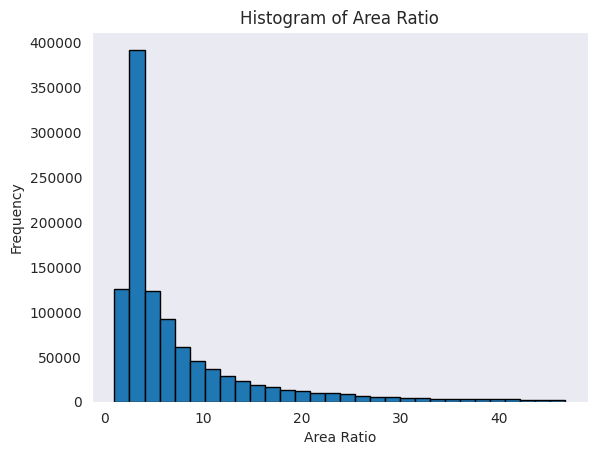

In [ ]:
_, merged_for_hypo_testing, __ = iqr_filter(merged_for_hypo_testing)

In [ ]:
merged_for_hypo_testing.describe()

,review_area_ratio,user_isExplorer
count,1.063988e+06,1.063988e+06
mean,7.383471e+00,1.359846e-01
std,7.763068e+00,3.427724e-01
min,1.000000e+00,0.000000e+00
25%,2.778034e+00,0.000000e+00
50%,4.202150e+00,0.000000e+00
75%,8.730451e+00,0.000000e+00
max,4.668750e+01,1.000000e+00


In [ ]:
alpha = 0.05
stat, p_value = stats.mannwhitneyu(
    merged_for_hypo_testing[merged_for_hypo_testing["user_isExplorer"] == 0]["review_area_ratio"],
    merged_for_hypo_testing[merged_for_hypo_testing["user_isExplorer"] == 1]["review_area_ratio"],
    alternative="two-sided",
)

if p_value < alpha:
    print(f"Reject the Null Hypothesis as p-value ({p_value:.4f}) < alpha ({alpha})")
else:
    print("We do not reject the null hypothesis")

Reject the Null Hypothesis as p-value (0.0000) < alpha (0.05)


### Point Biserial Correlation Test

Though the P-test rejected the Null Hypothesis, its p-value was 0. Thus, we need more conclusive evidence to support our hypothesis. Therefore, point biserial correlation is used to see if there indeed exists a positive correlation between review area ratio and the user's status as an explorer (such that the larger the user's review area ratio, the more likely the user is an explorer). The point biserial correlation is used to measure the relationship between a binary variable, x, and a continuous variable, y. Like other correlation coefficients, this one varies between -1 and +1 with 0 implying no correlation. Correlations of -1 or +1 imply a determinative relationship.

In [ ]:
pointbiserialr, p_value = stats.pointbiserialr(merged_for_hypo_testing['review_area_ratio'], merged_for_hypo_testing['user_isExplorer'])
print(f"Point Biserial Correlation: {pointbiserialr:.7f}")
print(f"p-value: {p_value:.7f}")

Point Biserial Correlation: 0.8320110
p-value: 0.0000000


Since the point biserial correlation is close to 1, this indicates a strong positive correlation between the user's review_area_ratio and its likelihood of being an explorer.

In [ ]:
merged_for_hypo_testing = merged_for_hypo_testing.sort_values(by='review_area_ratio')
merged_for_hypo_testing

,user_id,review_area_ratio,user_isExplorer
97152,Q_5X6fW5FIpWWRcxn0kgHw,1.000000,0
1211701,cKTA-iJbfrioKWFiDreghw,1.000043,0
789506,nuBFHHkSlzS1UrWg7h8VKQ,1.000044,0
1212011,cKTA-iJbfrioKWFiDreghw,1.000053,0
714553,2NDJbnmT9Uo9laBRDGdq6g,1.000074,0
...,...,...,...
175016,PKEzKWv_FktMm2mGPjwd0Q,46.684372,1
777289,r7VZ4wUW-SbIW4fxf51Ukw,46.686019,1
995830,zsJFjhBQEFQ6gJ7BsNM_Ug,46.686195,1
50838,nPXVprOV3ioobtAc_s7-CA,46.687189,1


In [ ]:
merged_for_hypo_testing.describe()

,review_area_ratio,user_isExplorer
count,1.063988e+06,1.063988e+06
mean,7.383471e+00,1.359846e-01
std,7.763068e+00,3.427724e-01
min,1.000000e+00,0.000000e+00
25%,2.778034e+00,0.000000e+00
50%,4.202150e+00,0.000000e+00
75%,8.730451e+00,0.000000e+00
max,4.668750e+01,1.000000e+00


In [ ]:
merged[merged.duplicated(subset=['user_id', 'business_id'], keep=False)]

,business_id,review_date,review_stars,review_id,user_id,review_bboxes,review_min_bboxes,review_dist_to_centroid,review_bbox_area,review_min_bbox_area,review_area_ratio,user_review_count,user_useful,user_funny,user_cool,user_fans,user_average_stars,user_compliment_score,user_elite_count,user_lifetime,user_num_friends,user_num_tips,business_latitude,business_longitude,business_stars,business_review_count,business_is_open,business_BikeParking,business_WheelchairAccessible,business_total_hours,business_Fri,business_Mon,business_Sat,business_Sun,business_Thu,business_Tue,business_Wed,business_checkins,business_num_years_user_visit_business,review_visited,user_isExplorer


In [ ]:
merged.to_parquet("./dataset_challenge/processed.parquet")

#### Generate Negative Samples

In [ ]:
class YelpPreProcessor:
    def __init__(self, merged_df_fpath: str, num_neg: int):
        self.df = pd.read_parquet(merged_df_fpath)
        print("Loaded merged df...")

        # Sort self.df on review_date
        self.df = self.df.sort_values(by="review_date")

        print("df columns:", self.df.columns)

        # self.review_cols = [col for col in self.df if col.startswith('review_') and col != 'review_id' and col != 'review_date' and col != 'review_dist_to_centroid' and col != 'review_bboxes']

        # print("self.review_cols:", self.review_cols)

        self.minimal_df = self.df[
            [
                "business_id",
                'business_latitude',
                'business_longitude',
                "review_bboxes",
                "user_id",
                "review_date",
                "review_id",
                "review_bbox_area",
                "review_min_bbox_area",
                "review_area_ratio",
                "review_dist_to_centroid",
                "review_min_bboxes",
            ]
        ]

        # print('Minimal DF Cols:', self.minimal_df.columns)

        # User keys
        user_keys = [key for key in self.df.columns if key.startswith("user_")]
        print("User Keys:", user_keys)
        self.user_df = self.df.drop_duplicates(subset=["user_id"])[user_keys]

        # Business keys
        business_keys = [key for key in self.df.columns if key.startswith("business_")]
        print("Business Keys:", business_keys)
        self.business_df = self.df.drop_duplicates(subset=["business_id"])[
            business_keys
        ]

        # Get unique businesses from self.df
        self.business_minimal_df = self.df.drop_duplicates(subset=["business_id"])[
            ["business_id", "business_latitude", "business_longitude"]
        ]
        self.num_neg = num_neg

    def process(self, output_fpath: str, is_sequential: bool = False):
        neg_samples = []
        userids = []
        review_dates = []
        review_bboxes = []
        review_ids = []
        review_min_area = []
        gen_area = []
        area_ratio = []
        review_min_bboxes = []
        user_grouped = self.minimal_df.groupby("user_id")

        user_neg_already_sampled = {user_id: [] for user_id in self.minimal_df["user_id"].unique()}

        for user_id, user_df in tqdm(user_grouped, total=len(user_grouped)):
            # print("User_df columns:", user_df.columns)
            idx = 0
            user_biz_lst = user_df["business_id"].to_list()
            for _, row in user_df.iterrows():
                if is_sequential:
                    # Is negative if existing interactions are future
                    neg_lst = user_biz_lst[idx:]
                else:
                    neg_lst = []

                # Is also negative if non patronized businesses are in same bbox
                min_lat, min_lon, max_lat, max_lon = row["review_bboxes"]
                mask = (
                    (self.business_minimal_df["business_latitude"] >= min_lat)
                    & (self.business_minimal_df["business_latitude"] <= max_lat)
                    & (self.business_minimal_df["business_longitude"] >= min_lon)
                    & (self.business_minimal_df["business_longitude"] <= max_lon)
                )

                additional_neg_bizid_lst = self.business_minimal_df.loc[
                    mask, "business_id"
                ].tolist()

                if is_sequential:
                    # Get Positive Samples are those that are patronized before the current review date
                    pos_lst = user_biz_lst[:idx]
                else:
                    # Get Positive Samples are those that are patronized (regardless of review date)
                    pos_lst = user_biz_lst

                # Join neg samples and exclude positive samples from negative samples
                neg_lst = list(set(neg_lst + additional_neg_bizid_lst) - set(pos_lst) - set(user_neg_already_sampled[user_id]))

                # Negative sample
                if len(neg_lst) > 0:
                    num_sample = min(len(neg_lst), self.num_neg)

                    if len(neg_lst) >= self.num_neg:
                        choices = random.sample(neg_lst, k=self.num_neg)
                    else:
                        choices = random.choices(neg_lst, k=len(neg_lst))

                    neg_samples.extend(choices)
                    user_neg_already_sampled[user_id].extend(choices)
                    userids.extend([row["user_id"] for _ in range(num_sample)])
                    review_dates.extend([row["review_date"] for _ in range(num_sample)])
                    review_bboxes.extend(
                        [row["review_bboxes"] for _ in range(num_sample)]
                    )
                    review_ids.extend([row["review_id"] for _ in range(num_sample)])
                    gen_area.extend(row["review_bbox_area"] for _ in range(num_sample))
                    review_min_area.extend(
                        row["review_min_bbox_area"] for _ in range(num_sample)
                    )
                    area_ratio.extend(
                        row["review_area_ratio"] for _ in range(num_sample)
                    )
                    review_min_bboxes.extend(
                        row["review_min_bboxes"] for _ in range(num_sample)
                    )
                idx += 1

        print("Constructing Negative Samples DataFrame...")

        neg_df = pd.DataFrame(
            {
                "user_id": userids,
                "business_id": neg_samples,
                "review_date": review_dates,
                "review_id": review_ids,
                "review_bboxes": review_bboxes,
                "review_bbox_area": gen_area,
                "review_min_bbox_area": review_min_area,
                "review_area_ratio": area_ratio,
                "review_min_bboxes": review_min_bboxes,
            }
        )

        print("Joining Negative Samples with Business DataFrame...")
        neg_df = neg_df.merge(self.business_df, on="business_id", how="inner")

        print("Joining Negative Samples with User DataFrame...")
        neg_df = neg_df.merge(self.user_df, on="user_id", how="inner")

        print("Getting review dist")
        neg_df["review_dist_to_centroid"] = neg_df.apply(
            lambda x: compute_dist_to_centroid(x["review_min_bboxes"], x["business_latitude"], x["business_longitude"]),
            axis=1,
        )

        print("Initializing Interaction Columns...")
        # Add the interaction columns
        for col in ["review_stars", 'review_visited']:
            neg_df[col] = 0

        neg_df.to_parquet("./dataset_challenge/neg_df.parquet")

        print("Concatenating Positive and Negative Samples...")
        self.df = pd.concat([self.df, neg_df])

        print("Saving Processed DataFrame...")
        self.df.to_parquet(output_fpath)



if __name__ == '__main__':
    preprocessor = YelpPreProcessor('./dataset_challenge/merged_positives.parquet', 1)
    preprocessor.process('./dataset_challenge/merged_neg_sampled.parquet')

Loaded merged df...
df columns: Index(['business_id', 'review_date', 'review_stars', 'review_id', 'user_id',
       'review_bboxes', 'review_min_bboxes', 'review_dist_to_centroid',
       'review_bbox_area', 'review_min_bbox_area', 'review_area_ratio',
       'user_review_count', 'user_useful', 'user_funny', 'user_cool',
       'user_fans', 'user_average_stars', 'user_compliment_score',
       'user_elite_count', 'user_lifetime', 'user_num_friends',
       'user_num_tips', 'business_latitude', 'business_longitude',
       'business_stars', 'business_review_count', 'business_is_open',
       'business_BikeParking', 'business_WheelchairAccessible',
       'business_total_hours', 'business_Fri', 'business_Mon', 'business_Sat',
       'business_Sun', 'business_Thu', 'business_Tue', 'business_Wed',
       'business_checkins', 'business_num_years_user_visit_business',
       'review_visited', 'user_isExplorer'],
      dtype='object')
User Keys: ['user_id', 'user_review_count', 'user_useful',

100%|██████████| 129134/129134 [34:07<00:00, 63.08it/s] 


Constructing Negative Samples DataFrame...
Joining Negative Samples with Business DataFrame...
Joining Negative Samples with User DataFrame...
Getting review dist
Initializing Interaction Columns...
Concatenating Positive and Negative Samples...
Saving Processed DataFrame...


## Prepare combined DataFrame for train-test split

In [ ]:
pd.set_option('display.max_columns', None)

In [ ]:
merged_combined_df = pd.read_parquet("./dataset_challenge/merged_neg_sampled.parquet")
merged_combined_df

,business_id,review_date,review_stars,review_id,user_id,review_bboxes,review_min_bboxes,review_dist_to_centroid,review_bbox_area,review_min_bbox_area,review_area_ratio,user_review_count,user_useful,user_funny,user_cool,user_fans,user_average_stars,user_compliment_score,user_elite_count,user_lifetime,user_num_friends,user_num_tips,business_latitude,business_longitude,business_stars,business_review_count,business_is_open,business_BikeParking,business_WheelchairAccessible,business_total_hours,business_Fri,business_Mon,business_Sat,business_Sun,business_Thu,business_Tue,business_Wed,business_checkins,business_num_years_user_visit_business,review_visited,user_isExplorer
0,u8C8pRvaHXg3PgDrsUHJHQ,2004-10-19,4,2438144,nkN_do3fJ9xekchVC-v68A,"[40.0995845, -88.2443792, 40.1103674315, -88.2...","[40.10177882, -88.2442499, 40.1103606926, -88....",1.107616,1.402726,0.746385,1.879360,1327,31788,3714,3319,1820,3.69,8800,13,3445.0,6750,6,40.103242,-88.244164,3.5,371,1,False,False,83.0,0.151316,0.111842,0.279605,0.203947,0.095395,0.069079,0.088816,304,13.035616,1,0
1,AtLv64FV-Pw6JuT3XUKU1g,2004-10-19,4,2438143,nkN_do3fJ9xekchVC-v68A,"[40.0995845, -88.2443792, 40.1103674315, -88.2...","[40.10389318, -88.2418328, 40.1103629389, -88....",1.509549,1.402726,0.504950,2.777952,1327,31788,3714,3319,1820,3.69,8800,13,3445.0,6750,6,40.099584,-88.244379,3.5,41,0,True,False,0.0,0.222222,0.111111,0.000000,0.444444,0.222222,0.000000,0.000000,9,7.309589,1,1
2,EZOoB2D8uQHV_gJoGCMTxQ,2004-10-19,4,2438135,nkN_do3fJ9xekchVC-v68A,"[40.1103562, -88.2380132, 40.1103674315, -88.2...","[40.1103584463, -88.23653847375999, 40.1103651...",0.125730,0.000784,0.000282,2.777778,1327,31788,3714,3319,1820,3.69,8800,13,3445.0,6750,6,40.110367,-88.230640,3.0,11,1,True,False,49.0,0.212766,0.042553,0.148936,0.085106,0.255319,0.212766,0.042553,47,10.000000,1,1
3,bF8gv7k_rwZtiDLP2ZB04w,2005-07-10,5,885738,7e4CioqxGMByqh0lJP5FZg,"[33.4935632, -111.9264152, 33.6164801, -111.92...","[33.51814658, -111.92567704, 33.59189671999999...",10.906795,4.675986,1.682879,2.778563,520,274,107,261,57,3.89,206,9,4166.0,257,27,33.493563,-111.922724,2.5,45,0,False,False,0.0,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,2,4.663014,1,1
4,67zCgILB2h6JoSvFabVe7g,2005-07-10,5,885731,7e4CioqxGMByqh0lJP5FZg,"[33.4927510539, -111.9264152, 33.6164801, -111...","[33.49307591234, -111.92501925559999, 33.56731...",8.270003,4.706925,1.694480,2.777799,520,274,107,261,57,3.89,206,9,4166.0,257,27,33.492751,-111.922925,4.0,625,1,False,False,70.0,0.152903,0.075009,0.252434,0.244140,0.101334,0.075370,0.098810,2773,12.424658,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1312056,_Izvv9Hj0sQRkj0l9fnP7A,2017-08-25,0,2668218,zzo--VpSQh8PpsGVeMC1dQ,"[43.586622408, -79.751707, 45.507842, -73.5655...","[43.659844432279996, -79.54465525632, 43.85843...",41.351341,106635.494131,404.017917,263.937537,40,42,8,14,4,3.88,10,1,2020.0,85,8,43.608649,-79.698157,2.0,6,1,False,False,0.0,0.142857,0.142857,0.142857,0.000000,0.428571,0.142857,0.000000,7,2.720548,0,0
1312057,En02RzaPS_5Exp8_LbJOdA,2017-08-29,0,2668220,zzo--VpSQh8PpsGVeMC1dQ,"[43.586622408, -79.751707, 45.507842, -73.5655...","[43.654524700639996, -79.47611171263999, 43.85...",490.710344,106635.494131,273.922135,389.291263,40,42,8,14,4,3.88,10,1,2020.0,85,8,45.497725,-73.577311,3.0,42,1,False,False,77.0,0.111111,0.222222,0.083333,0.194444,0.111111,0.194444,0.083333,36,2.221918,0,0
1312058,JQrh2cmndqRKwTpVveHPDg,2017-10-22,0,2668223,zzo--VpSQh8PpsGVeMC1dQ,"[43.586622408, -79.751707, 45.507842, -73.5655...","[43.6560081758, -79.4418399408, 43.8562278234,...",3.890069,106635.494131,202.688248,526.105955,40,42,8,14,4,3.88,10,1,2020.0,85,8,43.848003,-79.375919,2.5,82,1,True,False,48.5,0.140187,0.084112,0.317757,0.214953,0.074766,0.065421,0.102804,107,3.295890,0,0
1312059,PEy0IduplUy2zFu72Qh-QQ,2017-11-16,0,2668221,zzo--VpSQh8PpsGVeMC1dQ,"[4

In [ ]:
merged_combined_df.isna().sum()

business_id                               0
review_date                               0
review_stars                              0
review_id                                 0
user_id                                   0
review_bboxes                             0
review_min_bboxes                         0
review_dist_to_centroid                   0
review_bbox_area                          0
review_min_bbox_area                      0
review_area_ratio                         0
user_review_count                         0
user_useful                               0
user_funny                                0
user_cool                                 0
user_fans                                 0
user_average_stars                        0
user_compliment_score                     0
user_elite_count                          0
user_lifetime                             0
user_num_friends                          0
user_num_tips                             0
business_latitude               

In [ ]:
merged_combined_df['review_dist_to_centroid'] = merged_combined_df.progress_apply(lambda x: compute_dist_to_centroid(x['review_min_bboxes'], x['business_latitude'], x['business_longitude']), axis=1)
merged_combined_df

  0%|          | 0/2624366 [00:00<?, ?it/s]

,business_id,review_date,review_stars,review_id,user_id,review_bboxes,review_min_bboxes,review_dist_to_centroid,review_bbox_area,review_min_bbox_area,review_area_ratio,user_review_count,user_useful,user_funny,user_cool,user_fans,user_average_stars,user_compliment_score,user_elite_count,user_lifetime,user_num_friends,user_num_tips,business_latitude,business_longitude,business_stars,business_review_count,business_is_open,business_BikeParking,business_WheelchairAccessible,business_total_hours,business_Fri,business_Mon,business_Sat,business_Sun,business_Thu,business_Tue,business_Wed,business_checkins,business_num_years_user_visit_business,review_visited,user_isExplorer
0,u8C8pRvaHXg3PgDrsUHJHQ,2004-10-19,4,2438144,nkN_do3fJ9xekchVC-v68A,"[40.0995845, -88.2443792, 40.1103674315, -88.2...","[40.10177882, -88.2442499, 40.1103606926, -88....",1.107616,1.402726,0.746385,1.879360,1327,31788,3714,3319,1820,3.69,8800,13,3445.0,6750,6,40.103242,-88.244164,3.5,371,1,False,False,83.0,0.151316,0.111842,0.279605,0.203947,0.095395,0.069079,0.088816,304,13.035616,1,0
1,AtLv64FV-Pw6JuT3XUKU1g,2004-10-19,4,2438143,nkN_do3fJ9xekchVC-v68A,"[40.0995845, -88.2443792, 40.1103674315, -88.2...","[40.10389318, -88.2418328, 40.1103629389, -88....",1.509549,1.402726,0.504950,2.777952,1327,31788,3714,3319,1820,3.69,8800,13,3445.0,6750,6,40.099584,-88.244379,3.5,41,0,True,False,0.0,0.222222,0.111111,0.000000,0.444444,0.222222,0.000000,0.000000,9,7.309589,1,1
2,EZOoB2D8uQHV_gJoGCMTxQ,2004-10-19,4,2438135,nkN_do3fJ9xekchVC-v68A,"[40.1103562, -88.2380132, 40.1103674315, -88.2...","[40.1103584463, -88.23653847375999, 40.1103651...",0.125730,0.000784,0.000282,2.777778,1327,31788,3714,3319,1820,3.69,8800,13,3445.0,6750,6,40.110367,-88.230640,3.0,11,1,True,False,49.0,0.212766,0.042553,0.148936,0.085106,0.255319,0.212766,0.042553,47,10.000000,1,1
3,bF8gv7k_rwZtiDLP2ZB04w,2005-07-10,5,885738,7e4CioqxGMByqh0lJP5FZg,"[33.4935632, -111.9264152, 33.6164801, -111.92...","[33.51814658, -111.92567704, 33.59189671999999...",10.906795,4.675986,1.682879,2.778563,520,274,107,261,57,3.89,206,9,4166.0,257,27,33.493563,-111.922724,2.5,45,0,False,False,0.0,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,2,4.663014,1,1
4,67zCgILB2h6JoSvFabVe7g,2005-07-10,5,885731,7e4CioqxGMByqh0lJP5FZg,"[33.4927510539, -111.9264152, 33.6164801, -111...","[33.49307591234, -111.92501925559999, 33.56731...",8.270003,4.706925,1.694480,2.777799,520,274,107,261,57,3.89,206,9,4166.0,257,27,33.492751,-111.922925,4.0,625,1,False,False,70.0,0.152903,0.075009,0.252434,0.244140,0.101334,0.075370,0.098810,2773,12.424658,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1312056,_Izvv9Hj0sQRkj0l9fnP7A,2017-08-25,0,2668218,zzo--VpSQh8PpsGVeMC1dQ,"[43.586622408, -79.751707, 45.507842, -73.5655...","[43.659844432279996, -79.54465525632, 43.85843...",41.351341,106635.494131,404.017917,263.937537,40,42,8,14,4,3.88,10,1,2020.0,85,8,43.608649,-79.698157,2.0,6,1,False,False,0.0,0.142857,0.142857,0.142857,0.000000,0.428571,0.142857,0.000000,7,2.720548,0,0
1312057,En02RzaPS_5Exp8_LbJOdA,2017-08-29,0,2668220,zzo--VpSQh8PpsGVeMC1dQ,"[43.586622408, -79.751707, 45.507842, -73.5655...","[43.654524700639996, -79.47611171263999, 43.85...",490.710344,106635.494131,273.922135,389.291263,40,42,8,14,4,3.88,10,1,2020.0,85,8,45.497725,-73.577311,3.0,42,1,False,False,77.0,0.111111,0.222222,0.083333,0.194444,0.111111,0.194444,0.083333,36,2.221918,0,0
1312058,JQrh2cmndqRKwTpVveHPDg,2017-10-22,0,2668223,zzo--VpSQh8PpsGVeMC1dQ,"[43.586622408, -79.751707, 45.507842, -73.5655...","[43.6560081758, -79.4418399408, 43.8562278234,...",3.890069,106635.494131,202.688248,526.105955,40,42,8,14,4,3.88,10,1,2020.0,85,8,43.848003,-79.375919,2.5,82,1,True,False,48.5,0.140187,0.084112,0.317757,0.214953,0.074766,0.065421,0.102804,107,3.295890,0,0
1312059,PEy0IduplUy2zFu72Qh-QQ,2017-11-16,0,2668221,zzo--VpSQh8PpsGVeMC1dQ,"[4

Sort interactions by date

In [ ]:
merged_combined_df = merged_combined_df.sort_values(by="review_date")
merged_combined_df

,business_id,review_date,review_stars,review_id,user_id,review_bboxes,review_min_bboxes,review_dist_to_centroid,review_bbox_area,review_min_bbox_area,review_area_ratio,user_review_count,user_useful,user_funny,user_cool,user_fans,user_average_stars,user_compliment_score,user_elite_count,user_lifetime,user_num_friends,user_num_tips,business_latitude,business_longitude,business_stars,business_review_count,business_is_open,business_BikeParking,business_WheelchairAccessible,business_total_hours,business_Fri,business_Mon,business_Sat,business_Sun,business_Thu,business_Tue,business_Wed,business_checkins,business_num_years_user_visit_business,review_visited,user_isExplorer
0,u8C8pRvaHXg3PgDrsUHJHQ,2004-10-19,4,2438144,nkN_do3fJ9xekchVC-v68A,"[40.0995845, -88.2443792, 40.1103674315, -88.2...","[40.10177882, -88.2442499, 40.1103606926, -88....",1.107616,1.402726e+00,0.746385,1.879360,1327,31788,3714,3319,1820,3.69,8800,13,3445.0,6750,6,40.103242,-88.244164,3.5,371,1,False,False,83.00,0.151316,0.111842,0.279605,0.203947,0.095395,0.069079,0.088816,304,13.035616,1,0
1,AtLv64FV-Pw6JuT3XUKU1g,2004-10-19,4,2438143,nkN_do3fJ9xekchVC-v68A,"[40.0995845, -88.2443792, 40.1103674315, -88.2...","[40.10389318, -88.2418328, 40.1103629389, -88....",1.509549,1.402726e+00,0.504950,2.777952,1327,31788,3714,3319,1820,3.69,8800,13,3445.0,6750,6,40.099584,-88.244379,3.5,41,0,True,False,0.00,0.222222,0.111111,0.000000,0.444444,0.222222,0.000000,0.000000,9,7.309589,1,1
2,EZOoB2D8uQHV_gJoGCMTxQ,2004-10-19,4,2438135,nkN_do3fJ9xekchVC-v68A,"[40.1103562, -88.2380132, 40.1103674315, -88.2...","[40.1103584463, -88.23653847375999, 40.1103651...",0.125730,7.839928e-04,0.000282,2.777778,1327,31788,3714,3319,1820,3.69,8800,13,3445.0,6750,6,40.110367,-88.230640,3.0,11,1,True,False,49.00,0.212766,0.042553,0.148936,0.085106,0.255319,0.212766,0.042553,47,10.000000,1,1
1068826,oYMsq2Xvzw6UbrIlMWjb-A,2004-10-19,0,2438135,nkN_do3fJ9xekchVC-v68A,"[40.1103562, -88.2380132, 40.1103674315, -88.2...","[40.1103584463, -88.23653847375999, 40.1103651...",0.502919,7.839928e-04,0.000282,2.777778,1327,31788,3714,3319,1820,3.69,8800,13,3445.0,6750,6,40.110356,-88.238013,2.5,29,1,False,False,0.00,0.100000,0.200000,0.400000,0.200000,0.100000,0.000000,0.000000,10,12.238356,0,0
1068825,sYf2auhosrx8trbyP9nGyw,2004-10-19,0,2438143,nkN_do3fJ9xekchVC-v68A,"[40.0995845, -88.2443792, 40.1103674315, -88.2...","[40.10389318, -88.2418328, 40.1103629389, -88....",0.614031,1.402726e+00,0.504950,2.777952,1327,31788,3714,3319,1820,3.69,8800,13,3445.0,6750,6,40.109906,-88.240767,3.0,50,1,False,False,62.75,0.160000,0.100000,0.260000,0.280000,0.100000,0.080000,0.020000,50,10.575342,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1311984,FB2iUwS4-LMLBQVyLZmZfQ,2017-12-11,3,2225114,lN400ckm9JAMqq5_nsmBEA,"[34.9363259, -115.17764, 40.4431445863, -80.00...","[35.06168516364, -80.93370473867999, 35.227593...",19.418062,1.953863e+06,157.123906,12435.173558,217,85,13,28,16,3.75,90,2,1875.0,137,106,35.052666,-80.847324,3.0,131,1,True,False,0.00,0.167910,0.097015,0.220149,0.186567,0.115672,0.093284,0.119403,268,9.295890,1,1
1311994,Gc8xWVpbUlBYHAoOT9MTyQ,2017-12-11,5,1111631,242-DHMPDzfjYrb45dd9ZQ,"[36.110199, -115.175373, 43.8621066805, -79.26...","[43.64524336488, -79.43408007994, 43.846003766...",22.386256,2.766592e+06,90.532461,30559.113328,58,7,2,3,0,4.11,6,1,778.0,8,2,43.646208,-79.419674,4.0,135,1,False,True,74.00,0.107527,0.080645,0.279570,0.279570,0.080645,0.064516,0.107527,186,2.802740,1,1
1311995,-FtngCwHCD2tRlH8jpj_Ag,2017-12-11,3,1442894,zIj-0Aa0bLomrCIsveQ8PA,"[36.005031, -115.314392948, 36.1692398, -114.9...","[36.0198351359, -115.2085830242, 36.13444508, ...",8.322640,5.271237e+02,183.933805,2.865834,47,44,13,2,2,3.98,5,1,1875.0,27,2,36.059447,-115.046848,3.5,518,1,False,True,30.00,0.113118,0.116920,0.251901,0.258555,0.078897,0.091255,0.089354,1052,2.805479,1,0
1311992,3deqbrFWWy

### Subset Columns (retain only those used for training)

In [ ]:
processed_df = merged_combined_df.drop(columns=['review_date', 'review_id', 'review_bboxes'])
processed_df

,business_id,review_stars,user_id,review_min_bboxes,review_dist_to_centroid,review_bbox_area,review_min_bbox_area,review_area_ratio,user_review_count,user_useful,user_funny,user_cool,user_fans,user_average_stars,user_compliment_score,user_elite_count,user_lifetime,user_num_friends,user_num_tips,business_latitude,business_longitude,business_stars,business_review_count,business_is_open,business_BikeParking,business_WheelchairAccessible,business_total_hours,business_Fri,business_Mon,business_Sat,business_Sun,business_Thu,business_Tue,business_Wed,business_checkins,business_num_years_user_visit_business,review_visited,user_isExplorer
0,u8C8pRvaHXg3PgDrsUHJHQ,4,nkN_do3fJ9xekchVC-v68A,"[40.10177882, -88.2442499, 40.1103606926, -88....",1.107616,1.402726e+00,0.746385,1.879360,1327,31788,3714,3319,1820,3.69,8800,13,3445.0,6750,6,40.103242,-88.244164,3.5,371,1,False,False,83.00,0.151316,0.111842,0.279605,0.203947,0.095395,0.069079,0.088816,304,13.035616,1,0
1,AtLv64FV-Pw6JuT3XUKU1g,4,nkN_do3fJ9xekchVC-v68A,"[40.10389318, -88.2418328, 40.1103629389, -88....",1.509549,1.402726e+00,0.504950,2.777952,1327,31788,3714,3319,1820,3.69,8800,13,3445.0,6750,6,40.099584,-88.244379,3.5,41,0,True,False,0.00,0.222222,0.111111,0.000000,0.444444,0.222222,0.000000,0.000000,9,7.309589,1,1
2,EZOoB2D8uQHV_gJoGCMTxQ,4,nkN_do3fJ9xekchVC-v68A,"[40.1103584463, -88.23653847375999, 40.1103651...",0.125730,7.839928e-04,0.000282,2.777778,1327,31788,3714,3319,1820,3.69,8800,13,3445.0,6750,6,40.110367,-88.230640,3.0,11,1,True,False,49.00,0.212766,0.042553,0.148936,0.085106,0.255319,0.212766,0.042553,47,10.000000,1,1
1068826,oYMsq2Xvzw6UbrIlMWjb-A,0,nkN_do3fJ9xekchVC-v68A,"[40.1103584463, -88.23653847375999, 40.1103651...",0.502919,7.839928e-04,0.000282,2.777778,1327,31788,3714,3319,1820,3.69,8800,13,3445.0,6750,6,40.110356,-88.238013,2.5,29,1,False,False,0.00,0.100000,0.200000,0.400000,0.200000,0.100000,0.000000,0.000000,10,12.238356,0,0
1068825,sYf2auhosrx8trbyP9nGyw,0,nkN_do3fJ9xekchVC-v68A,"[40.10389318, -88.2418328, 40.1103629389, -88....",0.614031,1.402726e+00,0.504950,2.777952,1327,31788,3714,3319,1820,3.69,8800,13,3445.0,6750,6,40.109906,-88.240767,3.0,50,1,False,False,62.75,0.160000,0.100000,0.260000,0.280000,0.100000,0.080000,0.020000,50,10.575342,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1311984,FB2iUwS4-LMLBQVyLZmZfQ,3,lN400ckm9JAMqq5_nsmBEA,"[35.06168516364, -80.93370473867999, 35.227593...",19.418062,1.953863e+06,157.123906,12435.173558,217,85,13,28,16,3.75,90,2,1875.0,137,106,35.052666,-80.847324,3.0,131,1,True,False,0.00,0.167910,0.097015,0.220149,0.186567,0.115672,0.093284,0.119403,268,9.295890,1,1
1311994,Gc8xWVpbUlBYHAoOT9MTyQ,5,242-DHMPDzfjYrb45dd9ZQ,"[43.64524336488, -79.43408007994, 43.846003766...",22.386256,2.766592e+06,90.532461,30559.113328,58,7,2,3,0,4.11,6,1,778.0,8,2,43.646208,-79.419674,4.0,135,1,False,True,74.00,0.107527,0.080645,0.279570,0.279570,0.080645,0.064516,0.107527,186,2.802740,1,1
1311995,-FtngCwHCD2tRlH8jpj_Ag,3,zIj-0Aa0bLomrCIsveQ8PA,"[36.0198351359, -115.2085830242, 36.13444508, ...",8.322640,5.271237e+02,183.933805,2.865834,47,44,13,2,2,3.98,5,1,1875.0,27,2,36.059447,-115.046848,3.5,518,1,False,True,30.00,0.113118,0.116920,0.251901,0.258555,0.078897,0.091255,0.089354,1052,2.805479,1,0
1311992,3deqbrFWWyHdlvAbmqWqMQ,5,vOPnC4XPRSknykbxYIG8Hw,"[33.501389419999995, -112.23751938000001, 33.7...",18.994724,1.389974e+03,538.079454,2.583214,67,17,0,0,1,4.21,3,1,1903.0,7,4,33.578059,-112.118126,3.5,110,1,True,False,79.00,0.090476,0.109524,0.300000,0.195238,0.133333,0.071429,0.100000,210,3.846575,1,0


### Encode all Categorical Columns 

In [ ]:
enc_dict = {}
    
cat_cols = ['business_id', 'user_id', 'business_BikeParking', 'business_WheelchairAccessible']
for col in cat_cols:
    le = LabelEncoder()
    processed_df[col] = le.fit_transform(processed_df[col])
    enc_dict[col] = le

processed_df

,business_id,review_stars,user_id,review_min_bboxes,review_dist_to_centroid,review_bbox_area,review_min_bbox_area,review_area_ratio,user_review_count,user_useful,user_funny,user_cool,user_fans,user_average_stars,user_compliment_score,user_elite_count,user_lifetime,user_num_friends,user_num_tips,business_latitude,business_longitude,business_stars,business_review_count,business_is_open,business_BikeParking,business_WheelchairAccessible,business_total_hours,business_Fri,business_Mon,business_Sat,business_Sun,business_Thu,business_Tue,business_Wed,business_checkins,business_num_years_user_visit_business,review_visited,user_isExplorer
0,40332,4,104793,"[40.10177882, -88.2442499, 40.1103606926, -88....",1.107616,1.402726e+00,0.746385,1.879360,1327,31788,3714,3319,1820,3.69,8800,13,3445.0,6750,6,40.103242,-88.244164,3.5,371,1,0,0,83.00,0.151316,0.111842,0.279605,0.203947,0.095395,0.069079,0.088816,304,13.035616,1,0
1,8293,4,104793,"[40.10389318, -88.2418328, 40.1103629389, -88....",1.509549,1.402726e+00,0.504950,2.777952,1327,31788,3714,3319,1820,3.69,8800,13,3445.0,6750,6,40.099584,-88.244379,3.5,41,0,1,0,0.00,0.222222,0.111111,0.000000,0.444444,0.222222,0.000000,0.000000,9,7.309589,1,1
2,10817,4,104793,"[40.1103584463, -88.23653847375999, 40.1103651...",0.125730,7.839928e-04,0.000282,2.777778,1327,31788,3714,3319,1820,3.69,8800,13,3445.0,6750,6,40.110367,-88.230640,3.0,11,1,1,0,49.00,0.212766,0.042553,0.148936,0.085106,0.255319,0.212766,0.042553,47,10.000000,1,1
1068826,36475,0,104793,"[40.1103584463, -88.23653847375999, 40.1103651...",0.502919,7.839928e-04,0.000282,2.777778,1327,31788,3714,3319,1820,3.69,8800,13,3445.0,6750,6,40.110356,-88.238013,2.5,29,1,0,0,0.00,0.100000,0.200000,0.400000,0.200000,0.100000,0.000000,0.000000,10,12.238356,0,0
1068825,39257,0,104793,"[40.10389318, -88.2418328, 40.1103629389, -88....",0.614031,1.402726e+00,0.504950,2.777952,1327,31788,3714,3319,1820,3.69,8800,13,3445.0,6750,6,40.109906,-88.240767,3.0,50,1,0,0,62.75,0.160000,0.100000,0.260000,0.280000,0.100000,0.080000,0.020000,50,10.575342,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1311984,11270,3,99978,"[35.06168516364, -80.93370473867999, 35.227593...",19.418062,1.953863e+06,157.123906,12435.173558,217,85,13,28,16,3.75,90,2,1875.0,137,106,35.052666,-80.847324,3.0,131,1,1,0,0.00,0.167910,0.097015,0.220149,0.186567,0.115672,0.093284,0.119403,268,9.295890,1,1
1311994,12250,5,6322,"[43.64524336488, -79.43408007994, 43.846003766...",22.386256,2.766592e+06,90.532461,30559.113328,58,7,2,3,0,4.11,6,1,778.0,8,2,43.646208,-79.419674,4.0,135,1,0,1,74.00,0.107527,0.080645,0.279570,0.279570,0.080645,0.064516,0.107527,186,2.802740,1,1
1311995,180,3,127773,"[36.0198351359, -115.2085830242, 36.13444508, ...",8.322640,5.271237e+02,183.933805,2.865834,47,44,13,2,2,3.98,5,1,1875.0,27,2,36.059447,-115.046848,3.5,518,1,0,1,30.00,0.113118,0.116920,0.251901,0.258555,0.078897,0.091255,0.089354,1052,2.805479,1,0
1311992,3212,5,120054,"[33.501389419999995, -112.23751938000001, 33.7...",18.994724,1.389974e+03,538.079454,2.583214,67,17,0,0,1,4.21,3,1,1903.0,7,4,33.578059,-112.118126,3.5,110,1,1,0,79.00,0.090476,0.109524,0.300000,0.195238,0.133333,0.071429,0.100000,210,3.846575,1,0


### Normalize Continuous Columns

In [ ]:
cont_cols = ['review_dist_to_centroid', 'review_bbox_area', 'review_min_bbox_area', 'review_area_ratio', 'business_review_count', 'business_total_hours', 'business_Fri', 'business_Mon', 'business_Sat', 'business_Sun', 'business_Thu', 'business_Tue', 'business_Wed', 'business_checkins', 'business_num_years_user_visit_business', 'user_review_count', 'user_useful', 'user_funny', 'user_cool', 'user_fans', 'user_average_stars', 'user_compliment_score', 'user_elite_count', 'user_lifetime', 'user_num_friends', 'user_num_tips', 'business_stars', 'review_stars']

# First Standardize data to 0 mean
s = StandardScaler()
processed_df[cont_cols] = s.fit_transform(processed_df[cont_cols])

# Next Rescale to 0~1
s2 = MinMaxScaler()
processed_df[cont_cols] = s2.fit_transform(processed_df[cont_cols])

scalers_d = {'StandardScaler': s, 'Columns': cont_cols, 'MinMaxScaler': s2}
processed_df

,business_id,review_stars,user_id,review_min_bboxes,review_dist_to_centroid,review_bbox_area,review_min_bbox_area,review_area_ratio,user_review_count,user_useful,user_funny,user_cool,user_fans,user_average_stars,user_compliment_score,user_elite_count,user_lifetime,user_num_friends,user_num_tips,business_latitude,business_longitude,business_stars,business_review_count,business_is_open,business_BikeParking,business_WheelchairAccessible,business_total_hours,business_Fri,business_Mon,business_Sat,business_Sun,business_Thu,business_Tue,business_Wed,business_checkins,business_num_years_user_visit_business,review_visited,user_isExplorer
0,40332,0.8,104793,"[40.10177882, -88.2442499, 40.1103606926, -88....",0.000092,2.127810e-08,2.957571e-08,1.201578e-09,0.158361,0.169543,0.026850,0.017794,0.259666,0.6725,0.076658,1.000000,0.728286,0.554051,0.002626,40.103242,-88.244164,0.625,0.049755,1,0,0,0.494391,0.151316,0.111842,0.279605,0.203947,0.095395,0.069079,0.088816,0.009354,1.000000,1,0
1,8293,0.8,104793,"[40.10389318, -88.2418328, 40.1103629389, -88....",0.000126,2.127810e-08,2.000878e-08,2.429435e-09,0.158361,0.169543,0.026850,0.017794,0.259666,0.6725,0.076658,1.000000,0.728286,0.554051,0.002626,40.099584,-88.244379,0.625,0.004894,0,1,0,0.000000,0.222222,0.111111,0.000000,0.444444,0.222222,0.000000,0.000000,0.000247,0.560740,1,1
2,10817,0.8,104793,"[40.1103584463, -88.23653847375999, 40.1103651...",0.000010,1.189246e-11,1.118373e-11,2.429197e-09,0.158361,0.169543,0.026850,0.017794,0.259666,0.6725,0.076658,1.000000,0.728286,0.554051,0.002626,40.110367,-88.230640,0.500,0.000816,1,1,0,0.291869,0.212766,0.042553,0.148936,0.085106,0.255319,0.212766,0.042553,0.001420,0.767129,1,1
1068826,36475,0.0,104793,"[40.1103584463, -88.23653847375999, 40.1103651...",0.000042,1.189246e-11,1.118373e-11,2.429197e-09,0.158361,0.169543,0.026850,0.017794,0.259666,0.6725,0.076658,1.000000,0.728286,0.554051,0.002626,40.110356,-88.238013,0.375,0.003263,1,0,0,0.000000,0.100000,0.200000,0.400000,0.200000,0.100000,0.000000,0.000000,0.000278,0.938840,0,0
1068825,39257,0.0,104793,"[40.10389318, -88.2418328, 40.1103629389, -88....",0.000051,2.127810e-08,2.000878e-08,2.429435e-09,0.158361,0.169543,0.026850,0.017794,0.259666,0.6725,0.076658,1.000000,0.728286,0.554051,0.002626,40.109906,-88.240767,0.500,0.006117,1,0,0,0.373771,0.160000,0.100000,0.260000,0.280000,0.100000,0.080000,0.020000,0.001513,0.811265,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1311984,11270,0.6,99978,"[35.06168516364, -80.93370473867999, 35.227593...",0.001615,2.963835e-02,6.226079e-06,1.699034e-05,0.025395,0.000453,0.000094,0.000150,0.002283,0.6875,0.000784,0.083333,0.398107,0.011245,0.055147,35.052666,-80.847324,0.500,0.017129,1,1,0,0.000000,0.167910,0.097015,0.220149,0.186567,0.115672,0.093284,0.119403,0.008243,0.713115,1,1
1311994,12250,1.0,6322,"[43.64524336488, -79.43408007994, 43.846003766...",0.001862,4.196672e-02,3.587374e-06,4.175531e-05,0.006349,0.000037,0.000014,0.000016,0.000000,0.7775,0.000052,0.000000,0.167403,0.000657,0.000525,43.646208,-79.419674,0.750,0.017673,1,0,1,0.440782,0.107527,0.080645,0.279570,0.279570,0.080645,0.064516,0.107527,0.005711,0.215006,1,1
1311995,180,0.6,127773,"[36.0198351359, -115.2085830242, 36.13444508, ...",0.000692,7.995995e-06,7.288429e-06,2.549519e-09,0.005031,0.000235,0.000094,0.000011,0.000285,0.7450,0.000044,0.000000,0.398107,0.002216,0.000525,36.059447,-115.046848,0.625,0.069739,1,0,1,0.178696,0.113118,0.116920,0.251901,0.258555,0.078897,0.091255,0.089354,0.032446,0.215216,1,0
1311992,3212,1.0,120054,"[33.501389419999995, -112.23751938000001, 33.7...",0.001580,2.108467e-05,2.132155e-05,2.163340e-09,0.007427,0.000091,0.000000,0.000000,0.000143,0.8025,0.000026,0.000000,0.403996,0.000575,0.001576,33.578059,-112.118126,0.625,0.014274,1,1,0,0.470565,0.090476,0.109524,0.300000,0.195238,0.133333,0.071429,0.100000,0.006452,0.295082,1,0


Rows which have review_stars > 0 has been visited before, rows which have review_stars = 0 has been added during negative sampling (user did not visit them)

In [ ]:
processed_df.describe()

,business_id,review_stars,user_id,review_dist_to_centroid,review_bbox_area,review_min_bbox_area,review_area_ratio,user_review_count,user_useful,user_funny,user_cool,user_fans,user_average_stars,user_compliment_score,user_elite_count,user_lifetime,user_num_friends,user_num_tips,business_latitude,business_longitude,business_stars,business_review_count,business_is_open,business_BikeParking,business_WheelchairAccessible,business_total_hours,business_Fri,business_Mon,business_Sat,business_Sun,business_Thu,business_Tue,business_Wed,business_checkins,business_num_years_user_visit_business,review_visited,user_isExplorer
count,2.624366e+06,2.624366e+06,2.624366e+06,2.624366e+06,2.624366e+06,2.624366e+06,2.624366e+06,2.624366e+06,2.624366e+06,2.624366e+06,2.624366e+06,2.624366e+06,2.624366e+06,2.624366e+06,2.624366e+06,2.624366e+06,2.624366e+06,2.624366e+06,2.624366e+06,2.624366e+06,2.624366e+06,2.624366e+06,2.624366e+06,2.624366e+06,2.624366e+06,2.624366e+06,2.624366e+06,2.624366e+06,2.624366e+06,2.624366e+06,2.624366e+06,2.624366e+06,2.624366e+06,2.624366e+06,2.624366e+06,2.624366e+06,2.624366e+06
mean,2.215528e+04,3.733845e-01,6.434810e+04,8.134600e-03,4.209564e-03,1.714021e-03,2.492617e-05,2.404365e-02,2.930661e-03,2.243388e-03,2.460494e-03,2.950364e-03,6.917920e-01,3.277070e-03,1.015559e-01,3.562864e-01,1.614456e-02,1.528687e-02,3.748304e+01,-1.003788e+02,6.476902e-01,3.368491e-02,7.916556e-01,3.966909e-01,2.050979e-01,3.175981e-01,1.453841e-01,1.140006e-01,1.991471e-01,1.838899e-01,1.248464e-01,1.123727e-01,1.203593e-01,2.662464e-02,4.443959e-01,5.000465e-01,1.559146e-01
std,1.278373e+04,4.123961e-01,3.712336e+04,3.786311e-02,2.206573e-02,1.909830e-02,1.707638e-03,5.391975e-02,1.939962e-02,1.845789e-02,1.847013e-02,1.004484e-02,1.262606e-01,1.832583e-02,1.733572e-01,1.835242e-01,4.245889e-02,5.137603e-02,4.218558e+00,1.833412e+01,1.693932e-01,7.480239e-02,4.061245e-01,4.892109e-01,4.037732e-01,2.017087e-01,7.007011e-02,6.515306e-02,9.103503e-02,9.587278e-02,6.722634e-02,6.683636e-02,6.975856e-02,6.630512e-02,2.575544e-01,5.000001e-01,3.627744e-01
min,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,-3.451293e+01,-1.424666e+02,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
25%,1.112500e+04,0.000000e+00,3.207700e+04,2.591761e-04,1.421231e-06,4.927644e-07,2.430205e-09,2.395783e-03,1.066712e-05,0.000000e+00,0.000000e+00,0.000000e+00,6.250000e-01,1.742221e-05,0.000000e+00,2.130389e-01,7.387343e-04,5.252101e-04,3.361024e+01,-1.151375e+02,5.000000e-01,2.990756e-03,1.000000e+00,0.000000e+00,0.000000e+00,1.548695e-01,1.176471e-01,8.333333e-02,1.577181e-01,1.333333e-01,9.523810e-02,8.196721e-02,8.855292e-02,1.543591e-03,2.202606e-01,0.000000e+00,0.000000e+00
50%,2.211600e+04,2.000000e-01,6.418550e+04,6.697566e-04,6.361633e-06,2.124817e-06,6.537720e-09,7.906085e-03,8.533697e-05,2.168790e-05,1.608398e-05,4.280211e-04,7.000000e-01,8.711105e-05,0.000000e+00,3.514196e-01,4.186161e-03,2.100840e-03,3.611079e+01,-1.119289e+02,6.250000e-01,1.128331e-02,1.000000e+00,0.000000e+00,0.000000e+00,3.931301e-01,1.393468e-01,1.150288e-01,1.979167e-01,1.870048e-01,1.192053e-01,1.075581e-01,1.138211e-01,6.328723e-03,4.367381e-01,1.000000e+00,0.000000e+00
75%,3.308200e+04,8.000000e-01,9.629800e+04,1.369465e-03,2.713882e-05,5.467172e-06,2.643663e-08,2.383805e-02,5.280225e-04,2.024204e-04,1.393945e-04,1.854758e-03,7.700000e-01,6.968884e-04,1.666667e-01,4.895899e-01,1.420011e-02,9.453782e-03,4.141463e+01,-8.075069e+01,7.500000e-01,3.412181e-02,1.000000e+00,1.000000e+00,0.000000e+00,4.646084e-01,1.666667e-01,1.422652e-01,2.380282e-01,2.316687e-01,1.461538e-01,1.348537e-01,1.428571e-01,2.312299e-02,6.626734e-01,1.

### Sanity Check

Ensure that there are no missing values for all the columns

In [ ]:
processed_df.isna().sum()

business_id                               0
review_stars                              0
user_id                                   0
review_min_bboxes                         0
review_dist_to_centroid                   0
review_bbox_area                          0
review_min_bbox_area                      0
review_area_ratio                         0
user_review_count                         0
user_useful                               0
user_funny                                0
user_cool                                 0
user_fans                                 0
user_average_stars                        0
user_compliment_score                     0
user_elite_count                          0
user_lifetime                             0
user_num_friends                          0
user_num_tips                             0
business_latitude                         0
business_longitude                        0
business_stars                            0
business_review_count           

Check dtypes for all columns

In [ ]:
processed_df.dtypes

business_id                                 int64
review_stars                              float64
user_id                                     int64
review_min_bboxes                          object
review_dist_to_centroid                   float64
review_bbox_area                          float64
review_min_bbox_area                      float64
review_area_ratio                         float64
user_review_count                         float64
user_useful                               float64
user_funny                                float64
user_cool                                 float64
user_fans                                 float64
user_average_stars                        float64
user_compliment_score                     float64
user_elite_count                          float64
user_lifetime                             float64
user_num_friends                          float64
user_num_tips                             float64
business_latitude                         float64


In [ ]:
duplicates = processed_df[processed_df.duplicated(subset=['user_id', 'business_id'], keep=False)]
duplicates = duplicates.sort_values(by=['user_id', 'business_id'])
duplicates

,business_id,review_stars,user_id,review_min_bboxes,review_dist_to_centroid,review_bbox_area,review_min_bbox_area,review_area_ratio,user_review_count,user_useful,user_funny,user_cool,user_fans,user_average_stars,user_compliment_score,user_elite_count,user_lifetime,user_num_friends,user_num_tips,business_latitude,business_longitude,business_stars,business_review_count,business_is_open,business_BikeParking,business_WheelchairAccessible,business_total_hours,business_Fri,business_Mon,business_Sat,business_Sun,business_Thu,business_Tue,business_Wed,business_checkins,business_num_years_user_visit_business,review_visited,user_isExplorer


In [ ]:
processed_df.to_parquet("./dataset_challenge/processed.parquet")

## Train-Val-Test Split

We will be splitting the data using a ratio of 0.8:0.1:0.1, with Temporal ordering. This means for each user, we will allocate the first (by review date) 0.8 * dataset length samples to the user, the next 0.1 * dataset length samples to val, and the last 0.1 * dataset length samples to test

In [ ]:
processed_df = pd.read_parquet("./dataset_challenge/processed.parquet")
processed_df

,business_id,review_stars,user_id,review_min_bboxes,review_dist_to_centroid,review_bbox_area,review_min_bbox_area,review_area_ratio,user_review_count,user_useful,user_funny,user_cool,user_fans,user_average_stars,user_compliment_score,user_elite_count,user_lifetime,user_num_friends,user_num_tips,business_latitude,business_longitude,business_stars,business_review_count,business_is_open,business_BikeParking,business_WheelchairAccessible,business_total_hours,business_Fri,business_Mon,business_Sat,business_Sun,business_Thu,business_Tue,business_Wed,business_checkins,business_num_years_user_visit_business,review_visited,user_isExplorer
0,40332,0.8,104793,"[40.10177882, -88.2442499, 40.1103606926, -88....",0.000092,2.127810e-08,2.957571e-08,1.201578e-09,0.158361,0.169543,0.026850,0.017794,0.259666,0.6725,0.076658,1.000000,0.728286,0.554051,0.002626,40.103242,-88.244164,0.625,0.049755,1,0,0,0.494391,0.151316,0.111842,0.279605,0.203947,0.095395,0.069079,0.088816,0.009354,1.000000,1,0
1,8293,0.8,104793,"[40.10389318, -88.2418328, 40.1103629389, -88....",0.000126,2.127810e-08,2.000878e-08,2.429435e-09,0.158361,0.169543,0.026850,0.017794,0.259666,0.6725,0.076658,1.000000,0.728286,0.554051,0.002626,40.099584,-88.244379,0.625,0.004894,0,1,0,0.000000,0.222222,0.111111,0.000000,0.444444,0.222222,0.000000,0.000000,0.000247,0.560740,1,1
2,10817,0.8,104793,"[40.1103584463, -88.23653847375999, 40.1103651...",0.000010,1.189246e-11,1.118373e-11,2.429197e-09,0.158361,0.169543,0.026850,0.017794,0.259666,0.6725,0.076658,1.000000,0.728286,0.554051,0.002626,40.110367,-88.230640,0.500,0.000816,1,1,0,0.291869,0.212766,0.042553,0.148936,0.085106,0.255319,0.212766,0.042553,0.001420,0.767129,1,1
1068826,36475,0.0,104793,"[40.1103584463, -88.23653847375999, 40.1103651...",0.000042,1.189246e-11,1.118373e-11,2.429197e-09,0.158361,0.169543,0.026850,0.017794,0.259666,0.6725,0.076658,1.000000,0.728286,0.554051,0.002626,40.110356,-88.238013,0.375,0.003263,1,0,0,0.000000,0.100000,0.200000,0.400000,0.200000,0.100000,0.000000,0.000000,0.000278,0.938840,0,0
1068825,39257,0.0,104793,"[40.10389318, -88.2418328, 40.1103629389, -88....",0.000051,2.127810e-08,2.000878e-08,2.429435e-09,0.158361,0.169543,0.026850,0.017794,0.259666,0.6725,0.076658,1.000000,0.728286,0.554051,0.002626,40.109906,-88.240767,0.500,0.006117,1,0,0,0.373771,0.160000,0.100000,0.260000,0.280000,0.100000,0.080000,0.020000,0.001513,0.811265,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1311984,11270,0.6,99978,"[35.06168516364, -80.93370473867999, 35.227593...",0.001615,2.963835e-02,6.226079e-06,1.699034e-05,0.025395,0.000453,0.000094,0.000150,0.002283,0.6875,0.000784,0.083333,0.398107,0.011245,0.055147,35.052666,-80.847324,0.500,0.017129,1,1,0,0.000000,0.167910,0.097015,0.220149,0.186567,0.115672,0.093284,0.119403,0.008243,0.713115,1,1
1311994,12250,1.0,6322,"[43.64524336488, -79.43408007994, 43.846003766...",0.001862,4.196672e-02,3.587374e-06,4.175531e-05,0.006349,0.000037,0.000014,0.000016,0.000000,0.7775,0.000052,0.000000,0.167403,0.000657,0.000525,43.646208,-79.419674,0.750,0.017673,1,0,1,0.440782,0.107527,0.080645,0.279570,0.279570,0.080645,0.064516,0.107527,0.005711,0.215006,1,1
1311995,180,0.6,127773,"[36.0198351359, -115.2085830242, 36.13444508, ...",0.000692,7.995995e-06,7.288429e-06,2.549519e-09,0.005031,0.000235,0.000094,0.000011,0.000285,0.7450,0.000044,0.000000,0.398107,0.002216,0.000525,36.059447,-115.046848,0.625,0.069739,1,0,1,0.178696,0.113118,0.116920,0.251901,0.258555,0.078897,0.091255,0.089354,0.032446,0.215216,1,0
1311992,3212,1.0,120054,"[33.501389419999995, -112.23751938000001, 33.7...",0.001580,2.108467e-05,2.132155e-05,2.163340e-09,0.007427,0.000091,0.000000,0.000000,0.000143,0.8025,0.000026,0.000000,0.403996,0.000575,0.001576,33.578059,-112.118126,0.625,0.014274,1,1,0,0.470565,0.090476,0.109524,0.300000,0.195238,0.133333,0.071429,0.100000,0.006452,0.295082,1,0


In [ ]:
train_ratio = 0.8
val_ratio = 0.1

user_grouped = processed_df.groupby('user_id')

train_lst = []
val_lst = []
test_lst = []

for user_id, _user_df in tqdm(user_grouped):
    num_rows = len(_user_df)

    # Use np.ceil to avoid always rounding down to zero for small numbers
    train_end_idx = int(np.ceil(train_ratio * num_rows))
    val_end_idx = train_end_idx + int(np.ceil(val_ratio * num_rows))

    # Ensure indices don't exceed num_rows
    train_end_idx = min(train_end_idx, num_rows)
    val_end_idx = min(val_end_idx, num_rows)

    train_lst.append(_user_df.iloc[:train_end_idx])
    val_lst.append(_user_df.iloc[train_end_idx:val_end_idx])
    test_lst.append(_user_df.iloc[val_end_idx:])

print("Concatenating split train...")
train_df = pd.concat(train_lst)

print("Concatenating split val...")
val_df = pd.concat(val_lst)

print("Concatenating split test...")
test_df = pd.concat(test_lst)

print(f"len(train_df) = {len(train_df)}")
print(f"len(val_df) = {len(val_df)}")
print(f"len(test_df) = {len(test_df)}")

train_df.to_parquet("./dataset_challenge/train.parquet")
val_df.to_parquet("./dataset_challenge/val.parquet")
test_df.to_parquet("./dataset_challenge/test.parquet")

100%|██████████| 129134/129134 [00:29<00:00, 4413.66it/s] 


Concatenating split train...
Concatenating split val...
Concatenating split test...
len(train_df) = 2155785
len(val_df) = 282464
len(test_df) = 186117


In [ ]:
train = pd.read_parquet("./dataset_challenge/train.parquet")
train

,business_id,review_stars,user_id,review_min_bboxes,review_dist_to_centroid,review_bbox_area,review_min_bbox_area,review_area_ratio,user_review_count,user_useful,user_funny,user_cool,user_fans,user_average_stars,user_compliment_score,user_elite_count,user_lifetime,user_num_friends,user_num_tips,business_latitude,business_longitude,business_stars,business_review_count,business_is_open,business_BikeParking,business_WheelchairAccessible,business_total_hours,business_Fri,business_Mon,business_Sat,business_Sun,business_Thu,business_Tue,business_Wed,business_checkins,business_num_years_user_visit_business,review_visited,user_isExplorer
65663,38717,1.0,0,"[36.13193102432, -115.2669130874, 36.156529360...",0.000715,7.481900e-07,7.035237e-07,2.429617e-09,0.028869,0.000357,0.000159,0.000048,0.002140,0.74,0.000427,0.25,0.811356,0.060494,0.008403,36.164180,-115.289630,0.750,0.108755,1,1,0,0.553956,0.141658,0.130522,0.166667,0.208835,0.121760,0.108616,0.121942,0.169085,0.552963,1,0
1,24324,0.0,0,"[36.12755701216, -115.2201084832, 36.140679048...",0.000239,2.109223e-07,1.983413e-07,2.429407e-09,0.028869,0.000357,0.000159,0.000048,0.002140,0.74,0.000427,0.25,0.811356,0.060494,0.008403,36.124904,-115.207248,0.875,0.050299,1,0,0,0.470565,0.108179,0.196570,0.133245,0.147098,0.142480,0.154354,0.118074,0.046771,0.167087,0,0
0,41604,0.0,0,"[36.13193102432, -115.2669130874, 36.156529360...",0.000174,7.481900e-07,7.035237e-07,2.429617e-09,0.028869,0.000357,0.000159,0.000048,0.002140,0.74,0.000427,0.25,0.811356,0.060494,0.008403,36.159015,-115.217721,0.375,0.000000,0,1,0,0.000000,0.000000,0.000000,0.500000,0.000000,0.000000,0.500000,0.000000,0.000031,0.154056,0,0
65661,33865,0.8,0,"[36.12755701216, -115.2201084832, 36.140679048...",0.000383,2.109223e-07,1.983413e-07,2.429407e-09,0.028869,0.000357,0.000159,0.000048,0.002140,0.74,0.000427,0.25,0.811356,0.060494,0.008403,36.145053,-115.232838,0.750,0.025965,1,1,0,0.458652,0.157895,0.152047,0.138402,0.079922,0.171540,0.140351,0.159844,0.015806,0.825347,1,0
2,3608,0.0,0,"[36.13630503648, -115.2555547596, 36.165747935...",0.000783,8.197162e-07,8.452585e-07,2.095135e-09,0.028869,0.000357,0.000159,0.000048,0.002140,0.74,0.000427,0.25,0.811356,0.060494,0.008403,36.130944,-115.278453,0.625,0.026101,1,0,0,0.262087,0.165746,0.171271,0.008287,0.110497,0.168508,0.174033,0.201657,0.011145,0.772594,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1312054,40286,0.0,129133,"[43.6690500936, -79.57892702816001, 43.8591640...",0.001513,1.617565e-03,1.789054e-05,3.213611e-07,0.004193,0.000224,0.000058,0.000075,0.000571,0.72,0.000087,0.00,0.428601,0.006977,0.003676,43.829573,-79.536329,0.750,0.003127,1,0,1,0.458652,0.066667,0.133333,0.100000,0.266667,0.133333,0.066667,0.233333,0.000895,0.154056,0,0
1312056,25952,0.0,129133,"[43.659844432279996, -79.54465525632, 43.85843...",0.003440,1.617565e-03,1.600932e-05,3.592839e-07,0.004193,0.000224,0.000058,0.000075,0.000571,0.72,0.000087,0.00,0.428601,0.006977,0.003676,43.608649,-79.698157,0.250,0.000136,1,0,0,0.000000,0.142857,0.142857,0.142857,0.000000,0.428571,0.142857,0.000000,0.000185,0.208701,0,0
1312055,35477,0.0,129133,"[43.66176256052, -79.51038348448, 43.857695945...",0.002667,1.617565e-03,1.314964e-05,4.377154e-07,0.004193,0.000224,0.000058,0.000075,0.000571,0.72,0.000087,0.00,0.428601,0.006977,0.003676,43.601239,-79.503774,0.625,0.000000,0,0,1,0.000000,0.150000,0.100000,0.150000,0.050000,0.200000,0.100000,0.250000,0.000587,0.258512,0,0
1234849,32141,0.6,129133,"[43.66176256052, -79.51038348448, 43.857695945...",0.000529,1.617565e-03,1.314964e-05,4.377154e-07,0.004193,0.000224,0.000058,0.000075,0.000571,0.72,0.000087,0.00,0.428601,0.006977,0.003676,43.841888,-79.397453,0.625,0.003535,1,0,1,0.062543,0.158730,0.174603,0.158730,0.158730,0.158730,0.031746,0.158730,0.001914,0.037201,1,1


In [ ]:
list(train.columns)

['business_id',
 'review_stars',
 'user_id',
 'review_min_bboxes',
 'review_dist_to_centroid',
 'review_bbox_area',
 'review_min_bbox_area',
 'review_area_ratio',
 'user_review_count',
 'user_useful',
 'user_funny',
 'user_cool',
 'user_fans',
 'user_average_stars',
 'user_compliment_score',
 'user_elite_count',
 'user_lifetime',
 'user_num_friends',
 'user_num_tips',
 'business_latitude',
 'business_longitude',
 'business_stars',
 'business_review_count',
 'business_is_open',
 'business_BikeParking',
 'business_WheelchairAccessible',
 'business_total_hours',
 'business_Fri',
 'business_Mon',
 'business_Sat',
 'business_Sun',
 'business_Thu',
 'business_Tue',
 'business_Wed',
 'business_checkins',
 'business_num_years_user_visit_business',
 'review_visited',
 'user_isExplorer']

In [ ]:
train.dtypes

business_id                                 int64
review_stars                              float64
user_id                                     int64
review_min_bboxes                          object
review_dist_to_centroid                   float64
review_bbox_area                          float64
review_min_bbox_area                      float64
review_area_ratio                         float64
user_review_count                         float64
user_useful                               float64
user_funny                                float64
user_cool                                 float64
user_fans                                 float64
user_average_stars                        float64
user_compliment_score                     float64
user_elite_count                          float64
user_lifetime                             float64
user_num_friends                          float64
user_num_tips                             float64
business_latitude                         float64


In [ ]:
val = pd.read_parquet("./dataset_challenge/val.parquet")
val

,business_id,review_stars,user_id,review_min_bboxes,review_dist_to_centroid,review_bbox_area,review_min_bbox_area,review_area_ratio,user_review_count,user_useful,user_funny,user_cool,user_fans,user_average_stars,user_compliment_score,user_elite_count,user_lifetime,user_num_friends,user_num_tips,business_latitude,business_longitude,business_stars,business_review_count,business_is_open,business_BikeParking,business_WheelchairAccessible,business_total_hours,business_Fri,business_Mon,business_Sat,business_Sun,business_Thu,business_Tue,business_Wed,business_checkins,business_num_years_user_visit_business,review_visited,user_isExplorer
223865,9487,1.0,0,"[36.119686599999994, -115.311712516, 36.164332...",0.001189,0.000014,0.000003,1.706784e-08,0.028869,0.000357,0.000159,0.000048,0.002140,0.74,0.000427,0.25,0.811356,0.060494,0.008403,36.114442,-115.308663,0.875,0.026237,0,1,0,0.000000,0.131667,0.137500,0.187500,0.173333,0.115833,0.102500,0.151667,0.037015,0.173182,1,0
43,2706,0.0,0,"[36.114053727599995, -115.31145718799999, 36.1...",0.000605,0.000014,0.000003,1.541075e-08,0.028869,0.000357,0.000159,0.000048,0.002140,0.74,0.000427,0.25,0.811356,0.060494,0.008403,36.101328,-115.188152,0.250,0.001631,1,0,0,0.000000,0.250000,0.093750,0.093750,0.093750,0.125000,0.187500,0.156250,0.000957,0.354351,0,0
259172,4544,1.0,0,"[36.114053727599995, -115.31145718799999, 36.1...",0.000956,0.000014,0.000003,1.541075e-08,0.028869,0.000357,0.000159,0.000048,0.002140,0.74,0.000427,0.25,0.811356,0.060494,0.008403,36.082350,-115.243453,0.625,0.013322,0,0,1,0.545021,0.183178,0.102804,0.138318,0.104673,0.153271,0.114019,0.203738,0.016486,0.237495,1,0
44,37357,0.0,0,"[36.114442, -115.31120186, 36.1645604, -115.16...",0.000893,0.000014,0.000003,1.584267e-08,0.028869,0.000357,0.000159,0.000048,0.002140,0.74,0.000427,0.25,0.811356,0.060494,0.008403,36.068080,-115.176755,0.625,0.001088,1,0,1,0.428869,0.097561,0.109756,0.170732,0.207317,0.109756,0.134146,0.170732,0.002501,0.531526,0,0
45,33006,0.0,0,"[36.1161902, -115.31069408799999, 36.164484365...",0.000481,0.000014,0.000003,1.657230e-08,0.028869,0.000357,0.000159,0.000048,0.002140,0.74,0.000427,0.25,0.811356,0.060494,0.008403,36.112370,-115.170678,0.625,0.025014,1,1,0,0.000000,0.141397,0.160136,0.197615,0.212947,0.095400,0.107325,0.085179,0.018091,0.914670,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1312057,10979,0.0,129133,"[43.654524700639996, -79.47611171263999, 43.85...",0.040824,0.001618,0.000011,5.305702e-07,0.004193,0.000224,0.000058,0.000075,0.000571,0.72,0.000087,0.00,0.428601,0.006977,0.003676,45.497725,-73.577311,0.500,0.005030,1,0,0,0.458652,0.111111,0.222222,0.083333,0.194444,0.111111,0.194444,0.083333,0.001081,0.170450,0,0
1237867,27609,0.8,129133,"[43.654524700639996, -79.47611171263999, 43.85...",0.002030,0.001618,0.000011,5.305702e-07,0.004193,0.000224,0.000058,0.000075,0.000571,0.72,0.000087,0.00,0.428601,0.006977,0.003676,43.644159,-79.400247,0.625,0.026237,1,0,0,0.339521,0.175000,0.107143,0.214286,0.178571,0.114286,0.100000,0.110714,0.008613,0.316309,1,1
1312058,14227,0.0,129133,"[43.6560081758, -79.4418399408, 43.8562278234,...",0.000324,0.001618,0.000008,7.175169e-07,0.004193,0.000224,0.000058,0.000075,0.000571,0.72,0.000087,0.00,0.428601,0.006977,0.003676,43.848003,-79.375919,0.375,0.010468,1,1,0,0.288891,0.140187,0.084112,0.317757,0.214953,0.074766,0.065421,0.102804,0.003272,0.252837,0,0
1277571,13040,0.8,129133,"[43.6560081758, -79.4418399408, 43.8562278234,...",0.000298,0.001618,0.000008,7.175169e-07,0.004193,0.000224,0.000058,0.000075,0.000571,0.72,0.000087,0.00,0.428601,0.006977,0.003676,43.829270,-79.353234,0.750,0.012507,1,1,0,0.000000,0.139535,0.093023,0.226744,0.174419,0.139535,0.087209,0.139535,0.005279,0.193359,1,1


In [ ]:
test = pd.read_parquet("./dataset_challenge/test.parquet")
test

,business_id,review_stars,user_id,review_min_bboxes,review_dist_to_centroid,review_bbox_area,review_min_bbox_area,review_area_ratio,user_review_count,user_useful,user_funny,user_cool,user_fans,user_average_stars,user_compliment_score,user_elite_count,user_lifetime,user_num_friends,user_num_tips,business_latitude,business_longitude,business_stars,business_review_count,business_is_open,business_BikeParking,business_WheelchairAccessible,business_total_hours,business_Fri,business_Mon,business_Sat,business_Sun,business_Thu,business_Tue,business_Wed,business_checkins,business_num_years_user_visit_business,review_visited,user_isExplorer
670705,32371,1.0,0,"[36.121434799999996, -115.309170772, 36.168301...",0.000905,0.000014,0.000003,1.689250e-08,0.028869,0.000357,0.000159,0.000048,0.002140,0.740,0.000427,0.250000,0.811356,0.060494,0.008403,36.166576,-115.286232,0.875,0.260875,1,1,0,0.524174,0.108139,0.110882,0.237997,0.269319,0.101966,0.081161,0.090535,0.135002,0.328499,1,1
48,20899,0.0,0,"[36.121434799999996, -115.309170772, 36.168301...",0.000607,0.000014,0.000003,1.689250e-08,0.028869,0.000357,0.000159,0.000048,0.002140,0.740,0.000427,0.250000,0.811356,0.060494,0.008403,36.106686,-115.137084,0.500,0.004214,0,1,0,0.000000,0.160714,0.125000,0.089286,0.160714,0.196429,0.089286,0.178571,0.001698,0.590584,0,0
678923,18294,0.2,0,"[36.114442, -115.308663, 36.1680995, -115.1685...",0.001621,0.000014,0.000003,1.499893e-08,0.028869,0.000357,0.000159,0.000048,0.002140,0.740,0.000427,0.250000,0.811356,0.060494,0.008403,35.995317,-115.206948,0.875,0.057912,1,1,0,0.291869,0.136456,0.124236,0.170061,0.190428,0.117108,0.137475,0.124236,0.030285,0.683060,1,0
49,36113,0.0,0,"[36.114442, -115.308663, 36.1680995, -115.1685...",0.000275,0.000014,0.000003,1.499893e-08,0.028869,0.000357,0.000159,0.000048,0.002140,0.740,0.000427,0.250000,0.811356,0.060494,0.008403,36.144304,-115.146420,0.625,0.002583,1,0,1,0.000000,0.156250,0.114583,0.187500,0.166667,0.104167,0.114583,0.156250,0.002933,0.362547,0,0
782470,22769,0.2,0,"[36.1128889104, -115.30837074, 36.167794799999...",0.000633,0.000014,0.000003,1.332693e-08,0.028869,0.000357,0.000159,0.000048,0.002140,0.740,0.000427,0.250000,0.811356,0.060494,0.008403,36.101467,-115.134574,0.625,0.051794,1,0,0,0.000000,0.161000,0.119500,0.195500,0.157000,0.142500,0.114000,0.110500,0.061713,0.862337,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1032606,30062,0.4,129129,"[33.52428228, -115.1742478, 36.137215729, -111...",0.239476,0.057206,0.003530,5.647330e-08,0.086488,0.000165,0.000036,0.000027,0.001569,0.735,0.000200,0.083333,0.337750,0.014364,0.000000,43.653790,-79.398698,0.625,0.061718,1,0,0,0.071478,0.147897,0.149254,0.207598,0.213026,0.124830,0.050204,0.107191,0.022722,0.673182,1,1
1312029,18442,0.0,129129,"[33.52428228, -115.1742478, 36.137215729, -111...",0.232851,0.057206,0.003530,5.647330e-08,0.086488,0.000165,0.000036,0.000027,0.001569,0.735,0.000200,0.083333,0.337750,0.014364,0.000000,35.173589,-80.847268,0.875,0.006797,1,1,0,0.548000,0.071429,0.142857,0.267857,0.232143,0.098214,0.107143,0.080357,0.003427,0.029214,0,0
1294791,17214,0.8,129133,"[43.65792630404, -79.44024563578, 43.859164066...",0.000335,0.001618,0.000008,7.573122e-07,0.004193,0.000224,0.000058,0.000075,0.000571,0.720,0.000087,0.000000,0.428601,0.006977,0.003676,43.864249,-79.383347,0.625,0.001903,1,1,0,0.422913,0.120000,0.160000,0.200000,0.200000,0.160000,0.020000,0.140000,0.001513,0.020177,1,1
1312060,5995,0.0,129133,"[43.659844432279996, -79.43865133076, 43.85843...",0.002172,0.001618,0.000009,6.752347e-07,0.004193,0.000224,0.000058,0.000075,0.000571,0.720,0.000087,0.000000,0.428601,0.006977,0.003676,43.640332,-79.438391,0.750,0.007069,1,0,0,0.062543,0.181818,0.077922,0.363636,0.181818,0.103896,0.064935,0.025974,0.002346,0.226566,0,0


In [ ]:
len(processed_df['business_id'].unique())

44400

In [ ]:
print("train:", len(train['business_id'].unique()))
print("val:", len(val['business_id'].unique()))
print("test:", len(test['business_id'].unique()))

train: 44375
val: 41131
test: 38799


In [ ]:
mask_val = val['business_id'].isin(train['business_id'])
mask_val = ~mask_val
mask_test = test['business_id'].isin(train['business_id'])
mask_test = ~mask_test

In [ ]:
val.drop(val[mask_val].index, inplace=True)
val

,business_id,review_stars,user_id,review_min_bboxes,review_dist_to_centroid,review_bbox_area,review_min_bbox_area,review_area_ratio,user_review_count,user_useful,user_funny,user_cool,user_fans,user_average_stars,user_compliment_score,user_elite_count,user_lifetime,user_num_friends,user_num_tips,business_latitude,business_longitude,business_stars,business_review_count,business_is_open,business_BikeParking,business_WheelchairAccessible,business_total_hours,business_Fri,business_Mon,business_Sat,business_Sun,business_Thu,business_Tue,business_Wed,business_checkins,business_num_years_user_visit_business,review_visited,user_isExplorer
223865,9487,1.0,0,"[36.119686599999994, -115.311712516, 36.164332...",0.001189,0.000014,0.000003,1.706784e-08,0.028869,0.000357,0.000159,0.000048,0.002140,0.74,0.000427,0.25,0.811356,0.060494,0.008403,36.114442,-115.308663,0.875,0.026237,0,1,0,0.000000,0.131667,0.137500,0.187500,0.173333,0.115833,0.102500,0.151667,0.037015,0.173182,1,0
43,2706,0.0,0,"[36.114053727599995, -115.31145718799999, 36.1...",0.000605,0.000014,0.000003,1.541075e-08,0.028869,0.000357,0.000159,0.000048,0.002140,0.74,0.000427,0.25,0.811356,0.060494,0.008403,36.101328,-115.188152,0.250,0.001631,1,0,0,0.000000,0.250000,0.093750,0.093750,0.093750,0.125000,0.187500,0.156250,0.000957,0.354351,0,0
259172,4544,1.0,0,"[36.114053727599995, -115.31145718799999, 36.1...",0.000956,0.000014,0.000003,1.541075e-08,0.028869,0.000357,0.000159,0.000048,0.002140,0.74,0.000427,0.25,0.811356,0.060494,0.008403,36.082350,-115.243453,0.625,0.013322,0,0,1,0.545021,0.183178,0.102804,0.138318,0.104673,0.153271,0.114019,0.203738,0.016486,0.237495,1,0
44,37357,0.0,0,"[36.114442, -115.31120186, 36.1645604, -115.16...",0.000893,0.000014,0.000003,1.584267e-08,0.028869,0.000357,0.000159,0.000048,0.002140,0.74,0.000427,0.25,0.811356,0.060494,0.008403,36.068080,-115.176755,0.625,0.001088,1,0,1,0.428869,0.097561,0.109756,0.170732,0.207317,0.109756,0.134146,0.170732,0.002501,0.531526,0,0
45,33006,0.0,0,"[36.1161902, -115.31069408799999, 36.164484365...",0.000481,0.000014,0.000003,1.657230e-08,0.028869,0.000357,0.000159,0.000048,0.002140,0.74,0.000427,0.25,0.811356,0.060494,0.008403,36.112370,-115.170678,0.625,0.025014,1,1,0,0.000000,0.141397,0.160136,0.197615,0.212947,0.095400,0.107325,0.085179,0.018091,0.914670,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1312057,10979,0.0,129133,"[43.654524700639996, -79.47611171263999, 43.85...",0.040824,0.001618,0.000011,5.305702e-07,0.004193,0.000224,0.000058,0.000075,0.000571,0.72,0.000087,0.00,0.428601,0.006977,0.003676,45.497725,-73.577311,0.500,0.005030,1,0,0,0.458652,0.111111,0.222222,0.083333,0.194444,0.111111,0.194444,0.083333,0.001081,0.170450,0,0
1237867,27609,0.8,129133,"[43.654524700639996, -79.47611171263999, 43.85...",0.002030,0.001618,0.000011,5.305702e-07,0.004193,0.000224,0.000058,0.000075,0.000571,0.72,0.000087,0.00,0.428601,0.006977,0.003676,43.644159,-79.400247,0.625,0.026237,1,0,0,0.339521,0.175000,0.107143,0.214286,0.178571,0.114286,0.100000,0.110714,0.008613,0.316309,1,1
1312058,14227,0.0,129133,"[43.6560081758, -79.4418399408, 43.8562278234,...",0.000324,0.001618,0.000008,7.175169e-07,0.004193,0.000224,0.000058,0.000075,0.000571,0.72,0.000087,0.00,0.428601,0.006977,0.003676,43.848003,-79.375919,0.375,0.010468,1,1,0,0.288891,0.140187,0.084112,0.317757,0.214953,0.074766,0.065421,0.102804,0.003272,0.252837,0,0
1277571,13040,0.8,129133,"[43.6560081758, -79.4418399408, 43.8562278234,...",0.000298,0.001618,0.000008,7.175169e-07,0.004193,0.000224,0.000058,0.000075,0.000571,0.72,0.000087,0.00,0.428601,0.006977,0.003676,43.829270,-79.353234,0.750,0.012507,1,1,0,0.000000,0.139535,0.093023,0.226744,0.174419,0.139535,0.087209,0.139535,0.005279,0.193359,1,1


In [ ]:
test.drop(test[mask_test].index, inplace=True)
test

,business_id,review_stars,user_id,review_min_bboxes,review_dist_to_centroid,review_bbox_area,review_min_bbox_area,review_area_ratio,user_review_count,user_useful,user_funny,user_cool,user_fans,user_average_stars,user_compliment_score,user_elite_count,user_lifetime,user_num_friends,user_num_tips,business_latitude,business_longitude,business_stars,business_review_count,business_is_open,business_BikeParking,business_WheelchairAccessible,business_total_hours,business_Fri,business_Mon,business_Sat,business_Sun,business_Thu,business_Tue,business_Wed,business_checkins,business_num_years_user_visit_business,review_visited,user_isExplorer
670705,32371,1.0,0,"[36.121434799999996, -115.309170772, 36.168301...",0.000905,0.000014,0.000003,1.689250e-08,0.028869,0.000357,0.000159,0.000048,0.002140,0.740,0.000427,0.250000,0.811356,0.060494,0.008403,36.166576,-115.286232,0.875,0.260875,1,1,0,0.524174,0.108139,0.110882,0.237997,0.269319,0.101966,0.081161,0.090535,0.135002,0.328499,1,1
48,20899,0.0,0,"[36.121434799999996, -115.309170772, 36.168301...",0.000607,0.000014,0.000003,1.689250e-08,0.028869,0.000357,0.000159,0.000048,0.002140,0.740,0.000427,0.250000,0.811356,0.060494,0.008403,36.106686,-115.137084,0.500,0.004214,0,1,0,0.000000,0.160714,0.125000,0.089286,0.160714,0.196429,0.089286,0.178571,0.001698,0.590584,0,0
678923,18294,0.2,0,"[36.114442, -115.308663, 36.1680995, -115.1685...",0.001621,0.000014,0.000003,1.499893e-08,0.028869,0.000357,0.000159,0.000048,0.002140,0.740,0.000427,0.250000,0.811356,0.060494,0.008403,35.995317,-115.206948,0.875,0.057912,1,1,0,0.291869,0.136456,0.124236,0.170061,0.190428,0.117108,0.137475,0.124236,0.030285,0.683060,1,0
49,36113,0.0,0,"[36.114442, -115.308663, 36.1680995, -115.1685...",0.000275,0.000014,0.000003,1.499893e-08,0.028869,0.000357,0.000159,0.000048,0.002140,0.740,0.000427,0.250000,0.811356,0.060494,0.008403,36.144304,-115.146420,0.625,0.002583,1,0,1,0.000000,0.156250,0.114583,0.187500,0.166667,0.104167,0.114583,0.156250,0.002933,0.362547,0,0
782470,22769,0.2,0,"[36.1128889104, -115.30837074, 36.167794799999...",0.000633,0.000014,0.000003,1.332693e-08,0.028869,0.000357,0.000159,0.000048,0.002140,0.740,0.000427,0.250000,0.811356,0.060494,0.008403,36.101467,-115.134574,0.625,0.051794,1,0,0,0.000000,0.161000,0.119500,0.195500,0.157000,0.142500,0.114000,0.110500,0.061713,0.862337,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1032606,30062,0.4,129129,"[33.52428228, -115.1742478, 36.137215729, -111...",0.239476,0.057206,0.003530,5.647330e-08,0.086488,0.000165,0.000036,0.000027,0.001569,0.735,0.000200,0.083333,0.337750,0.014364,0.000000,43.653790,-79.398698,0.625,0.061718,1,0,0,0.071478,0.147897,0.149254,0.207598,0.213026,0.124830,0.050204,0.107191,0.022722,0.673182,1,1
1312029,18442,0.0,129129,"[33.52428228, -115.1742478, 36.137215729, -111...",0.232851,0.057206,0.003530,5.647330e-08,0.086488,0.000165,0.000036,0.000027,0.001569,0.735,0.000200,0.083333,0.337750,0.014364,0.000000,35.173589,-80.847268,0.875,0.006797,1,1,0,0.548000,0.071429,0.142857,0.267857,0.232143,0.098214,0.107143,0.080357,0.003427,0.029214,0,0
1294791,17214,0.8,129133,"[43.65792630404, -79.44024563578, 43.859164066...",0.000335,0.001618,0.000008,7.573122e-07,0.004193,0.000224,0.000058,0.000075,0.000571,0.720,0.000087,0.000000,0.428601,0.006977,0.003676,43.864249,-79.383347,0.625,0.001903,1,1,0,0.422913,0.120000,0.160000,0.200000,0.200000,0.160000,0.020000,0.140000,0.001513,0.020177,1,1
1312060,5995,0.0,129133,"[43.659844432279996, -79.43865133076, 43.85843...",0.002172,0.001618,0.000009,6.752347e-07,0.004193,0.000224,0.000058,0.000075,0.000571,0.720,0.000087,0.000000,0.428601,0.006977,0.003676,43.640332,-79.438391,0.750,0.007069,1,0,0,0.062543,0.181818,0.077922,0.363636,0.181818,0.103896,0.064935,0.025974,0.002346,0.226566,0,0


In [ ]:
mask_val = val['business_id'].isin(train['business_id'])
mask_test = test['business_id'].isin(train['business_id'])

In [ ]:
print("mask_val:", mask_val.all())
print("mask_test:", mask_test.all())

mask_val: True
mask_test: True


In [ ]:
user_mask_val = val_df['user_id'].isin(train_df['user_id'])
user_mask_test = test_df['user_id'].isin(train_df['user_id'])

In [ ]:
print("user_mask_val:", user_mask_val.all())
print("user_mask_test:", user_mask_test.all())

user_mask_val: True
user_mask_test: True


In [ ]:
val.to_parquet("./dataset_challenge/val.parquet")
test.to_parquet("./dataset_challenge/test.parquet")

In [ ]:
_test = test[test['business_is_open'] == 1]
_test

,business_id,review_stars,user_id,review_min_bboxes,review_dist_to_centroid,review_bbox_area,review_min_bbox_area,review_area_ratio,user_review_count,user_useful,user_funny,user_cool,user_fans,user_average_stars,user_compliment_score,user_elite_count,user_lifetime,user_num_friends,user_num_tips,business_latitude,business_longitude,business_stars,business_review_count,business_is_open,business_BikeParking,business_WheelchairAccessible,business_total_hours,business_Fri,business_Mon,business_Sat,business_Sun,business_Thu,business_Tue,business_Wed,business_checkins,business_num_years_user_visit_business,review_visited,user_isExplorer
670705,32371,1.0,0,"[36.121434799999996, -115.309170772, 36.168301...",0.000905,0.000014,0.000003,1.689250e-08,0.028869,0.000357,0.000159,0.000048,0.002140,0.740,0.000427,0.250000,0.811356,0.060494,0.008403,36.166576,-115.286232,0.875,0.260875,1,1,0,0.524174,0.108139,0.110882,0.237997,0.269319,0.101966,0.081161,0.090535,0.135002,0.328499,1,1
678923,18294,0.2,0,"[36.114442, -115.308663, 36.1680995, -115.1685...",0.001621,0.000014,0.000003,1.499893e-08,0.028869,0.000357,0.000159,0.000048,0.002140,0.740,0.000427,0.250000,0.811356,0.060494,0.008403,35.995317,-115.206948,0.875,0.057912,1,1,0,0.291869,0.136456,0.124236,0.170061,0.190428,0.117108,0.137475,0.124236,0.030285,0.683060,1,0
49,36113,0.0,0,"[36.114442, -115.308663, 36.1680995, -115.1685...",0.000275,0.000014,0.000003,1.499893e-08,0.028869,0.000357,0.000159,0.000048,0.002140,0.740,0.000427,0.250000,0.811356,0.060494,0.008403,36.144304,-115.146420,0.625,0.002583,1,0,1,0.000000,0.156250,0.114583,0.187500,0.166667,0.104167,0.114583,0.156250,0.002933,0.362547,0,0
782470,22769,0.2,0,"[36.1128889104, -115.30837074, 36.167794799999...",0.000633,0.000014,0.000003,1.332693e-08,0.028869,0.000357,0.000159,0.000048,0.002140,0.740,0.000427,0.250000,0.811356,0.060494,0.008403,36.101467,-115.134574,0.625,0.051794,1,0,0,0.000000,0.161000,0.119500,0.195500,0.157000,0.142500,0.114000,0.110500,0.061713,0.862337,1,0
814981,30862,1.0,0,"[36.1132771828, -115.30807847999999, 36.167490...",0.000317,0.000014,0.000003,1.386064e-08,0.028869,0.000357,0.000159,0.000048,0.002140,0.740,0.000427,0.250000,0.811356,0.060494,0.008403,36.143973,-115.189843,0.875,0.155927,1,1,0,0.208478,0.151015,0.144247,0.180203,0.179780,0.115059,0.113367,0.116328,0.072950,0.654477,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1032606,30062,0.4,129129,"[33.52428228, -115.1742478, 36.137215729, -111...",0.239476,0.057206,0.003530,5.647330e-08,0.086488,0.000165,0.000036,0.000027,0.001569,0.735,0.000200,0.083333,0.337750,0.014364,0.000000,43.653790,-79.398698,0.625,0.061718,1,0,0,0.071478,0.147897,0.149254,0.207598,0.213026,0.124830,0.050204,0.107191,0.022722,0.673182,1,1
1312029,18442,0.0,129129,"[33.52428228, -115.1742478, 36.137215729, -111...",0.232851,0.057206,0.003530,5.647330e-08,0.086488,0.000165,0.000036,0.000027,0.001569,0.735,0.000200,0.083333,0.337750,0.014364,0.000000,35.173589,-80.847268,0.875,0.006797,1,1,0,0.548000,0.071429,0.142857,0.267857,0.232143,0.098214,0.107143,0.080357,0.003427,0.029214,0,0
1294791,17214,0.8,129133,"[43.65792630404, -79.44024563578, 43.859164066...",0.000335,0.001618,0.000008,7.573122e-07,0.004193,0.000224,0.000058,0.000075,0.000571,0.720,0.000087,0.000000,0.428601,0.006977,0.003676,43.864249,-79.383347,0.625,0.001903,1,1,0,0.422913,0.120000,0.160000,0.200000,0.200000,0.160000,0.020000,0.140000,0.001513,0.020177,1,1
1312060,5995,0.0,129133,"[43.659844432279996, -79.43865133076, 43.85843...",0.002172,0.001618,0.000009,6.752347e-07,0.004193,0.000224,0.000058,0.000075,0.000571,0.720,0.000087,0.000000,0.428601,0.006977,0.003676,43.640332,-79.438391,0.750,0.007069,1,0,0,0.062543,0.181818,0.077922,0.363636,0.181818,0.103896,0.064935,0.025974,0.002346,0.226566,0,0


In [ ]:
dtypes_dict = test.dtypes.apply(lambda x: x.name).to_dict()
dtypes_dict

{'business_id': 'int64',
 'review_stars': 'float64',
 'user_id': 'int64',
 'review_min_bboxes': 'object',
 'review_dist_to_centroid': 'float64',
 'review_bbox_area': 'float64',
 'review_min_bbox_area': 'float64',
 'review_area_ratio': 'float64',
 'user_review_count': 'float64',
 'user_useful': 'float64',
 'user_funny': 'float64',
 'user_cool': 'float64',
 'user_fans': 'float64',
 'user_average_stars': 'float64',
 'user_compliment_score': 'float64',
 'user_elite_count': 'float64',
 'user_lifetime': 'float64',
 'user_num_friends': 'float64',
 'user_num_tips': 'float64',
 'business_latitude': 'float64',
 'business_longitude': 'float64',
 'business_stars': 'float64',
 'business_review_count': 'float64',
 'business_is_open': 'int64',
 'business_BikeParking': 'int64',
 'business_WheelchairAccessible': 'int64',
 'business_total_hours': 'float64',
 'business_Fri': 'float64',
 'business_Mon': 'float64',
 'business_Sat': 'float64',
 'business_Sun': 'float64',
 'business_Thu': 'float64',
 'busine

In [ ]:
ds_metadata = {
    'dtypes_map': dtypes_dict,
    'enc_map': enc_dict,
    'scalers_map': scalers_d
}
ds_metadata

{'dtypes_map': {'business_id': 'int64',
  'review_stars': 'float64',
  'user_id': 'int64',
  'review_min_bboxes': 'object',
  'review_dist_to_centroid': 'float64',
  'review_bbox_area': 'float64',
  'review_min_bbox_area': 'float64',
  'review_area_ratio': 'float64',
  'user_review_count': 'float64',
  'user_useful': 'float64',
  'user_funny': 'float64',
  'user_cool': 'float64',
  'user_fans': 'float64',
  'user_average_stars': 'float64',
  'user_compliment_score': 'float64',
  'user_elite_count': 'float64',
  'user_lifetime': 'float64',
  'user_num_friends': 'float64',
  'user_num_tips': 'float64',
  'business_latitude': 'float64',
  'business_longitude': 'float64',
  'business_stars': 'float64',
  'business_review_count': 'float64',
  'business_is_open': 'int64',
  'business_BikeParking': 'int64',
  'business_WheelchairAccessible': 'int64',
  'business_total_hours': 'float64',
  'business_Fri': 'float64',
  'business_Mon': 'float64',
  'business_Sat': 'float64',
  'business_Sun': 'f

In [ ]:
import pickle
with open('./dataset_challenge/dataset_metadata.pkl', 'wb') as f:
    pickle.dump(ds_metadata, f)

In [ ]:
with open('./dataset_challenge/dataset_metadata.pkl', 'rb') as _f:
    _ds_metadata = pickle.load(_f)
_ds_metadata

{'dtypes_map': {'business_id': 'int64',
  'review_stars': 'float64',
  'user_id': 'int64',
  'review_min_bboxes': 'object',
  'review_dist_to_centroid': 'float64',
  'review_bbox_area': 'float64',
  'review_min_bbox_area': 'float64',
  'review_area_ratio': 'float64',
  'user_review_count': 'float64',
  'user_useful': 'float64',
  'user_funny': 'float64',
  'user_cool': 'float64',
  'user_fans': 'float64',
  'user_average_stars': 'float64',
  'user_compliment_score': 'float64',
  'user_elite_count': 'float64',
  'user_lifetime': 'float64',
  'user_num_friends': 'float64',
  'user_num_tips': 'float64',
  'business_latitude': 'float64',
  'business_longitude': 'float64',
  'business_stars': 'float64',
  'business_review_count': 'float64',
  'business_is_open': 'int64',
  'business_BikeParking': 'int64',
  'business_WheelchairAccessible': 'int64',
  'business_total_hours': 'float64',
  'business_Fri': 'float64',
  'business_Mon': 'float64',
  'business_Sat': 'float64',
  'business_Sun': 'f

In [ ]:
duplicates = _test[_test.duplicated(subset=['user_id', 'business_id'], keep=False)]
duplicates

,business_id,review_stars,user_id,review_min_bboxes,review_dist_to_centroid,review_bbox_area,review_min_bbox_area,review_area_ratio,user_review_count,user_useful,user_funny,user_cool,user_fans,user_average_stars,user_compliment_score,user_elite_count,user_lifetime,user_num_friends,user_num_tips,business_latitude,business_longitude,business_stars,business_review_count,business_is_open,business_BikeParking,business_WheelchairAccessible,business_total_hours,business_Fri,business_Mon,business_Sat,business_Sun,business_Thu,business_Tue,business_Wed,business_checkins,business_num_years_user_visit_business,review_visited,user_isExplorer
